In [1]:
import yaml
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf

from tensorflow_tts.inference import AutoConfig
from tensorflow_tts.inference import TFAutoModel
from tensorflow_tts.inference import AutoProcessor

import numpy as np
from sklearn.preprocessing import StandardScaler
import librosa
import soundfile as sf

import IPython.display as ipd

In [2]:
import os
os.getcwd()

'/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks'

---
## Load Model

In [3]:
processor = AutoProcessor.from_pretrained("../dump_commonvoicebr_16/commonvoicebr_mapper.json")

In [4]:
config = AutoConfig.from_pretrained("../ttsexamples/tacotron2/conf/tacotron2.v1.yaml")
tacotron2 = TFAutoModel.from_pretrained(
    config=config, 
    pretrained_path="../ttsexamples/tacotron2/exp/train.tacotron2_finetune_32_r_2_wo_mx.v1/checkpoints/model-30000.h5",
    is_build=True,
    name="tacotron2"
)

In [5]:
tacotron2.setup_window(win_front=6, win_back=6)
tacotron2.setup_maximum_iterations(3000)

---
## Functions

In [6]:
def inference(input_ids):
    decoder_output, mel_outputs, stop_token_prediction, alignment_history = tacotron2.inference(
            tf.expand_dims(tf.convert_to_tensor(input_ids, dtype=tf.int32), 0),
            tf.convert_to_tensor([len(input_ids)], tf.int32),
            tf.convert_to_tensor([0], dtype=tf.int32)
    )
    return decoder_output, mel_outputs, stop_token_prediction, alignment_history

In [7]:
def plot_alignment(alignment_history, output_path, j):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111)
    ax.set_title(f'Alignment steps')
    im = ax.imshow(
        alignment_history[0].numpy(),
        aspect='auto',
        origin='lower',
        interpolation='none')
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, f'alignment-{j:02d}.png'), format='png')
    plt.show()

In [8]:
def split_title_line(title_text, max_words=5):
    """
    A function that splits any string based on specific character
    (returning it with the string), with maximum number of words on it
    """
    seq = title_text.split()
    return '\n'.join([' '.join(seq[i:i + max_words]) for i in range(0, len(seq), max_words)])

In [9]:
def plot_spectrogram(mel_outputs, output_path, j, title, split_title=True):
    if split_title:
        title = split_title_line(title)
    
    mel_outputs = tf.reshape(mel_outputs, [-1, 80]).numpy()
    fig = plt.figure(figsize=(10, 8))
    
    fig.text(0.5, 0.18, title, horizontalalignment='center', fontsize=16)
    
    ax1 = fig.add_subplot(211)
    ax1.set_title(f'Predicted Mel-after-Spectrogram')
    im = ax1.imshow(np.rot90(mel_outputs), aspect='auto', interpolation='none')
    fig.colorbar(mappable=im, shrink=0.65, orientation='horizontal', ax=ax1)
    plt.savefig(os.path.join(output_path, f'spectrogram-{j:02d}.png'), format='png')
    plt.show()
    plt.close()
    return mel_outputs

In [10]:
def generate_wav(mel_outputs, output_path, j, sr=22050):
    scaler = StandardScaler()
    scaler.mean_, scaler.scale_ = np.load('../dump_commonvoicebr_16/stats.npy')
    scaler.n_features_in_ = 80

    mel_spec = np.power(10.0, scaler.inverse_transform(mel_outputs)).T

    mel_basis = librosa.filters.mel(22050,
            n_fft=1024,
            n_mels=80,
            fmin=80,
            fmax=7600,
        )
    mel_to_linear = np.maximum(1e-10, np.dot(np.linalg.pinv(mel_basis), mel_spec))
    gl_lb = librosa.griffinlim(
        mel_to_linear,
        n_iter=32,
        hop_length=256,
        win_length=None or 1024,
    )
    
    sf.write(os.path.join(output_path, f'wav-{j:02d}.wav'), gl_lb, sr, "PCM_16")
    
    return gl_lb

---
## Generate 

--------------------
Esse tema foi falado no congresso.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


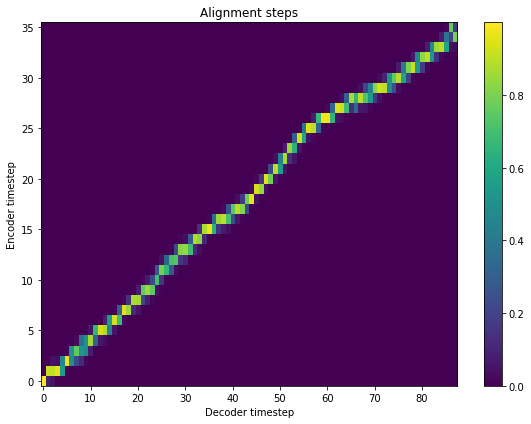

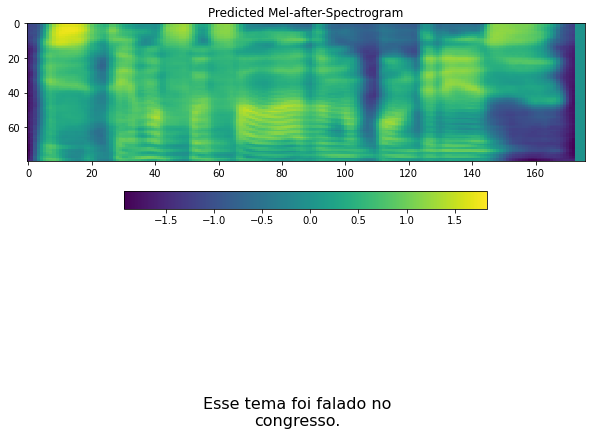

--------------------
--------------------
Leila tem um lindo casaco.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


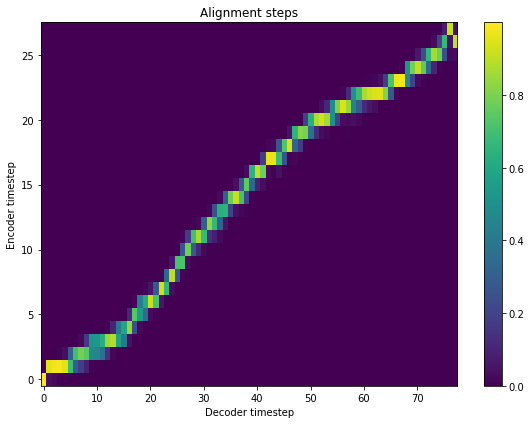

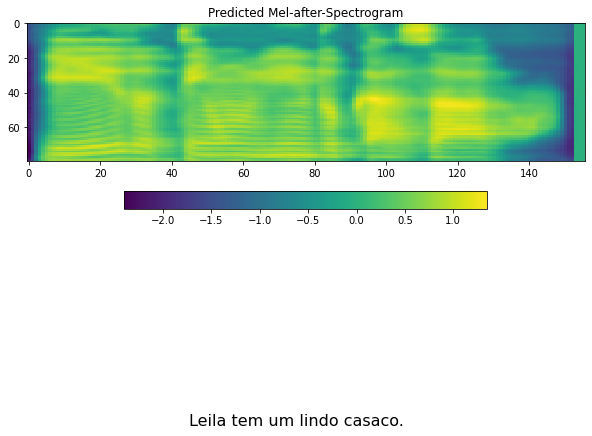

--------------------
--------------------
O analfabetísmo é um problema chato.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


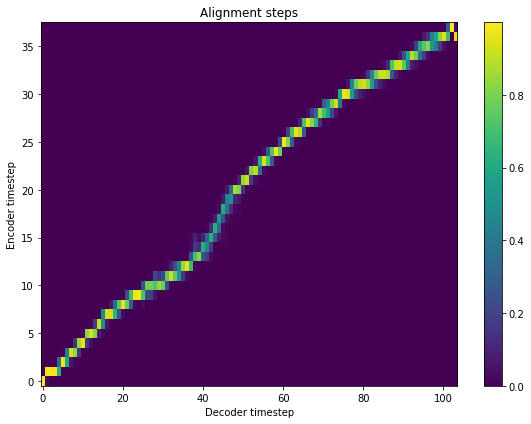

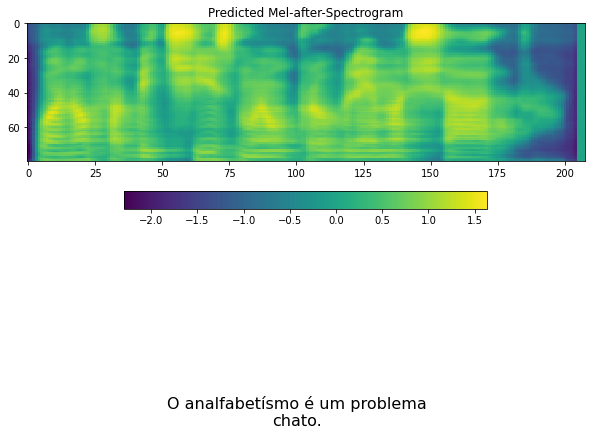

--------------------
--------------------
O casarão foi vendido sem pressa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


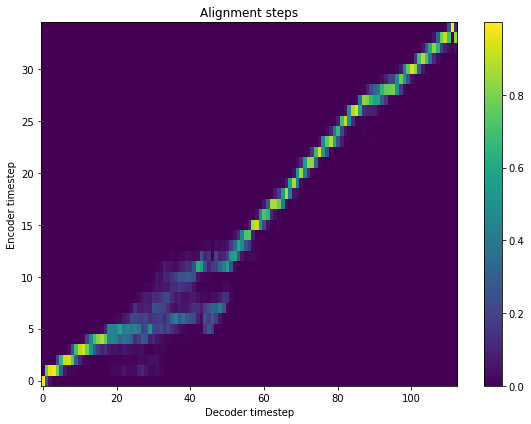

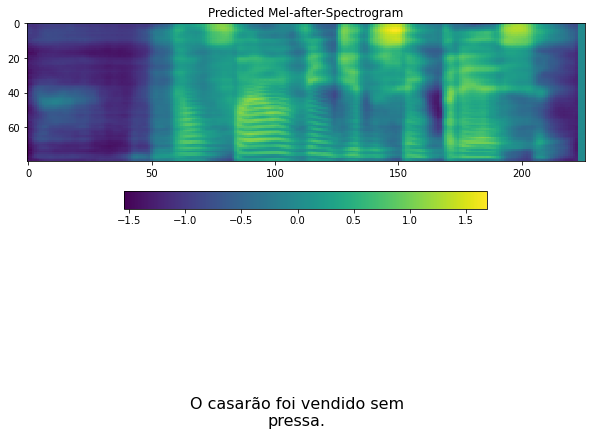

--------------------
--------------------
Agindo com união ainda rende mais.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


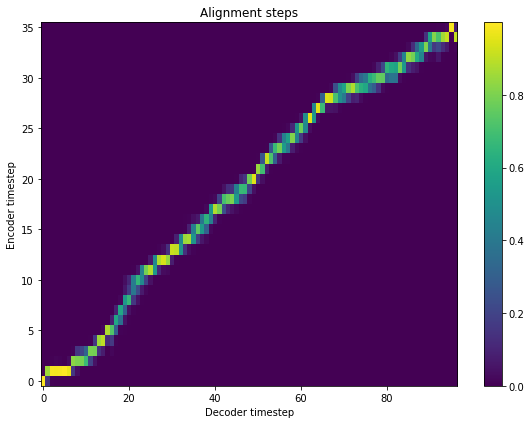

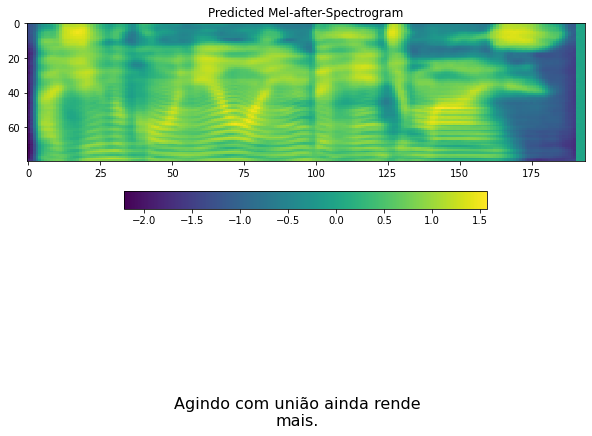

--------------------
--------------------
Recebi meu pai para almoçar.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


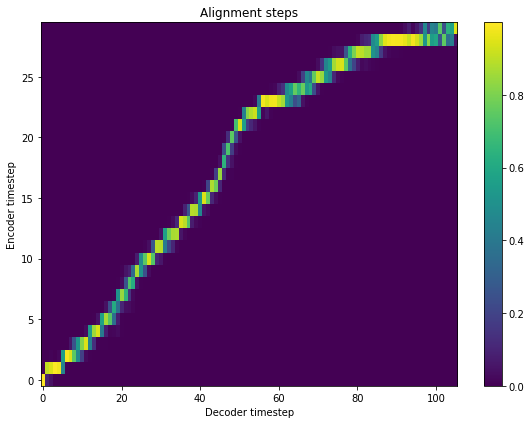

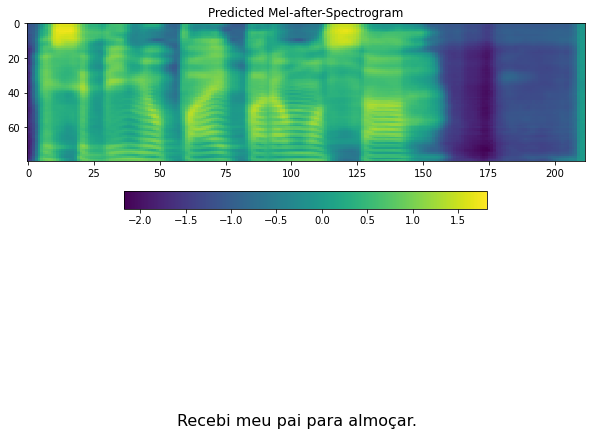

--------------------
--------------------
O trabalho é a vida do povo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


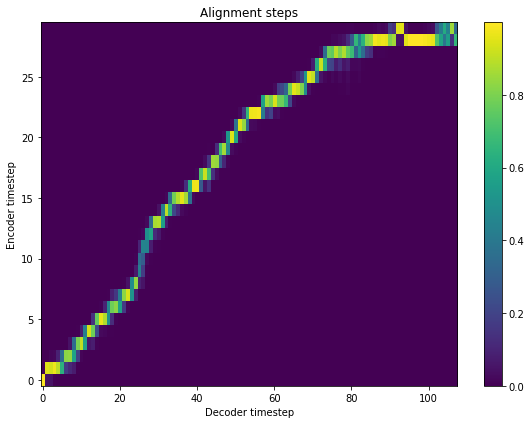

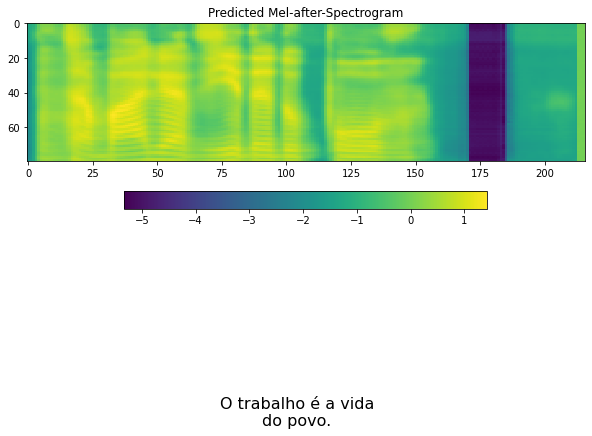

--------------------
--------------------
Isso se resolverá de maneira tranquila.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


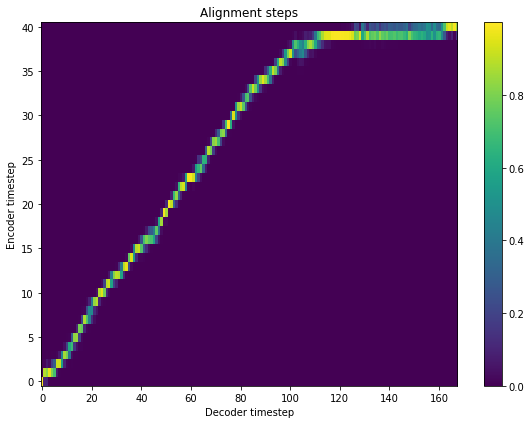

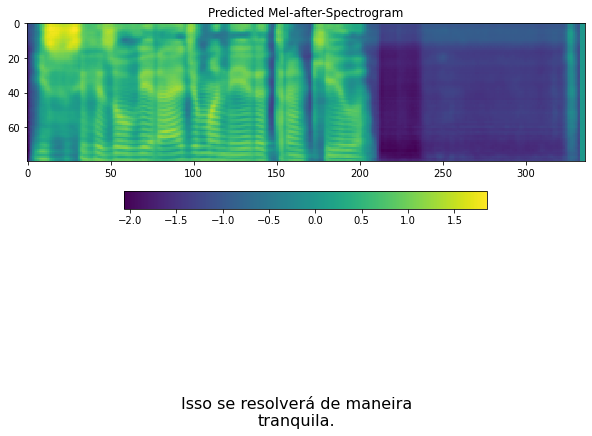

--------------------
--------------------
Os pesquisadores não acreditam nessa história.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


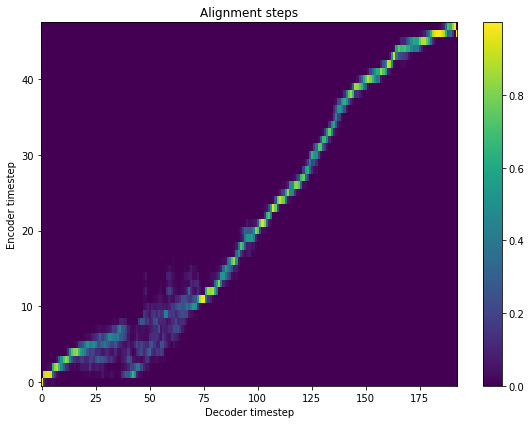

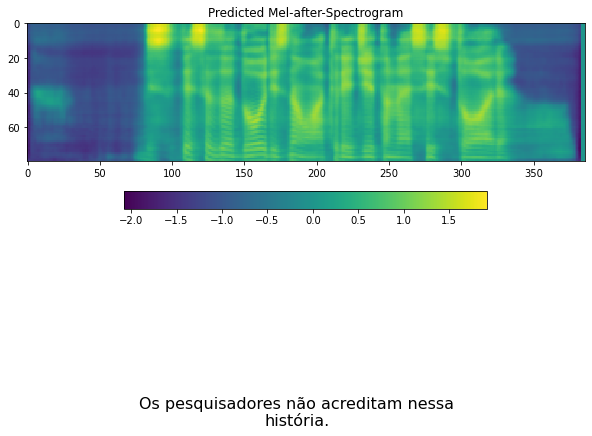

--------------------
--------------------
Sei que amanhã atingiremos a meta proposta
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_01


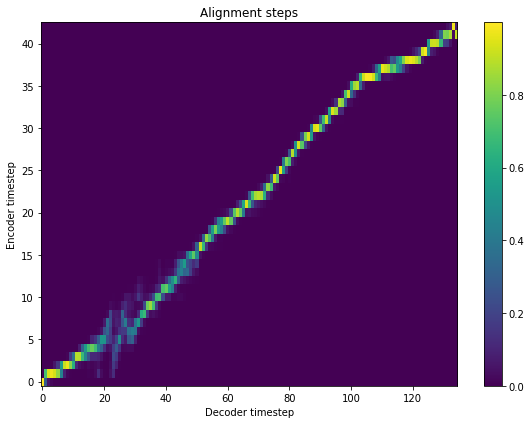

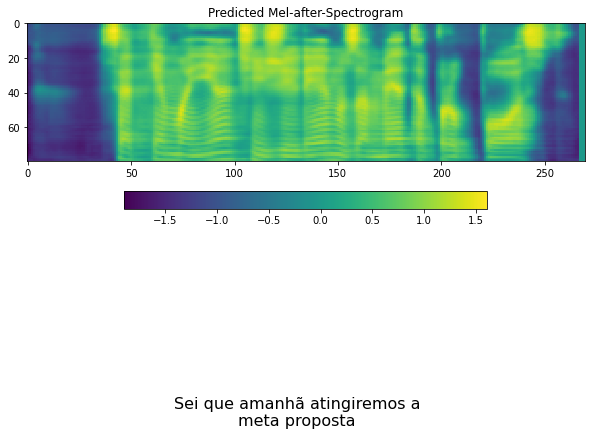

--------------------
--------------------
Nosso telefone está mudo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


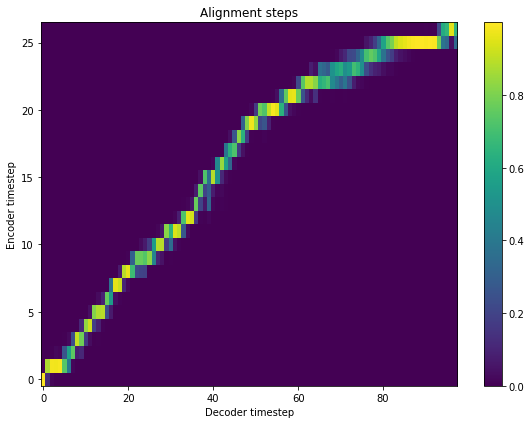

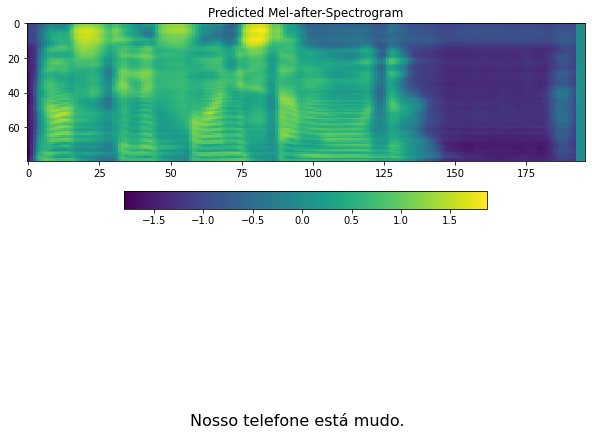

--------------------
--------------------
Desculpe se te chamo de velho.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


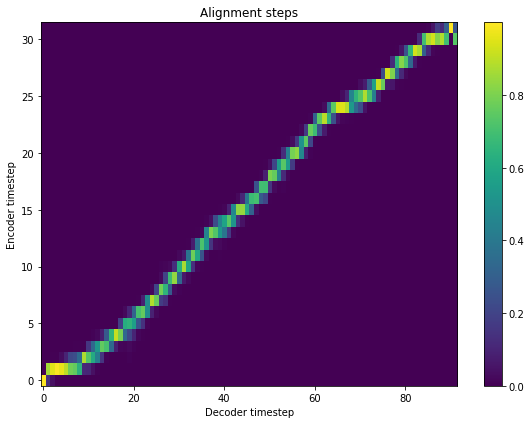

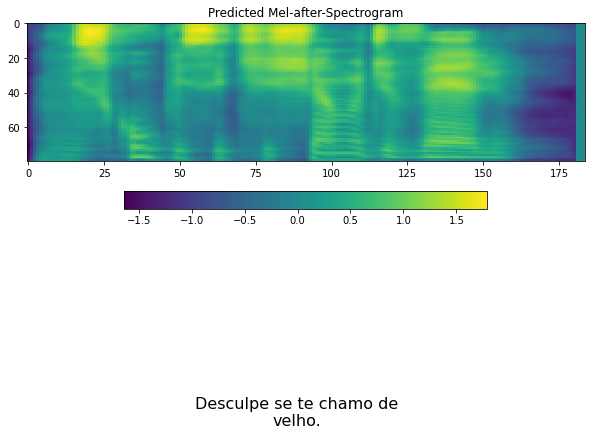

--------------------
--------------------
Queremos discutir o orçamento.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


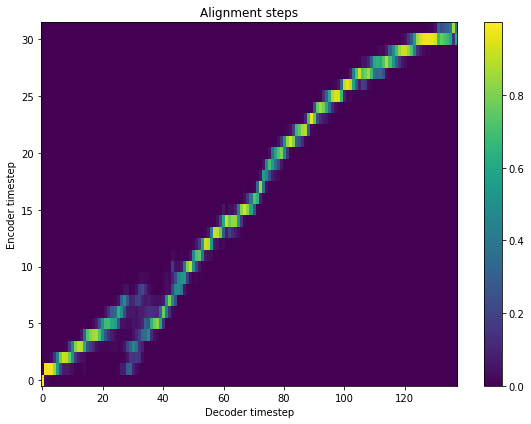

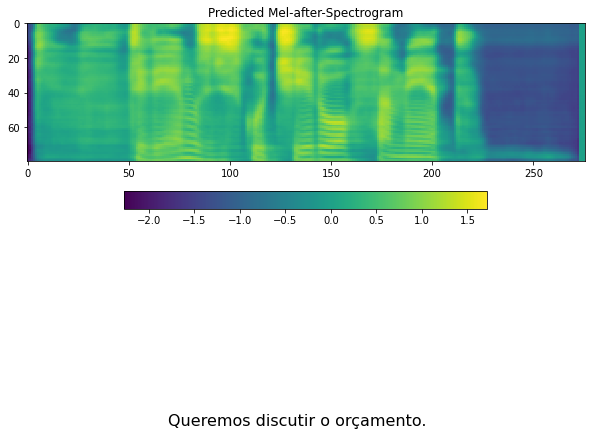

--------------------
--------------------
Ela não tem fome quando sai de casa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


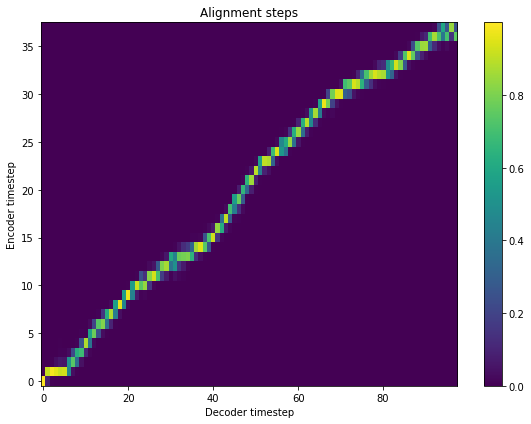

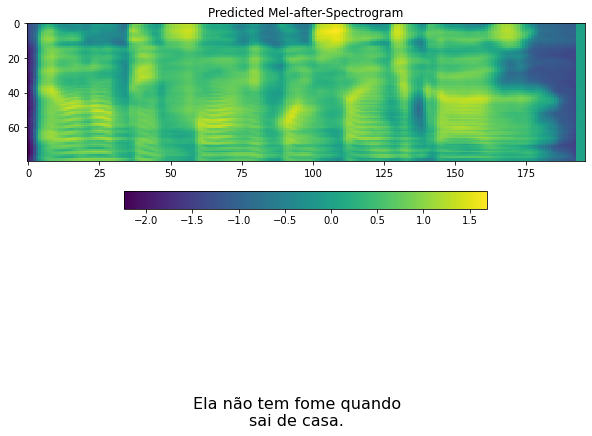

--------------------
--------------------
Uma índia andava na floresta.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


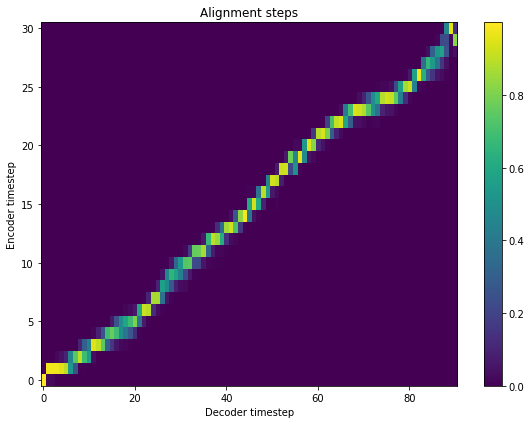

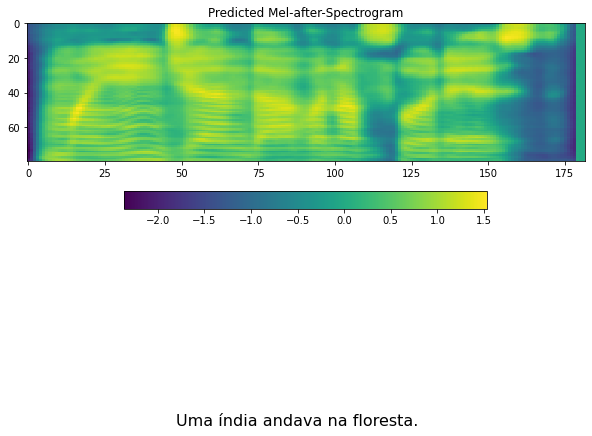

--------------------
--------------------
Zeca, corra bem rápido pra casa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


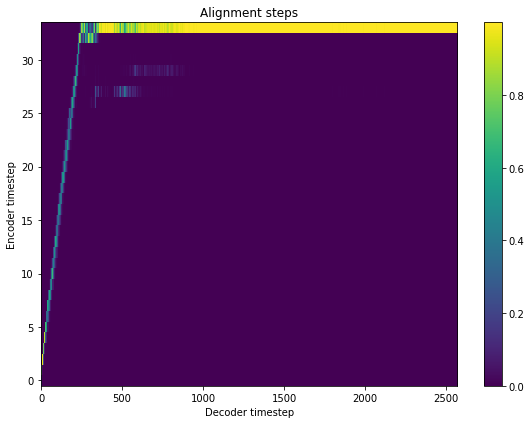

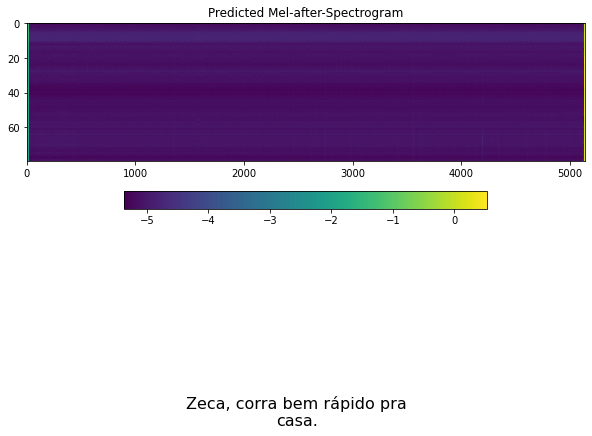

--------------------
--------------------
Neste caso, dormirei tranquilo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


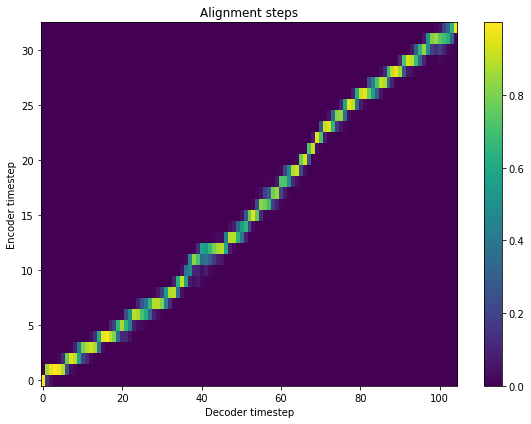

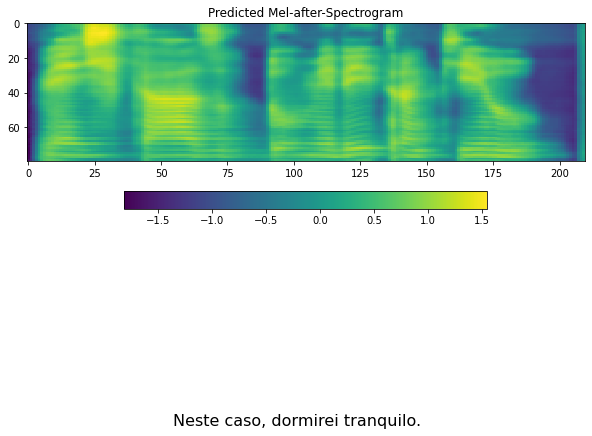

--------------------
--------------------
João deu dinheiro pro seu pai comprar um jogo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


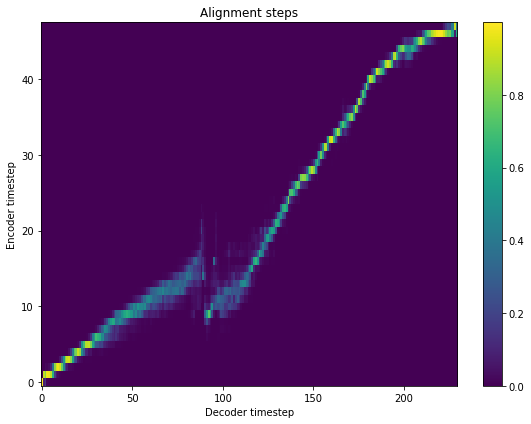

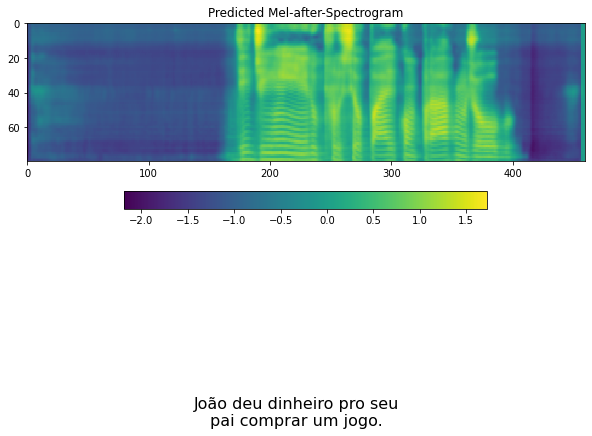

--------------------
--------------------
Ainda faltam seis minutos.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


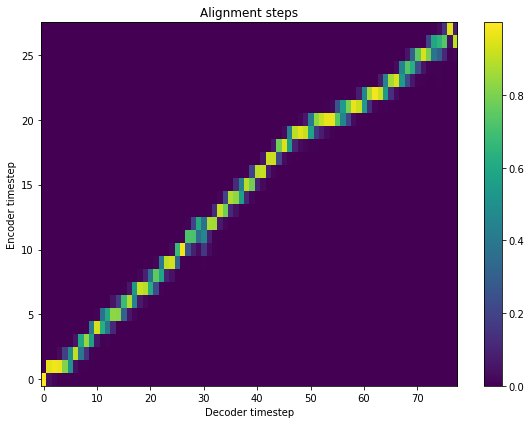

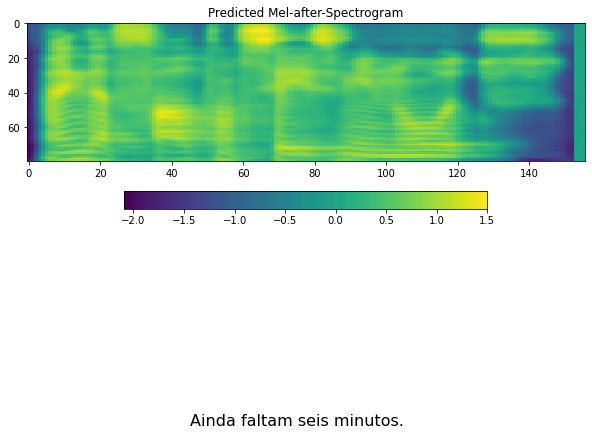

--------------------
--------------------
Ela seguia discretamente.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_02


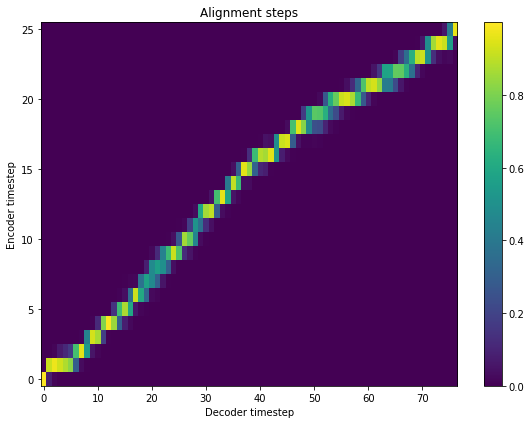

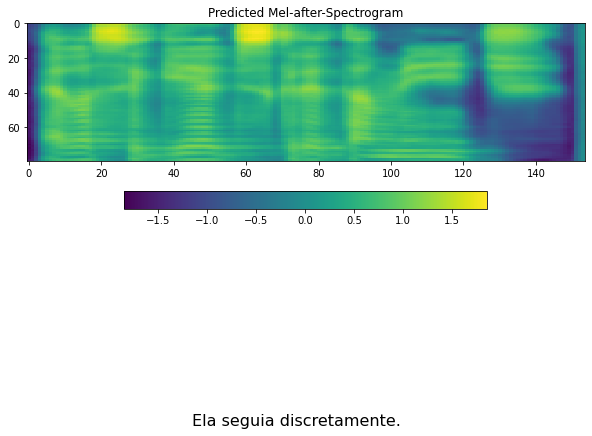

--------------------
--------------------
Eu vi logo a índia Joana e o Léo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


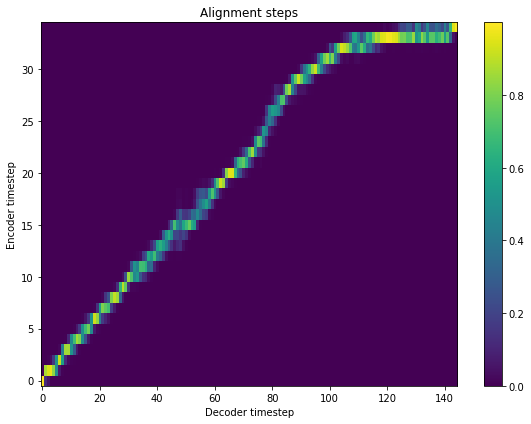

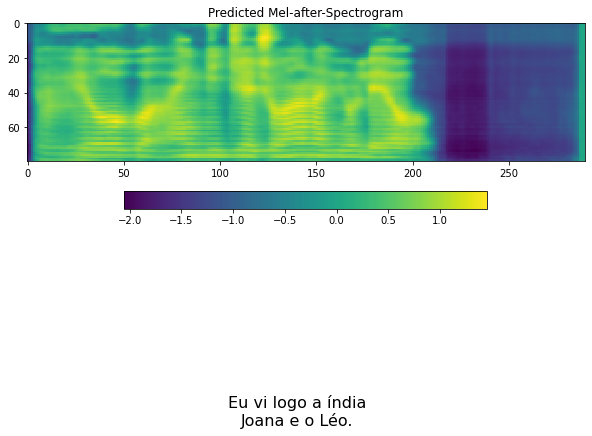

--------------------
--------------------
João caminhou na praia calma.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


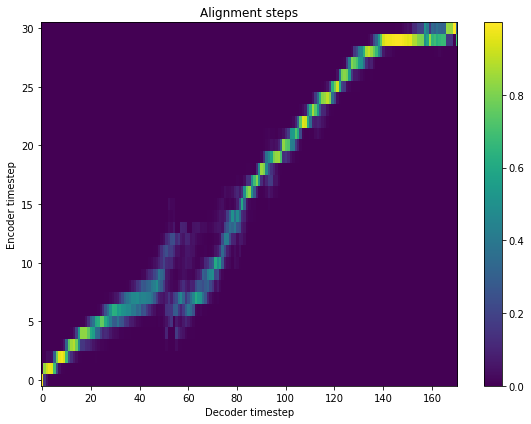

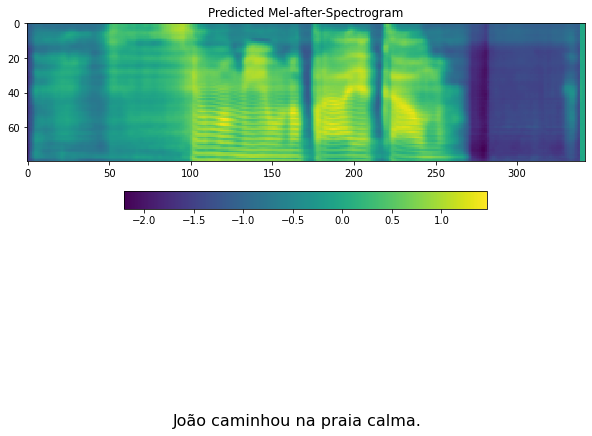

--------------------
--------------------
Vi Zé fazer essas viagens seis vezes.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


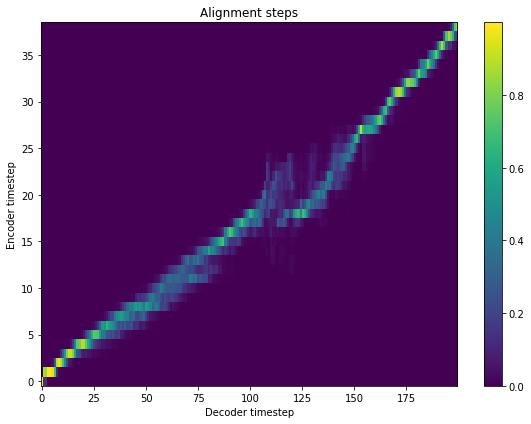

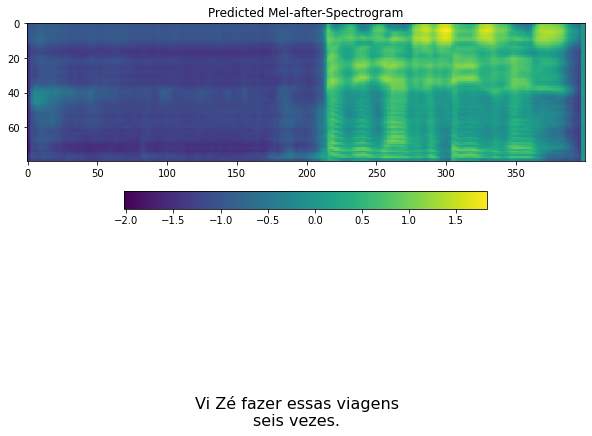

--------------------
--------------------
O atabaque do Tito é coberto com pele de gato.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


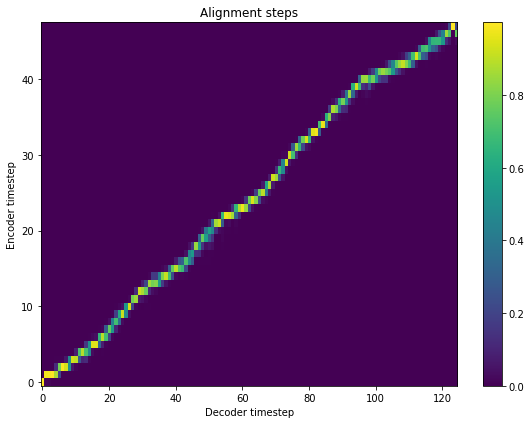

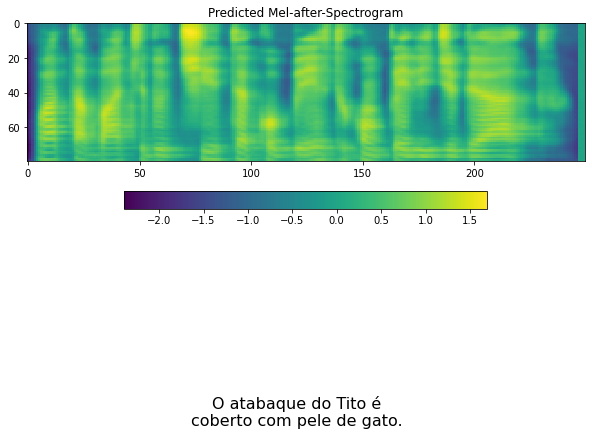

--------------------
--------------------
Ele dorme num leito de palha.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


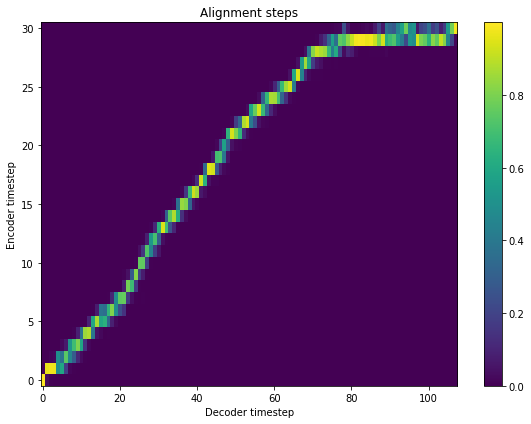

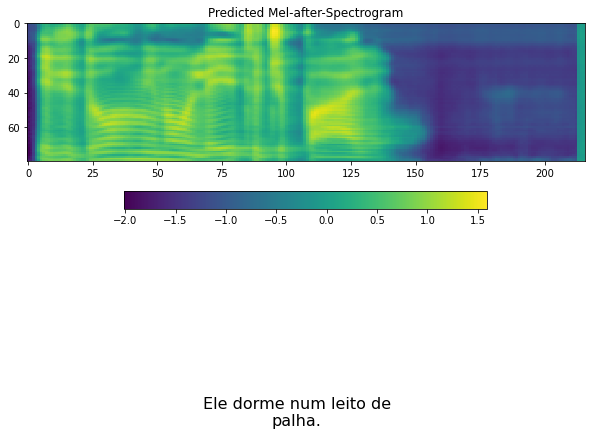

--------------------
--------------------
Paira um ar de arara amarela no Rio.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


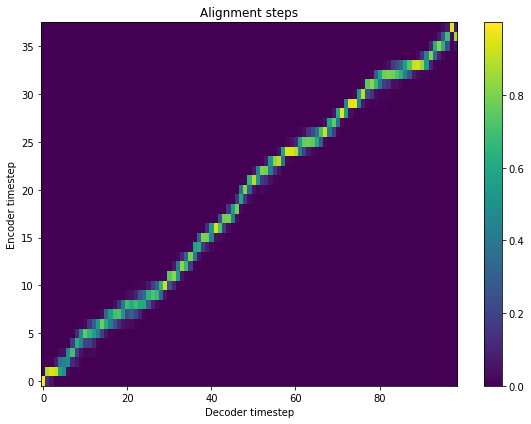

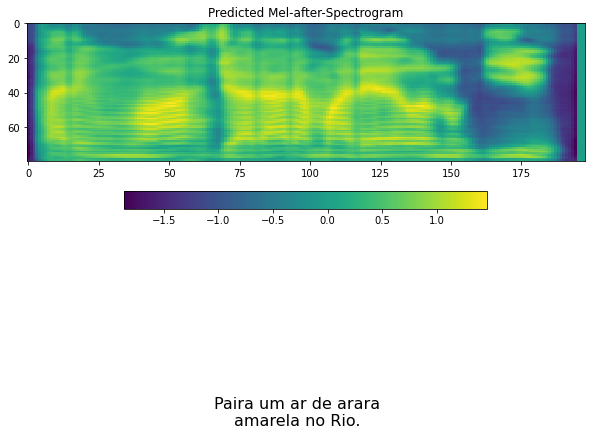

--------------------
--------------------
Foi muito difícil entender a canção de natal.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


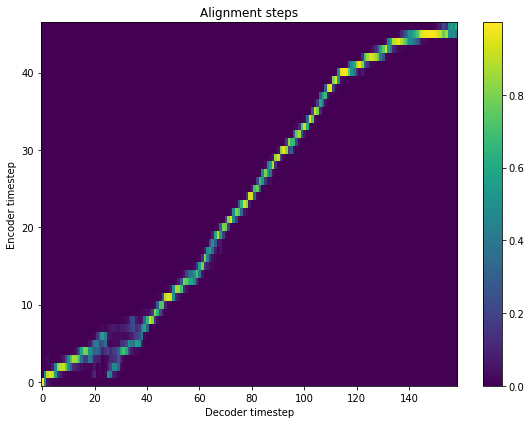

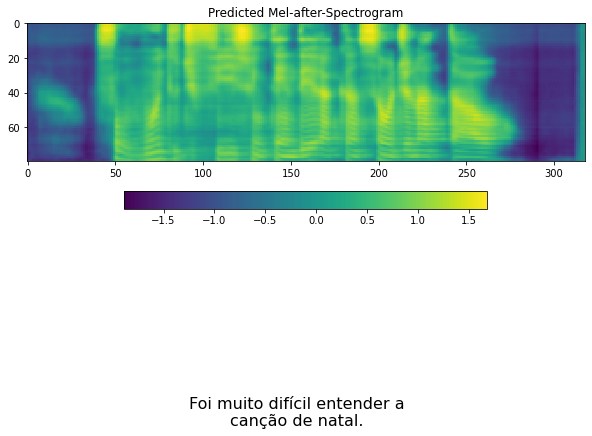

--------------------
--------------------
Depois do almoço te encontro pro chá.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


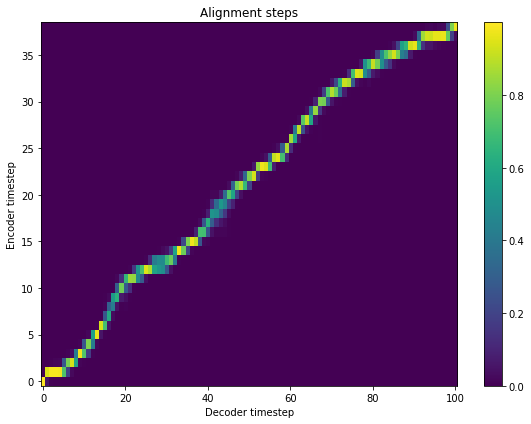

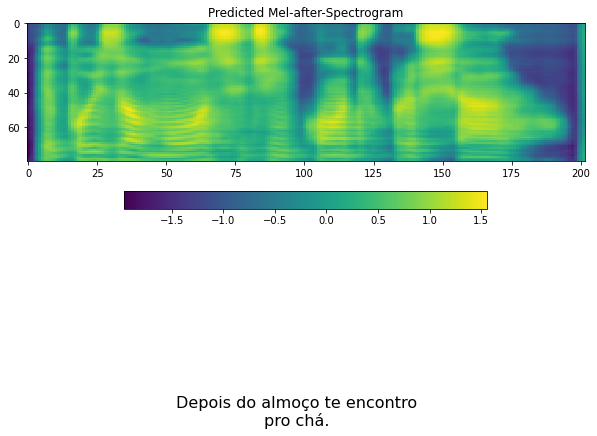

--------------------
--------------------
Esses são nossos timezinhos.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


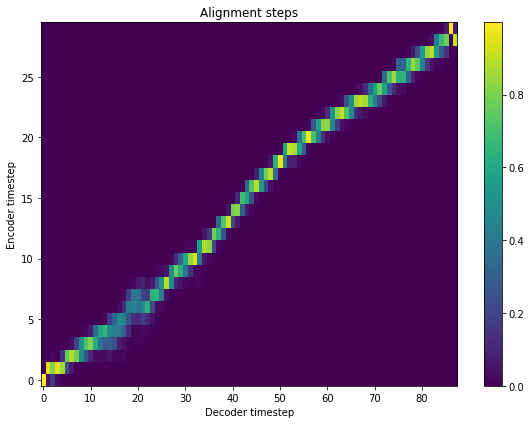

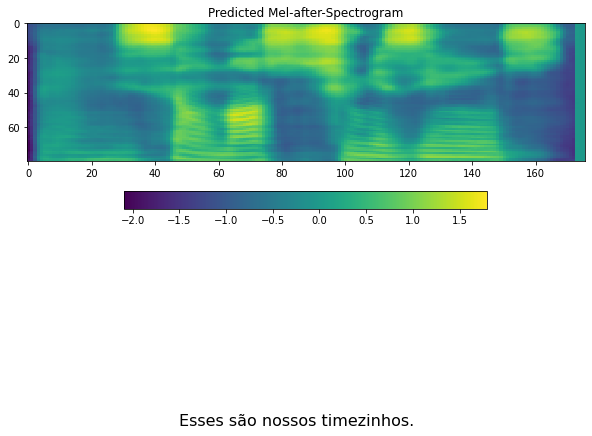

--------------------
--------------------
Procurei Maria em casa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_03


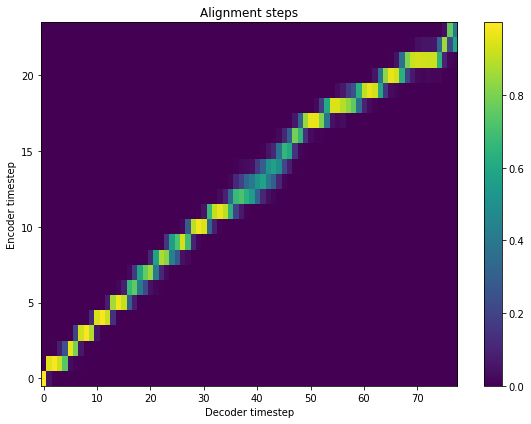

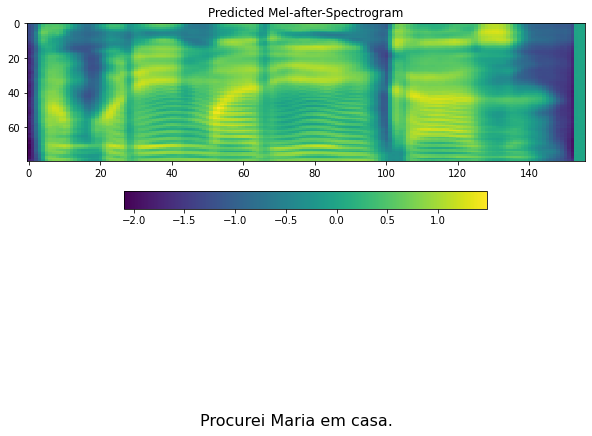

--------------------
--------------------
A pesca é proibida nesse canto.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


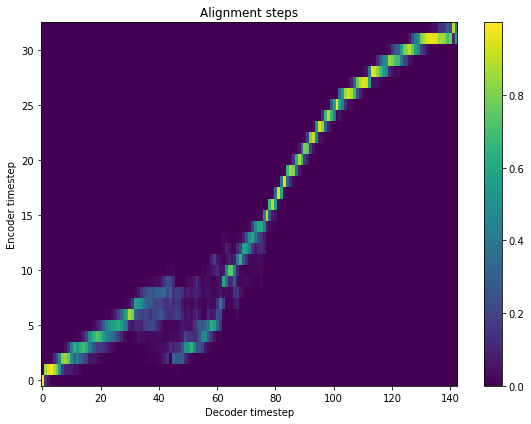

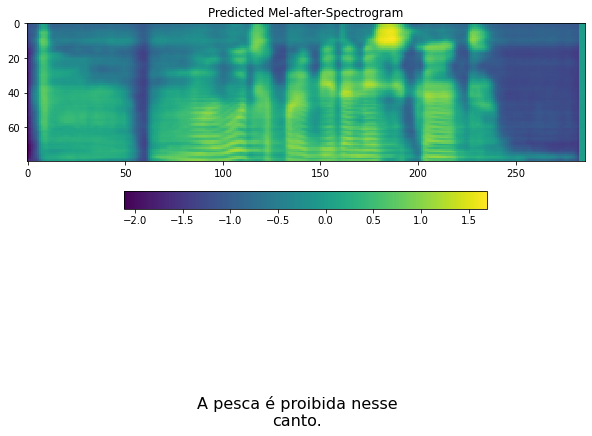

--------------------
--------------------
Quero te ver bem quando ele voltar de lá.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


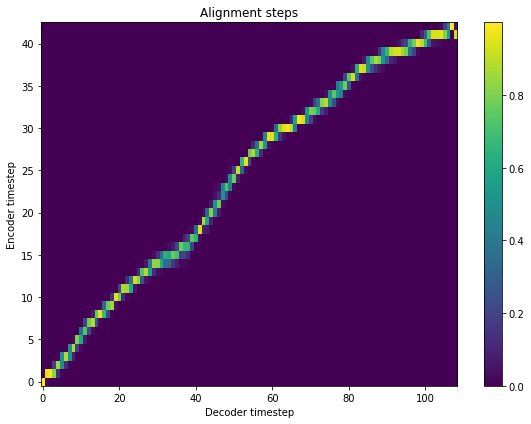

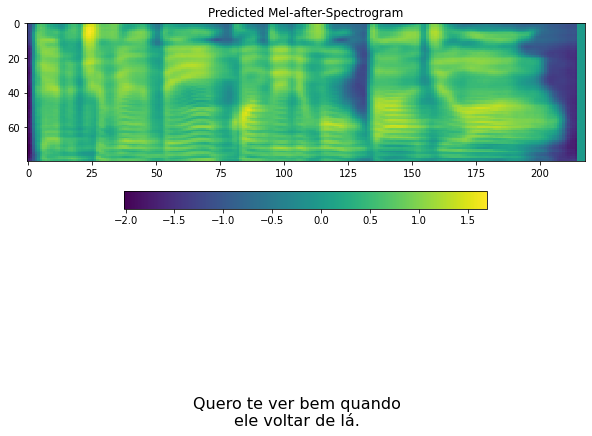

--------------------
--------------------
Tenho muito orgulho de nossa gente.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


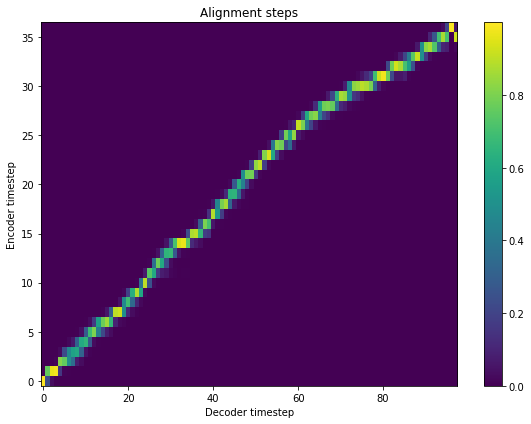

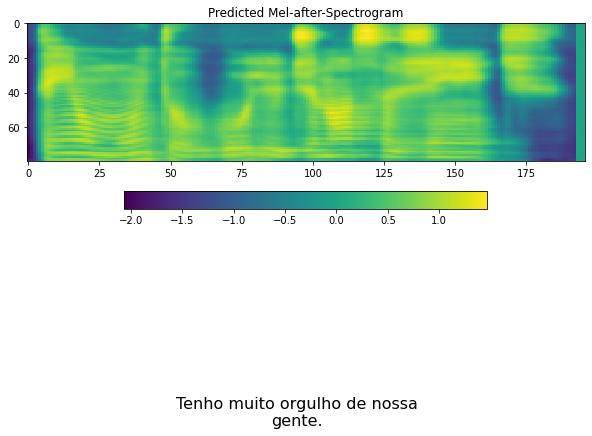

--------------------
--------------------
O inspetor faz a vistoria completa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


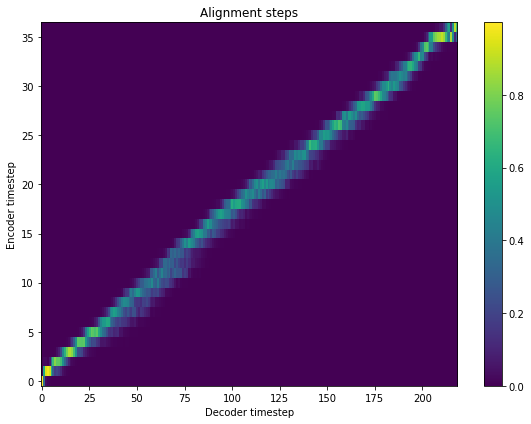

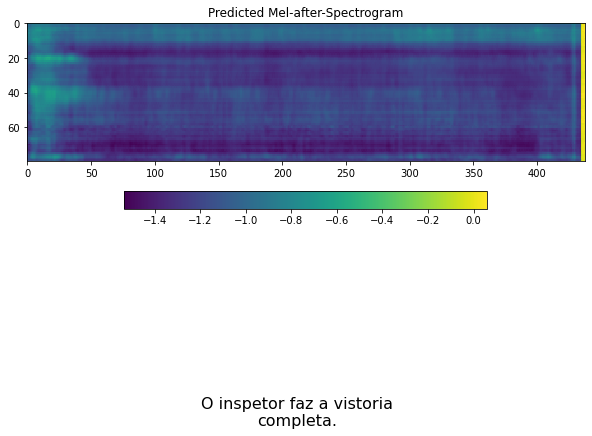

--------------------
--------------------
Ainda não se sabe o dia da prova.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


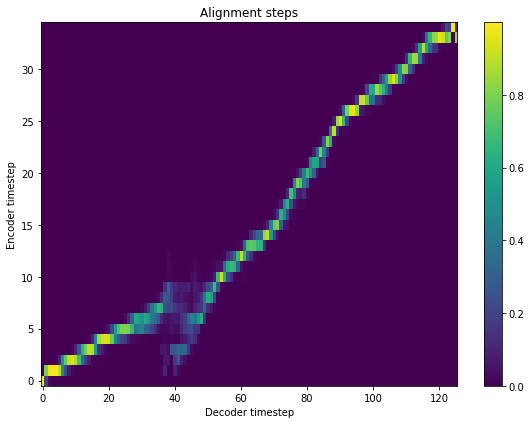

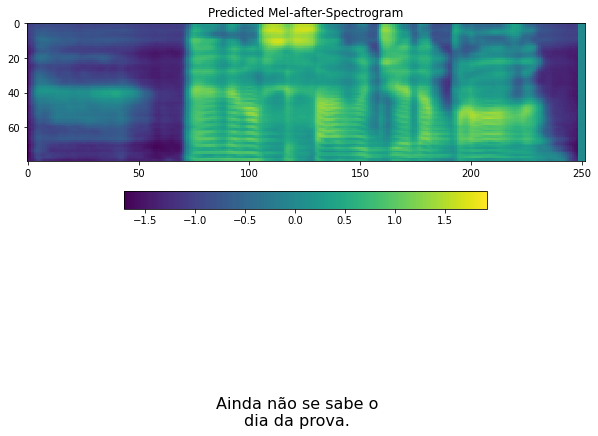

--------------------
--------------------
Será muito dificil conseguir que eu coma.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


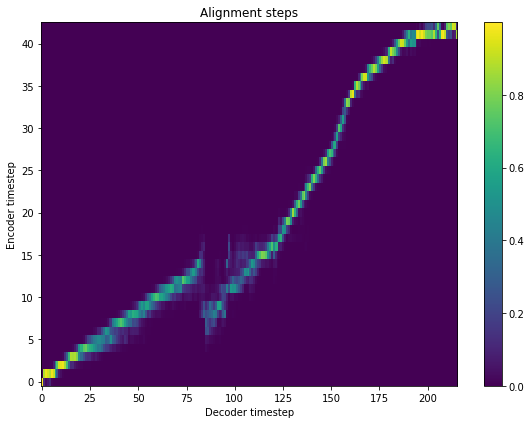

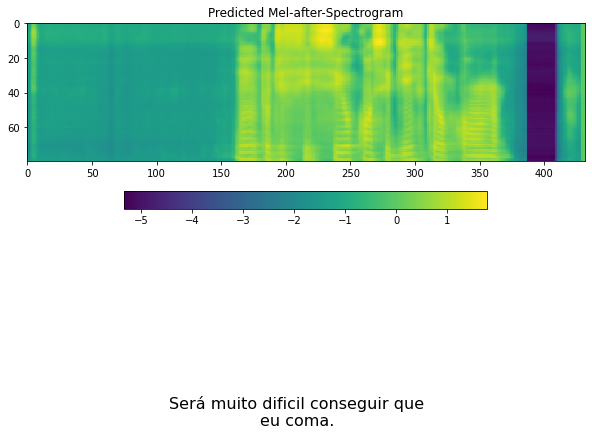

--------------------
--------------------
A paixão dele é a natureza.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


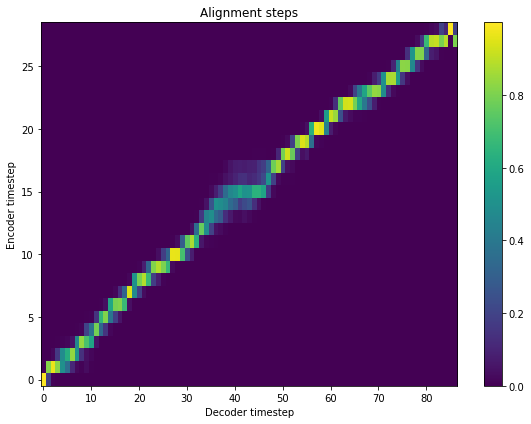

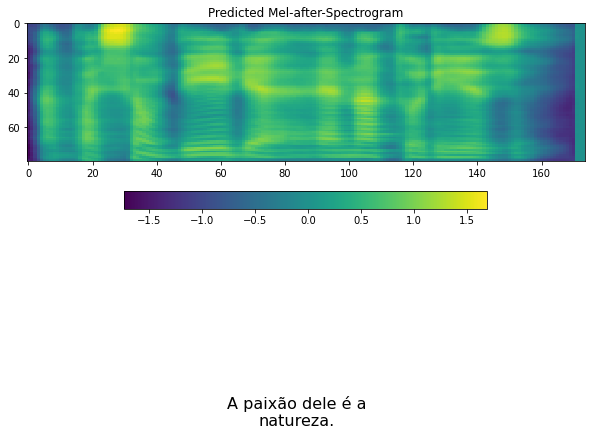

--------------------
--------------------
Você quer me dizer a data?
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


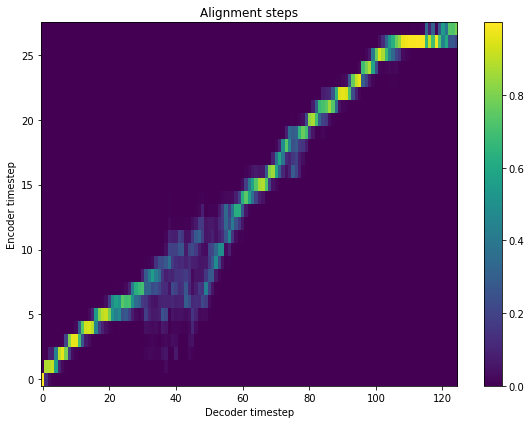

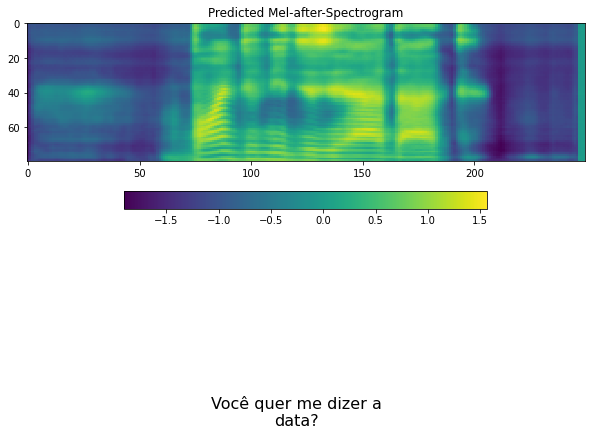

--------------------
--------------------
Desculpe, mas me atrasei no casamento.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


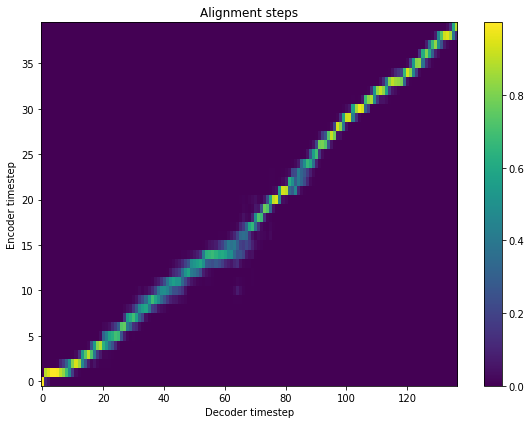

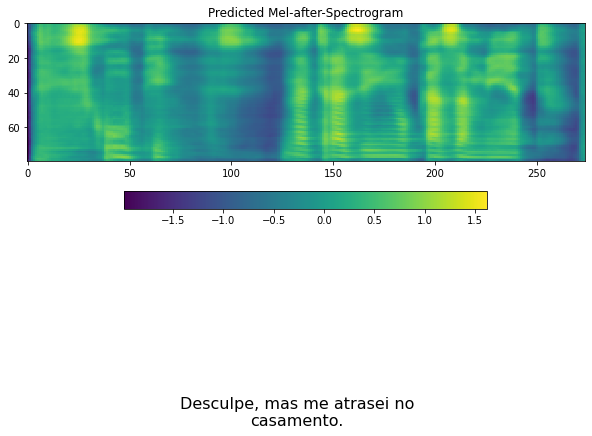

--------------------
--------------------
Faz um desvio em direção ao mar.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_04


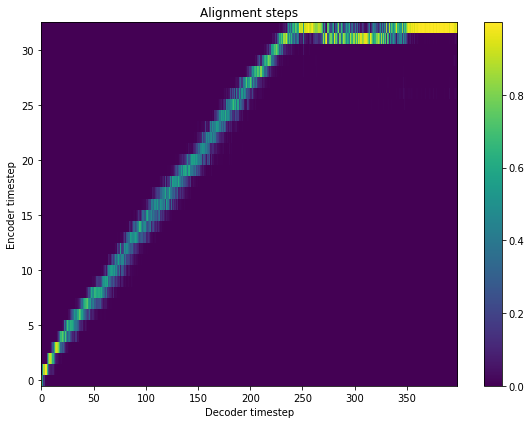

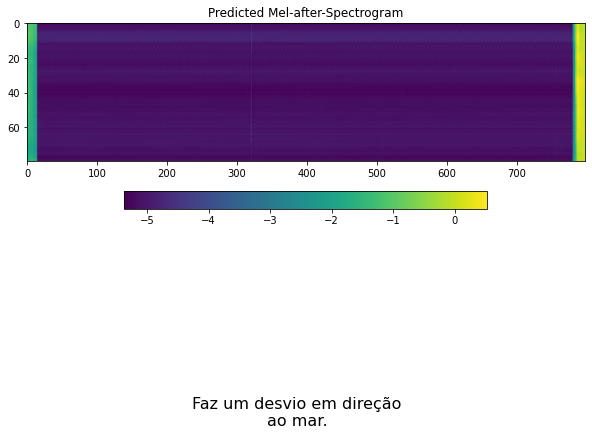

--------------------
--------------------
O velho tigre ainda aceita combate.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


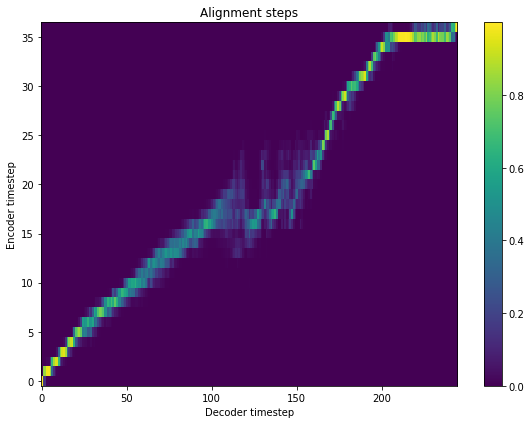

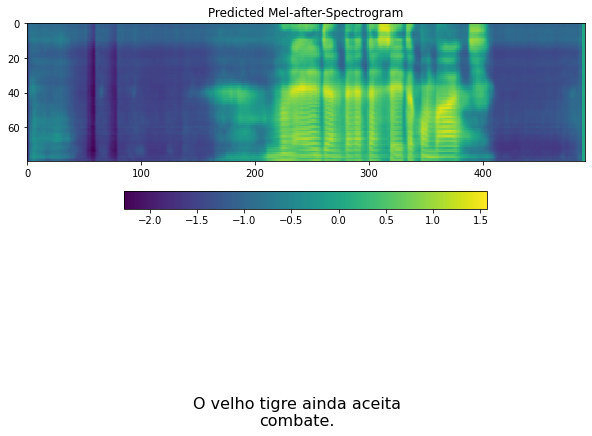

--------------------
--------------------
É hora do homem se humanizar mais.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


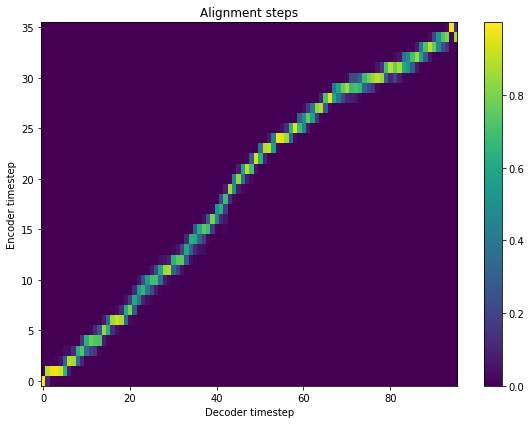

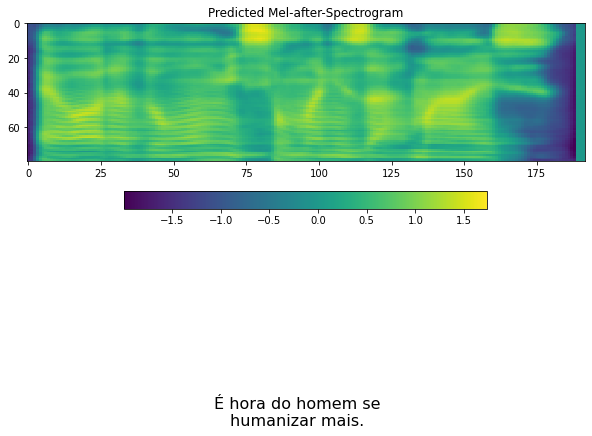

--------------------
--------------------
Ela ficou na fazenda por uma hora.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


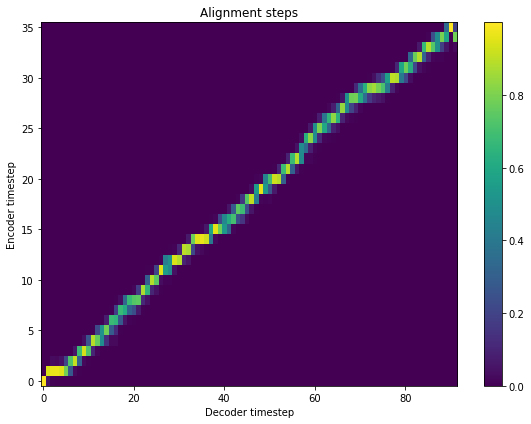

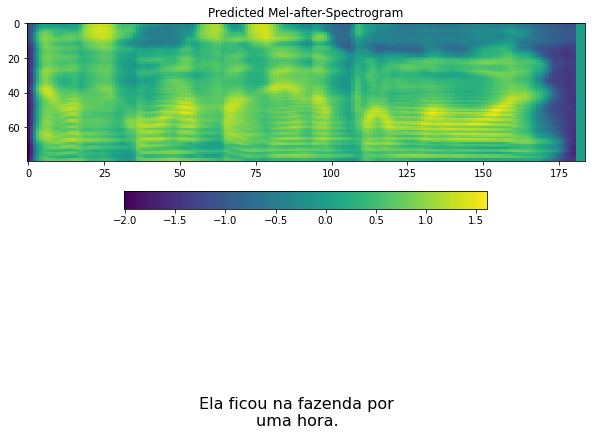

--------------------
--------------------
Seu crime foi encoberto pelo capataz.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


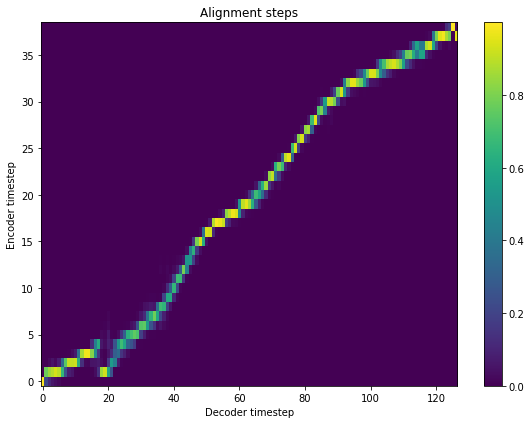

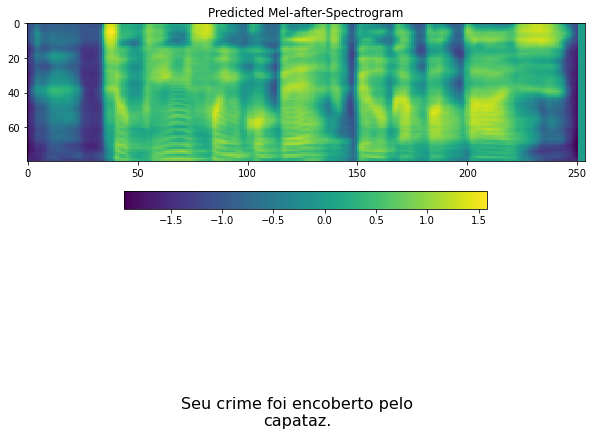

--------------------
--------------------
A escuridão do quarto assustou a criança.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


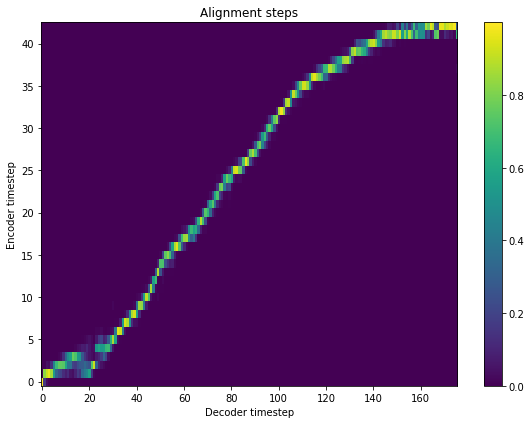

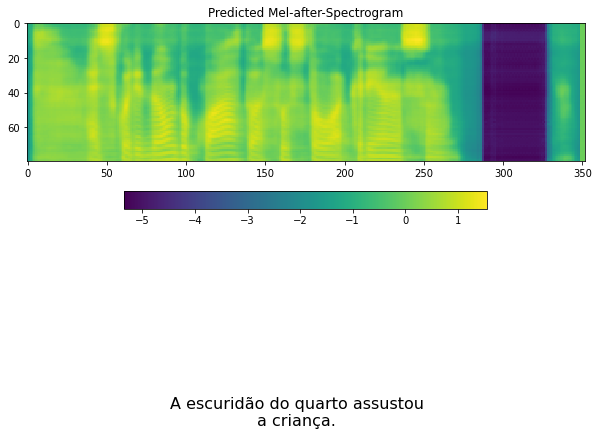

--------------------
--------------------
Hoje, eu não pude fazer minha ginástica.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


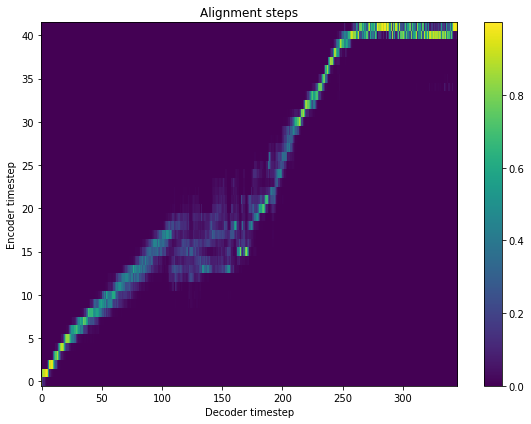

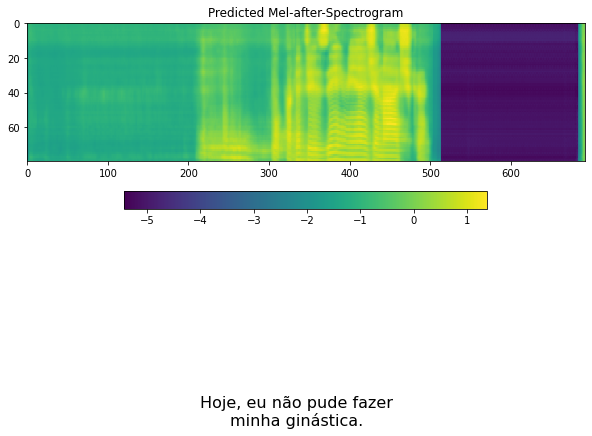

--------------------
--------------------
Comer quindim é sempre uma boa pedida.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


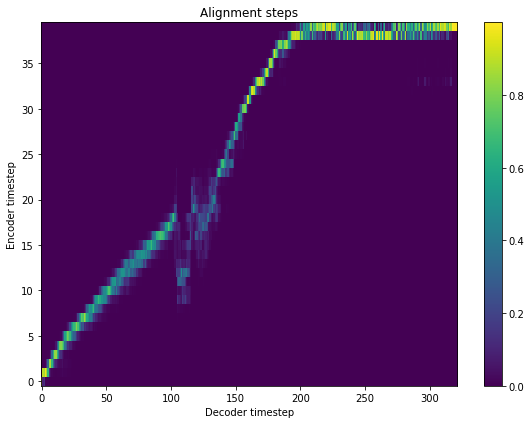

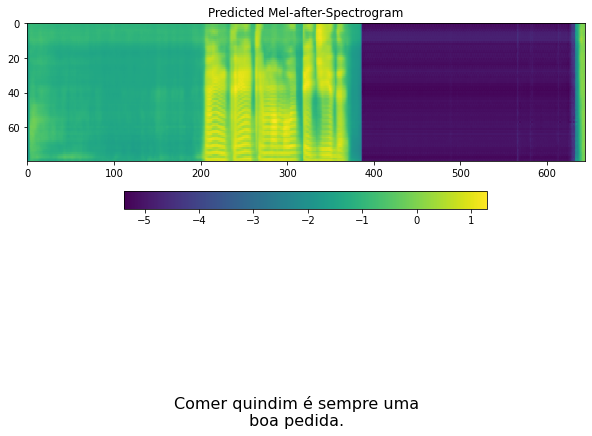

--------------------
--------------------
Hoje irei precisar de você.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


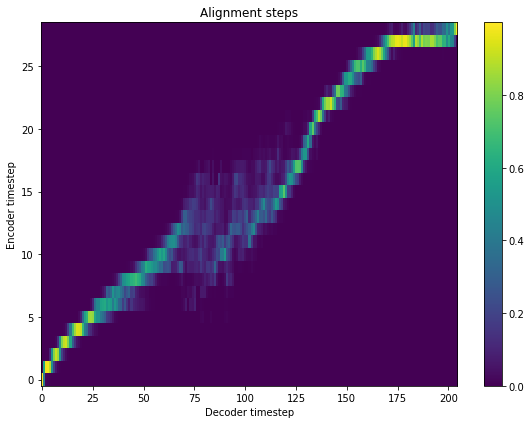

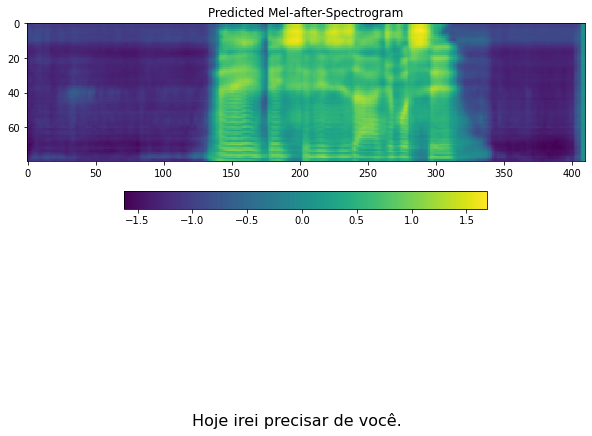

--------------------
--------------------
Sem ele o tempo flui num ritmo suave.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


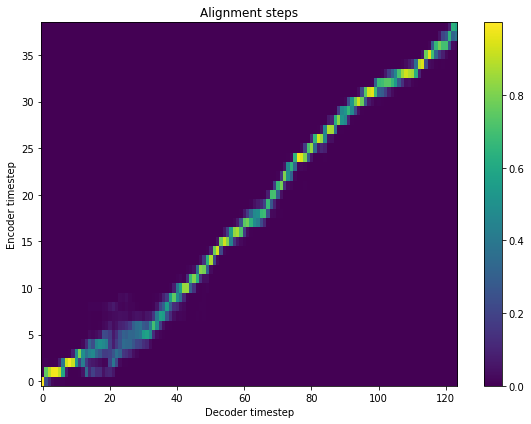

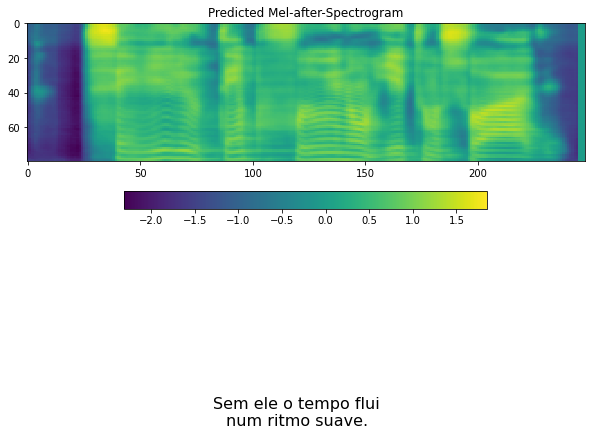

--------------------
--------------------
A sujeira lançada no rio contamina os peixes.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_05


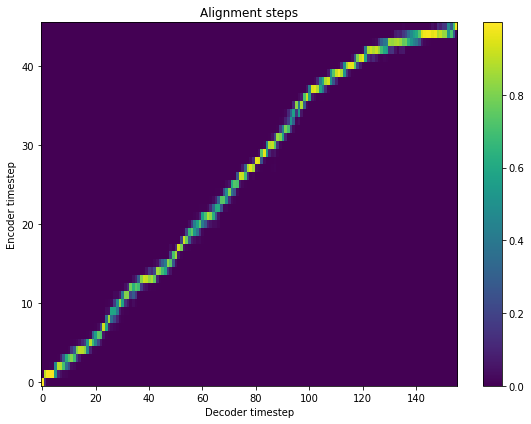

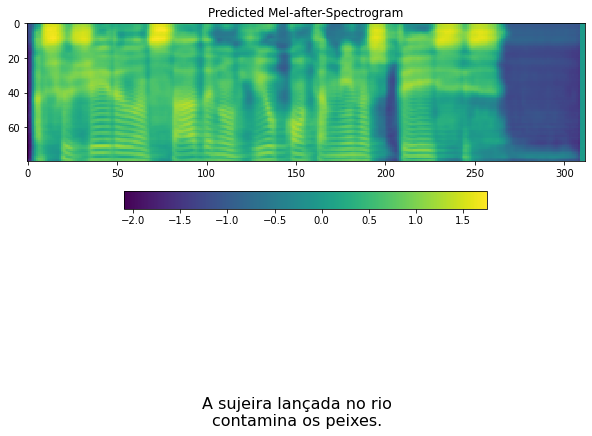

--------------------
--------------------
O jogo será transmitido à tarde.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


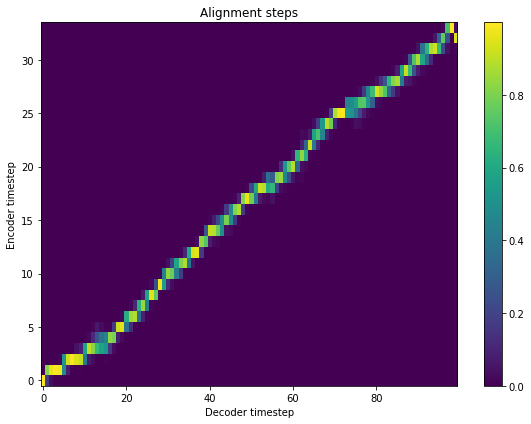

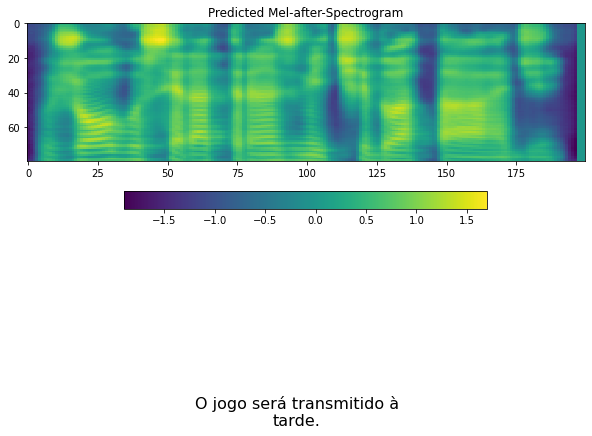

--------------------
--------------------
É possível que ele já esteja fora de perigo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


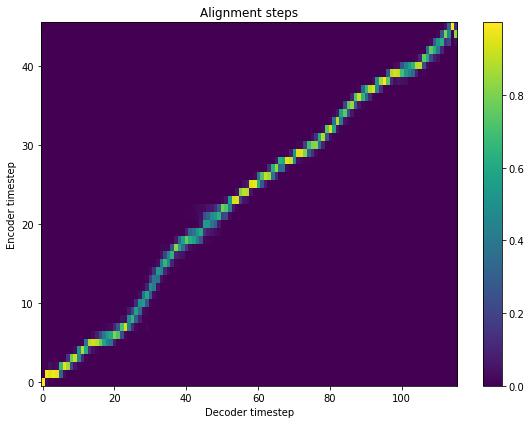

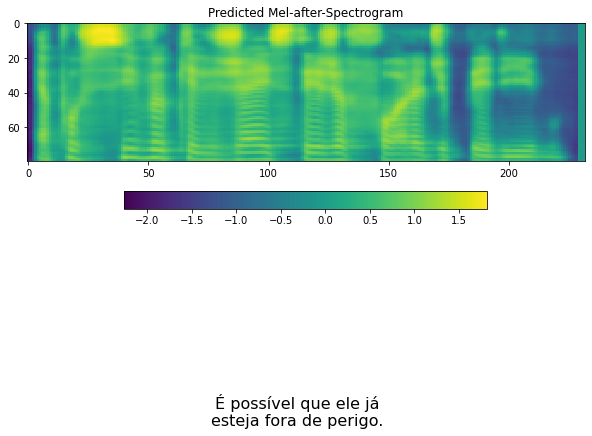

--------------------
--------------------
A explicação pode ser encontrada na tese.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


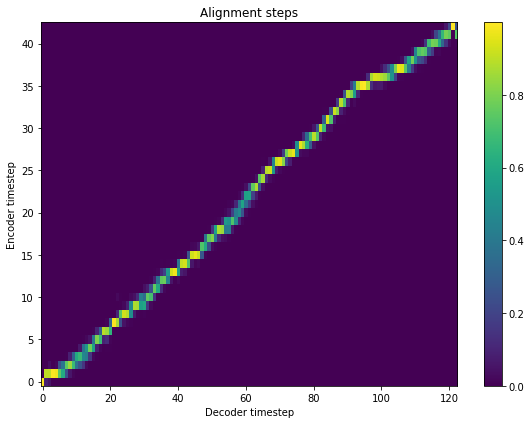

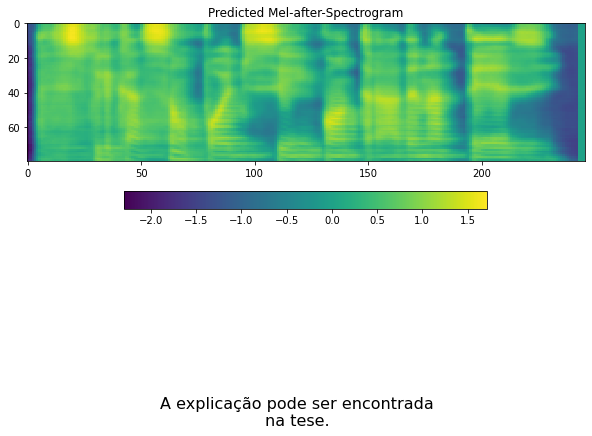

--------------------
--------------------
Meu vôo tinha sido marcado para as cinco horas.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


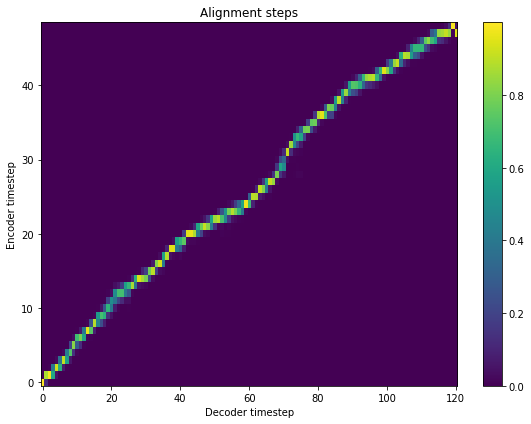

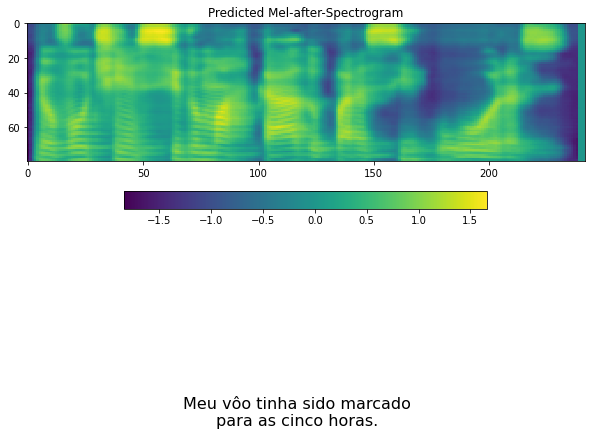

--------------------
--------------------
Daqui a pouco a gente vai ao baile.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


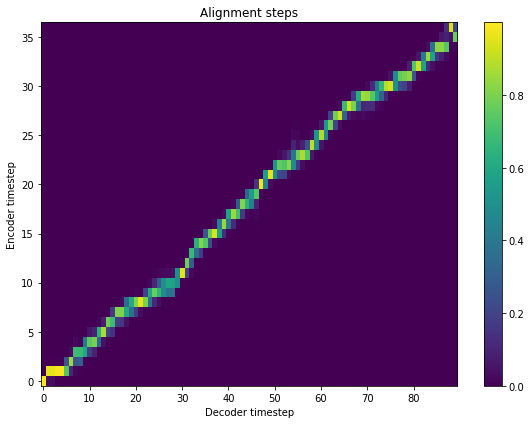

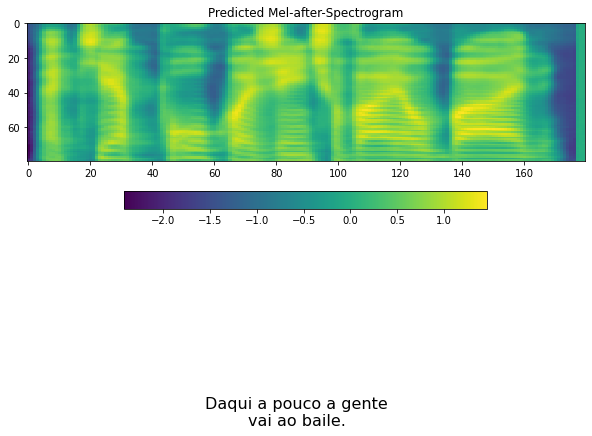

--------------------
--------------------
Estou certo que mereço a atenção dela.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


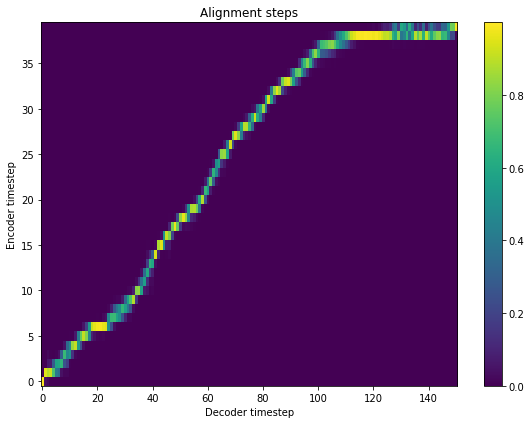

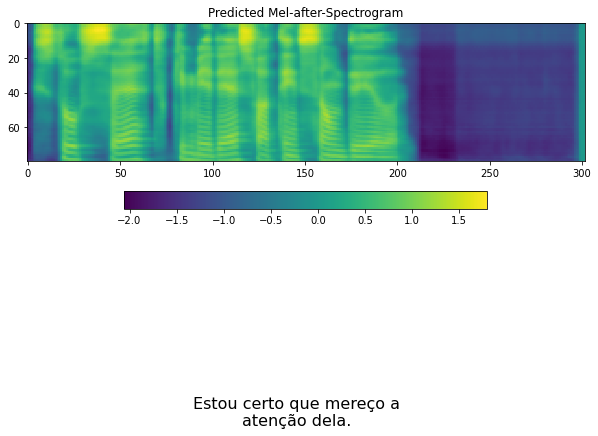

--------------------
--------------------
Era um belo enfeite todo de palha.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


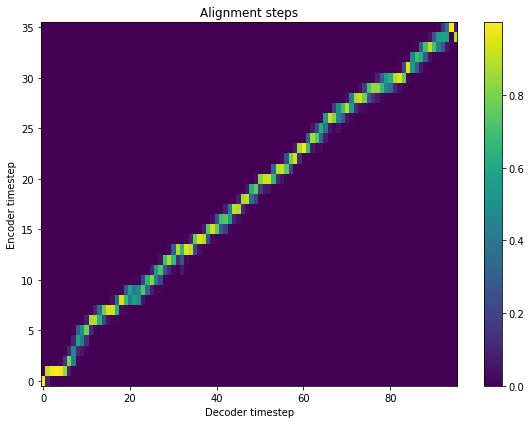

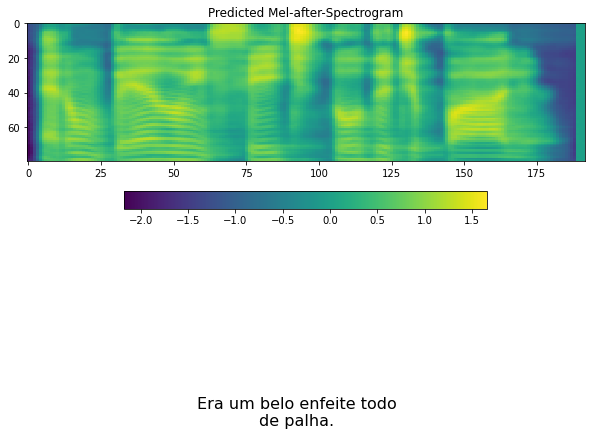

--------------------
--------------------
O comércio daqui é bem tranquilo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


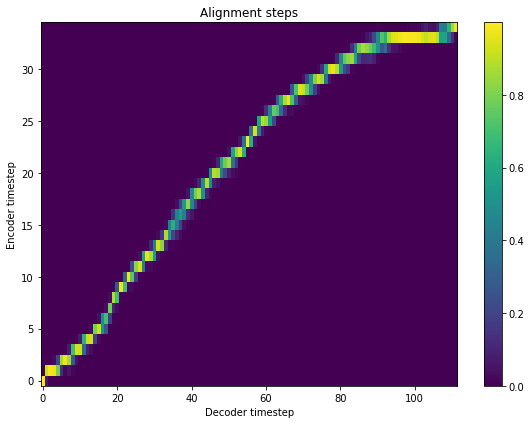

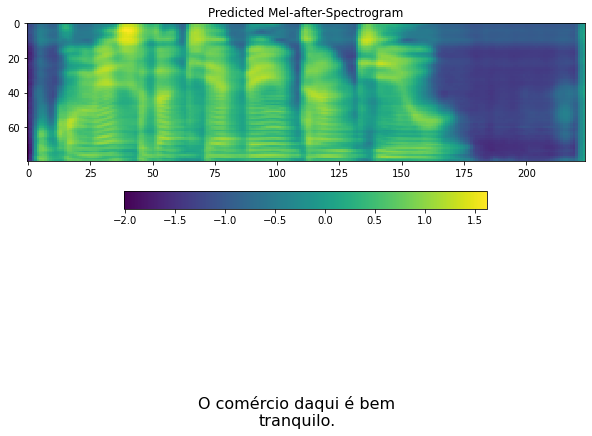

--------------------
--------------------
É a minha chance de esclarecer a notícia.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


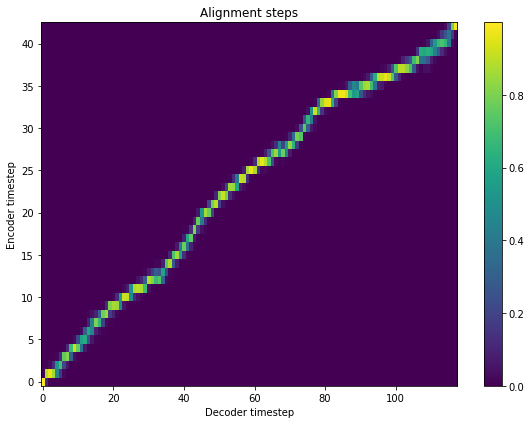

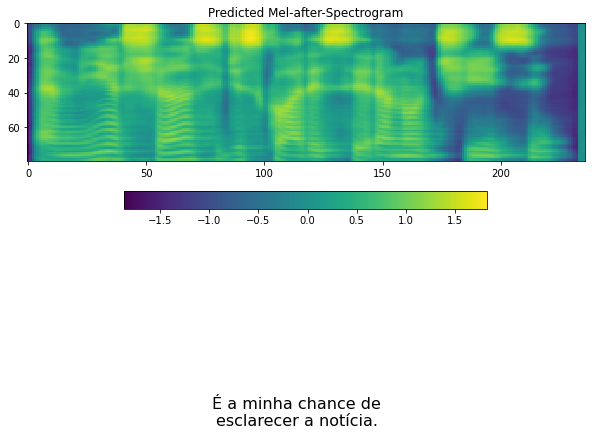

--------------------
--------------------
A visita transformou-se numa reunião.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_06


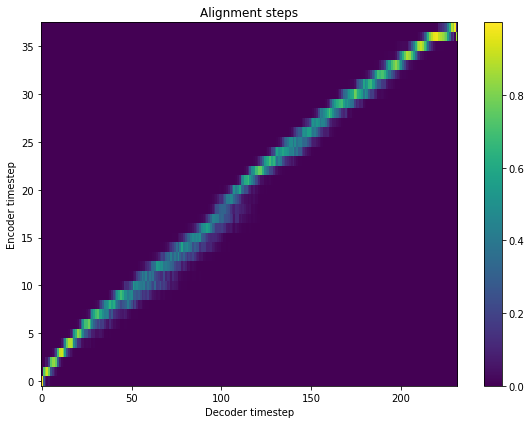

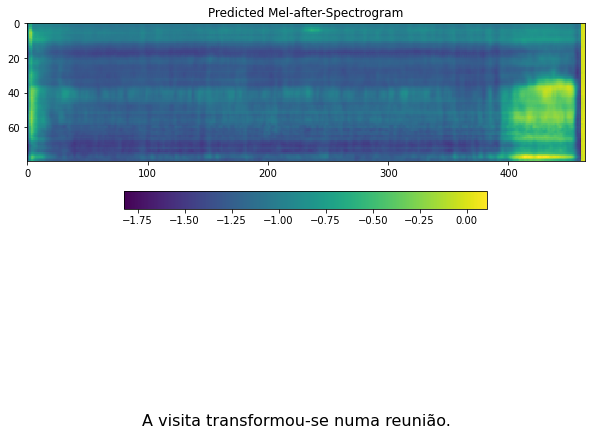

--------------------
--------------------
O cenário da história é um subúrbio da cidade.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


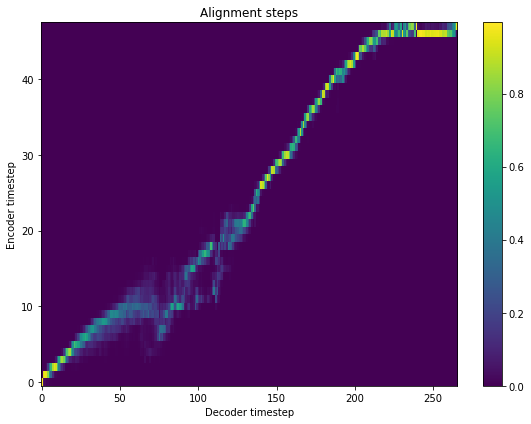

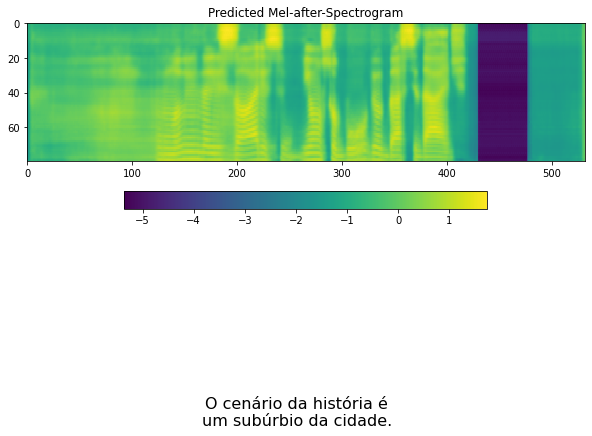

--------------------
--------------------
Eu tenho uma ótima razão pra festejar.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


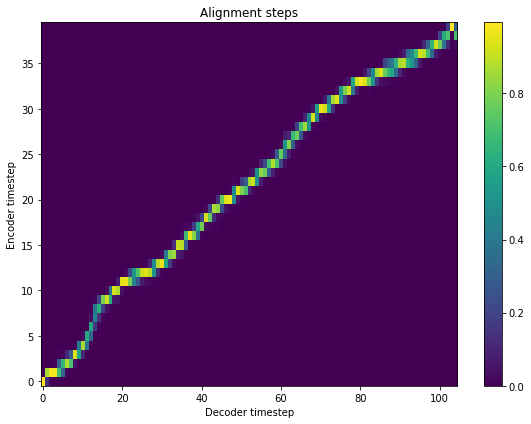

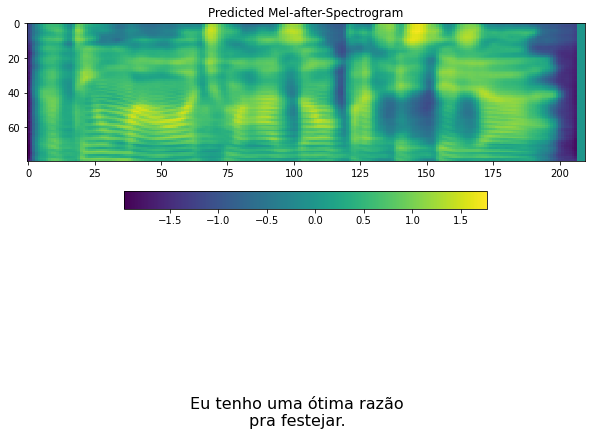

--------------------
--------------------
A pequena nave medirá o campo magnético.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


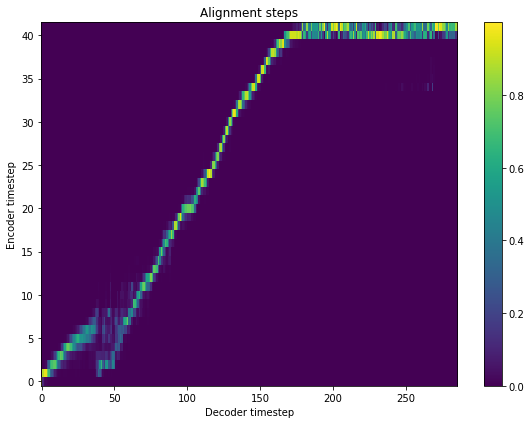

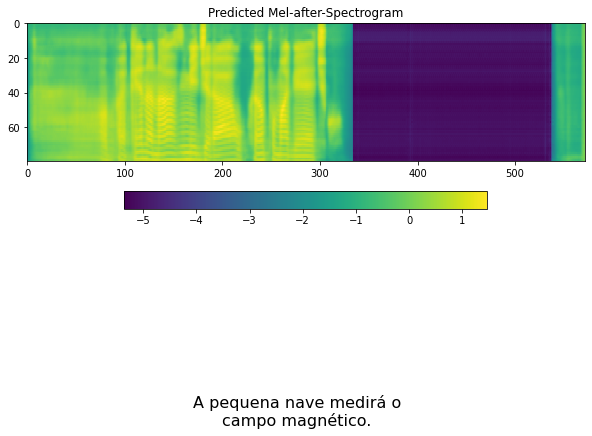

--------------------
--------------------
O prêmio será entregue na sessão solene.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


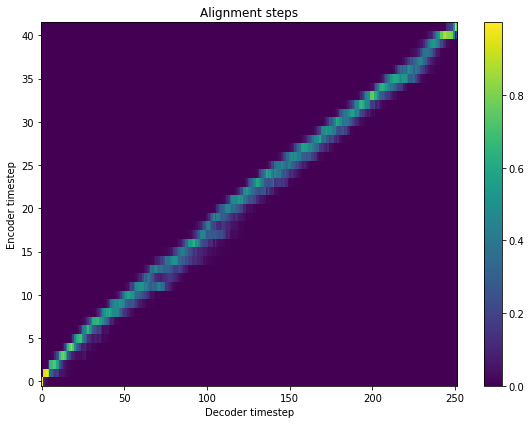

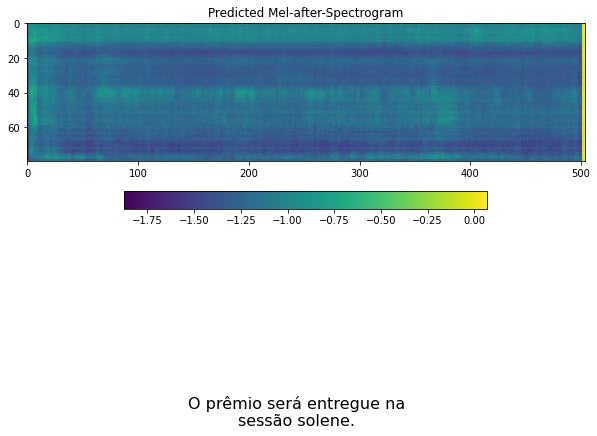

--------------------
--------------------
A ação se passa numa cidade calma.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


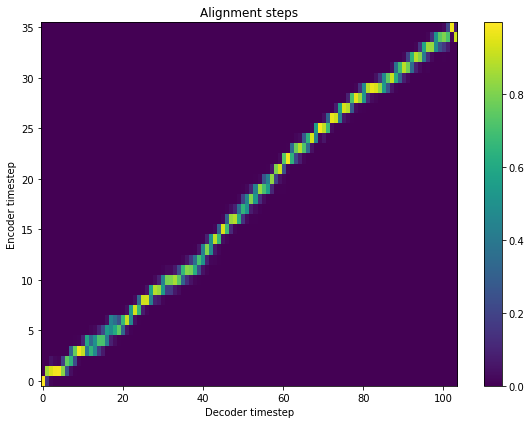

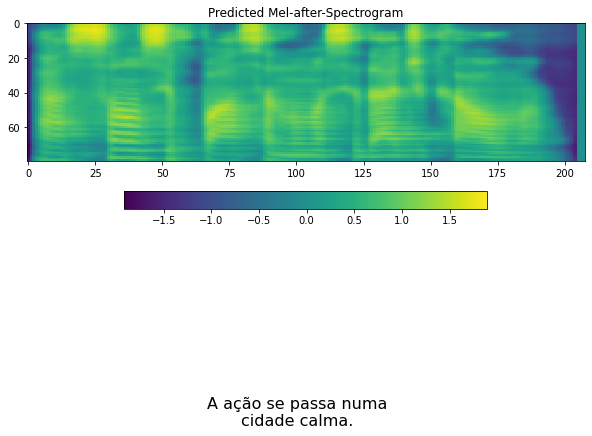

--------------------
--------------------
Ela e seu namorado chato saem do carro.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


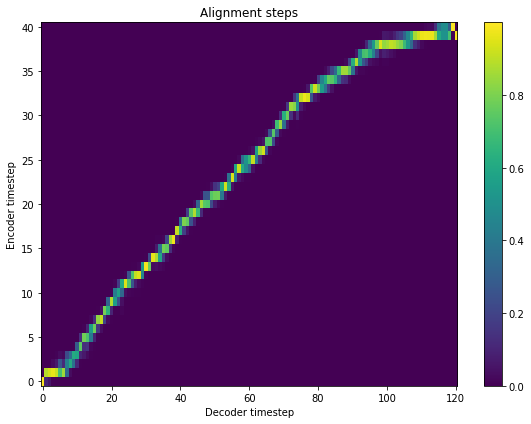

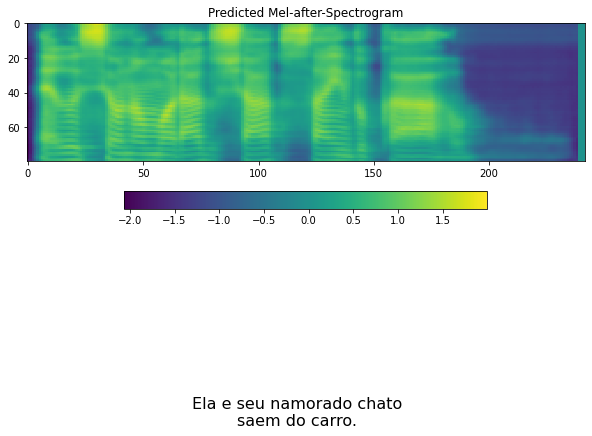

--------------------
--------------------
O adiantamento surpreendeu a mim e a todos.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


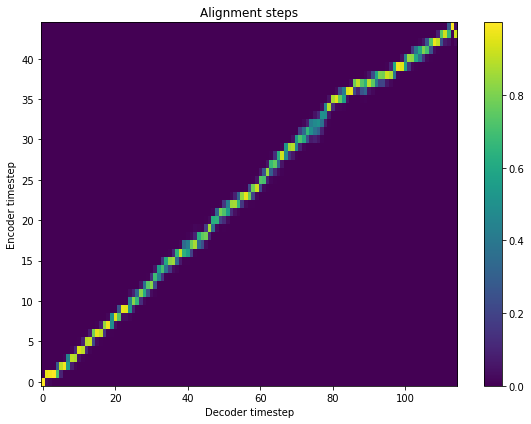

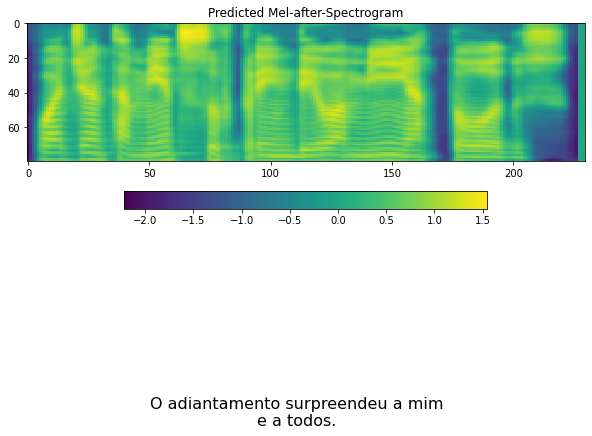

--------------------
--------------------
A gente sempre colhe o que plantou.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


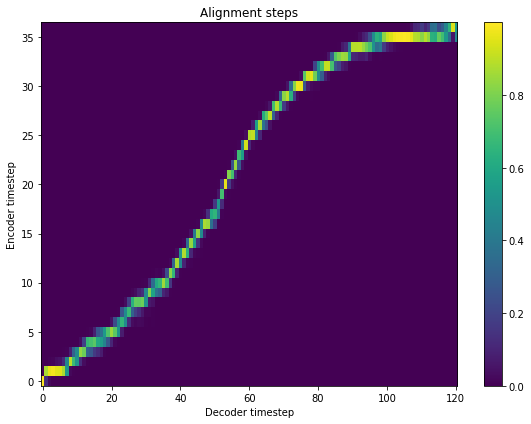

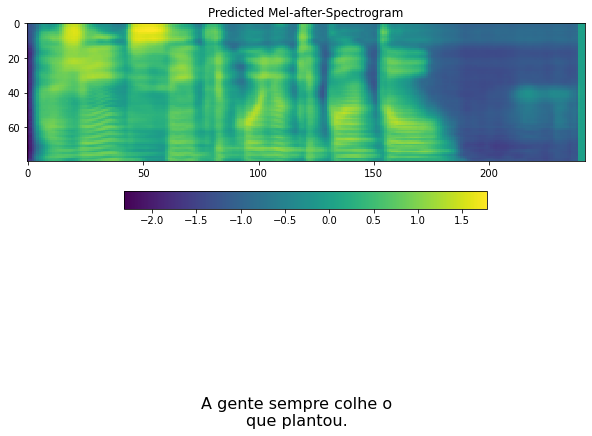

--------------------
--------------------
Aqui é onde existe a flor mais interessante.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


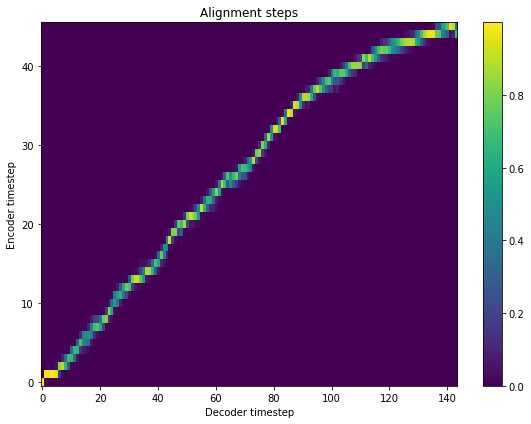

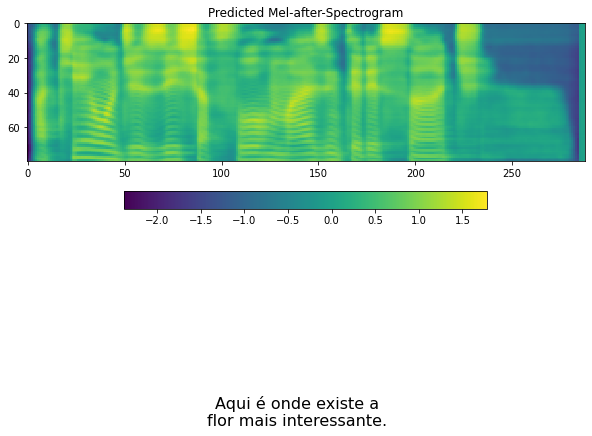

--------------------
--------------------
A corrida de inverno foi uma alegria.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_07


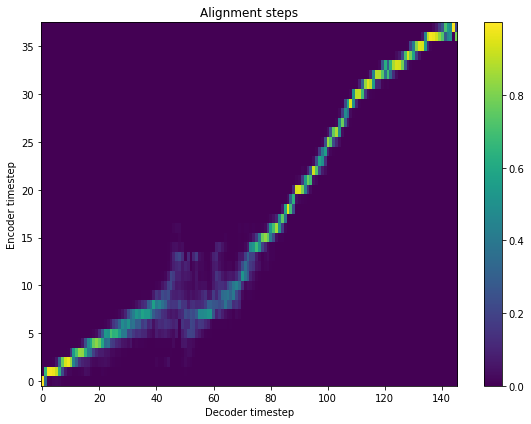

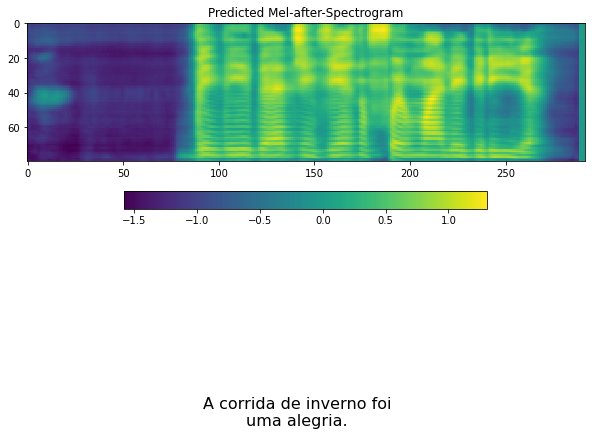

--------------------
--------------------
Esse empreendimento terá grande sucesso.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


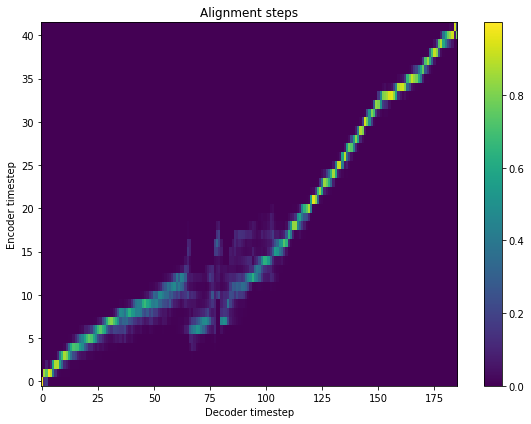

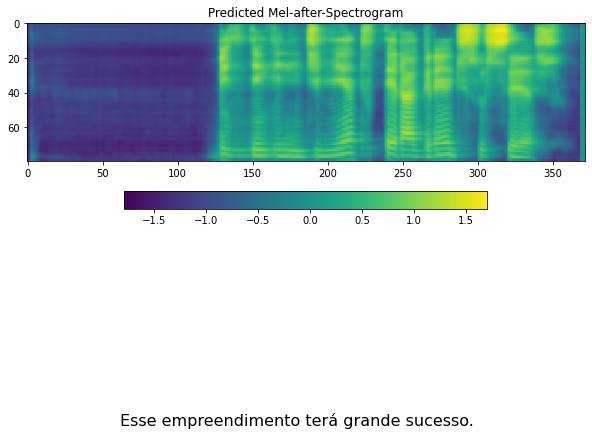

--------------------
--------------------
A feira livre não funcionará amanhã.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


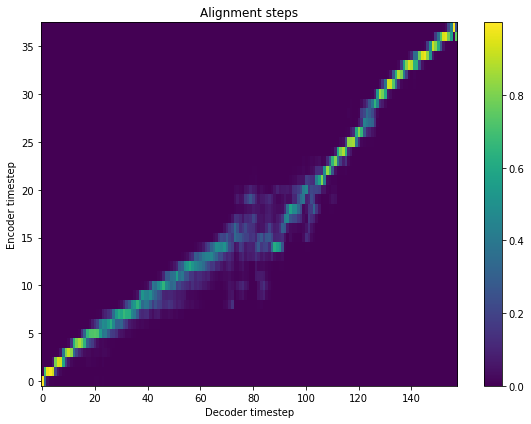

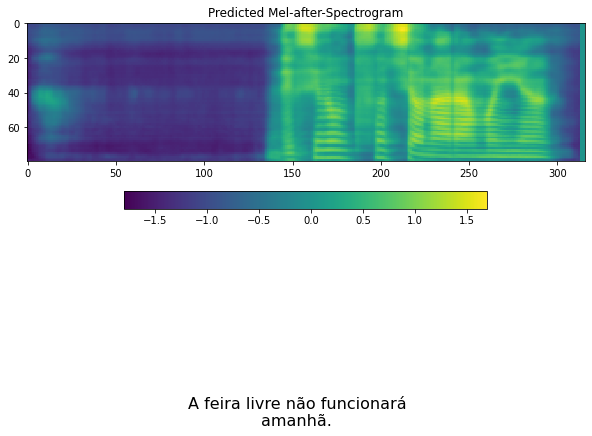

--------------------
--------------------
Fumar é prejudicial à saúde e é feio.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


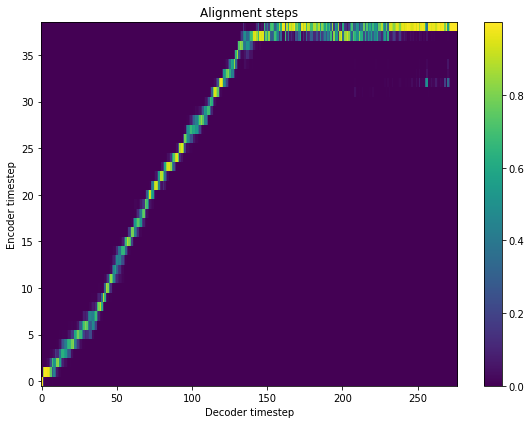

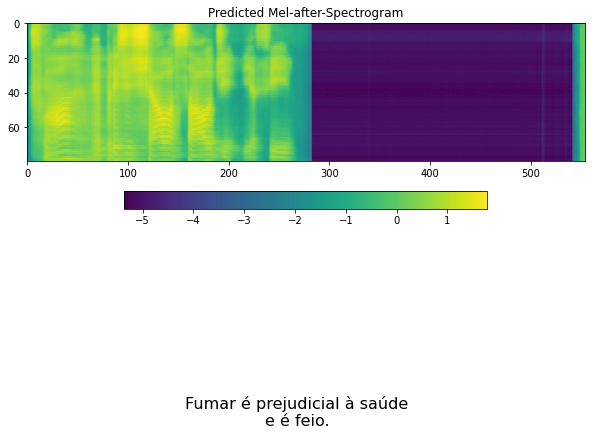

--------------------
--------------------
Entre com seu velho código e o número da conta.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


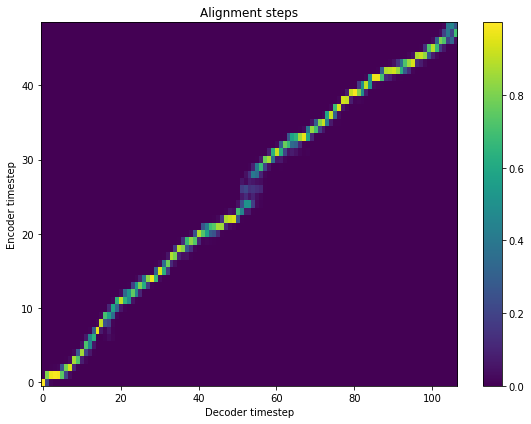

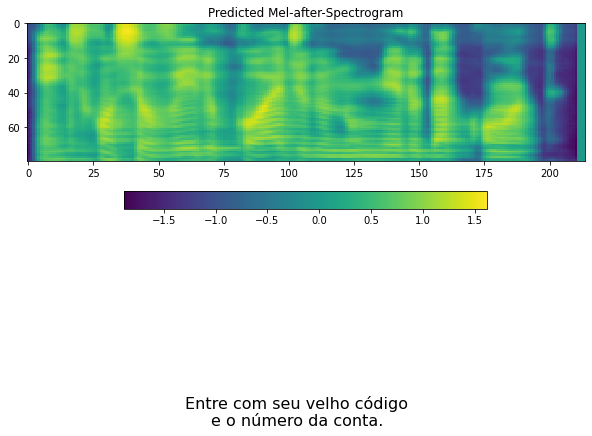

--------------------
--------------------
Reflita antes e discuta depois.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


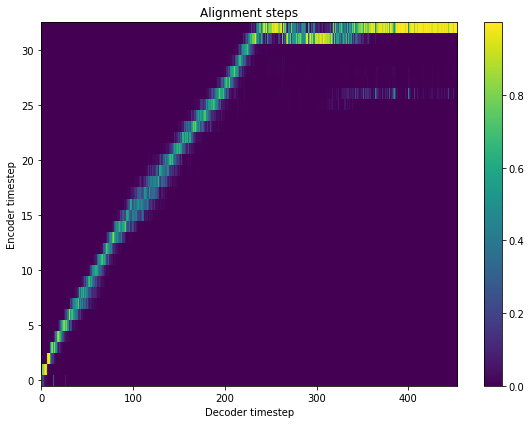

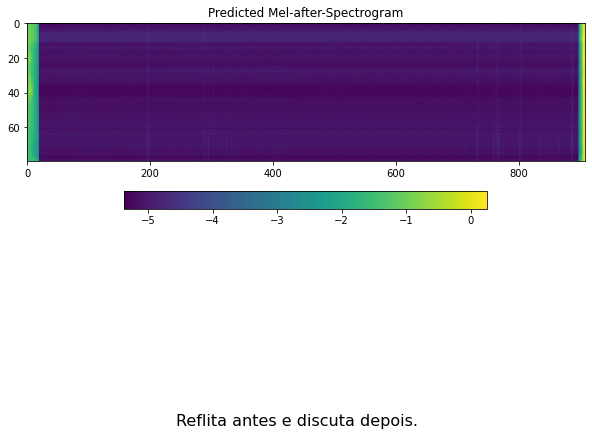

--------------------
--------------------
A aula dele é bastante charmosa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


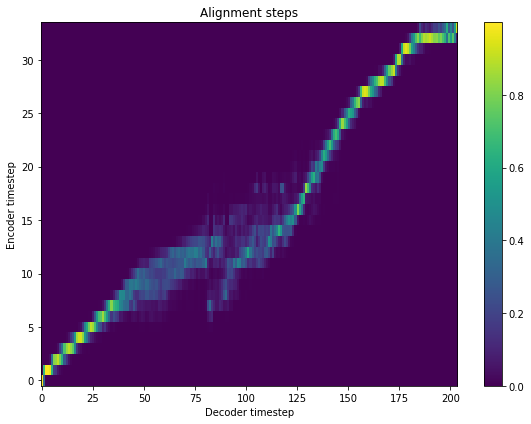

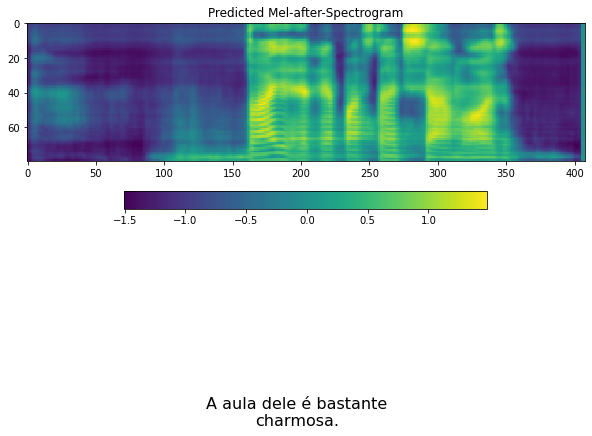

--------------------
--------------------
Usar mais aditivo pode ser desastroso.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


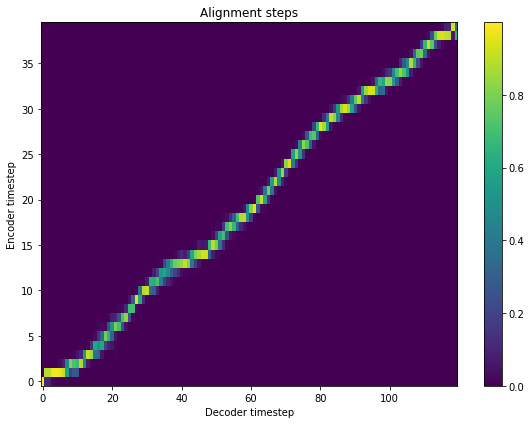

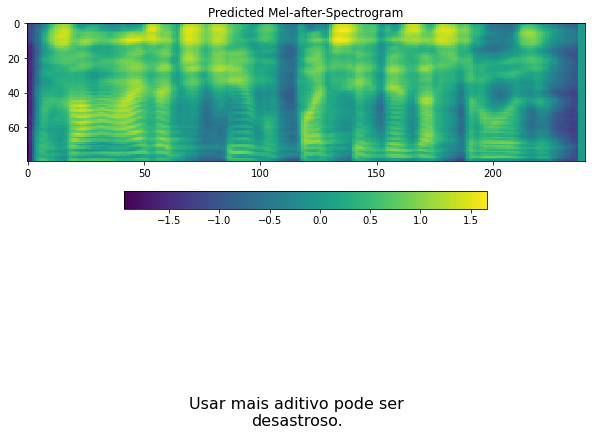

--------------------
--------------------
O clima não é mau em Calcutá.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


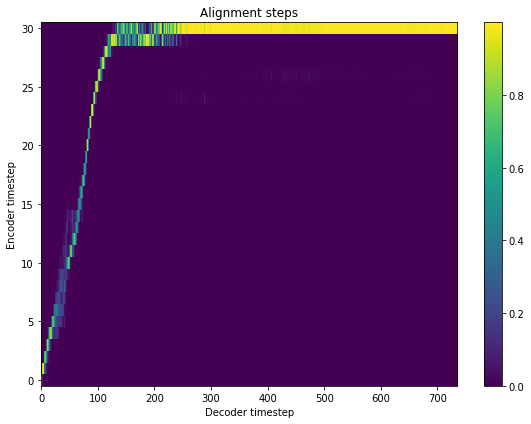

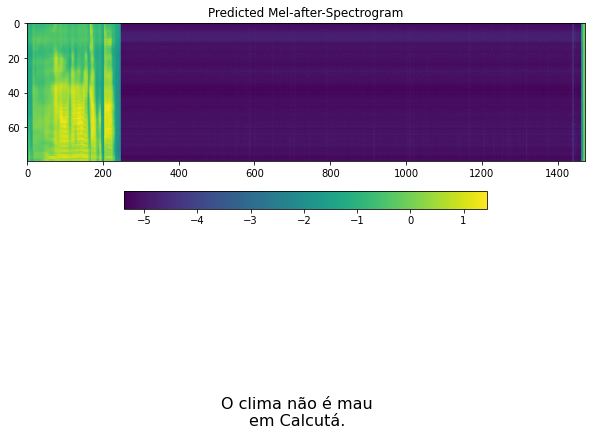

--------------------
--------------------
A locomotiva vem com mais carga.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


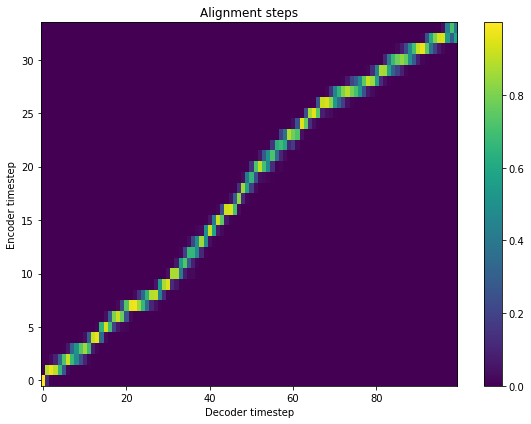

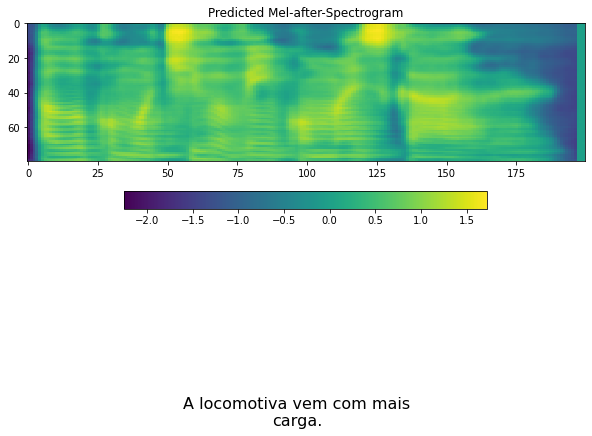

--------------------
--------------------
Ainda é uma boa temporada pro cinema.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_08


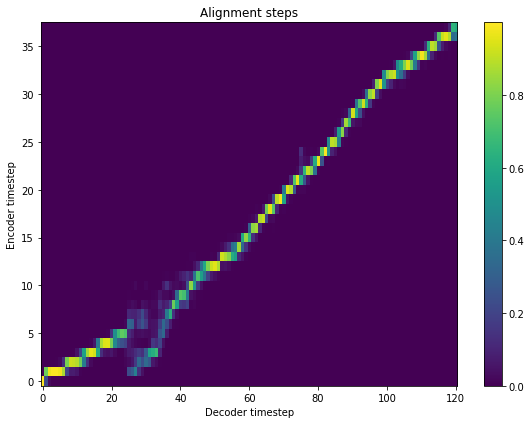

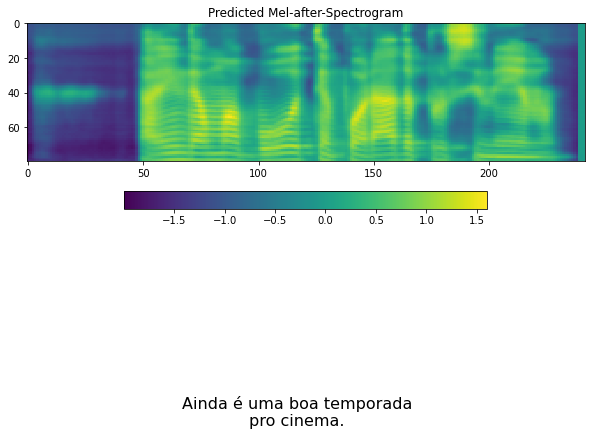

--------------------
--------------------
Os maiores picos da Terra ficam debaixo da água.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


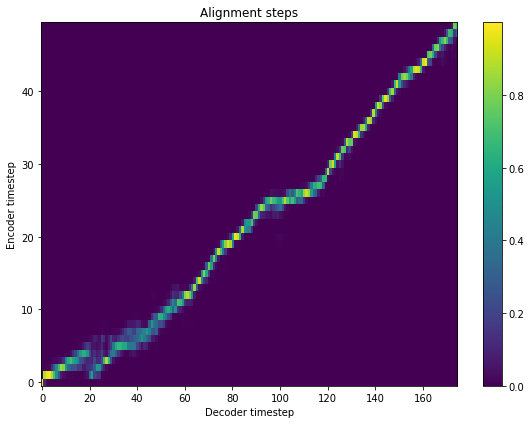

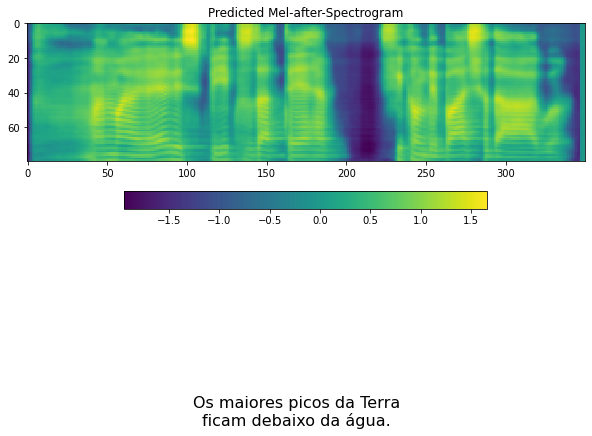

--------------------
--------------------
A inauguração da vila é quarta ou quinta-feira.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


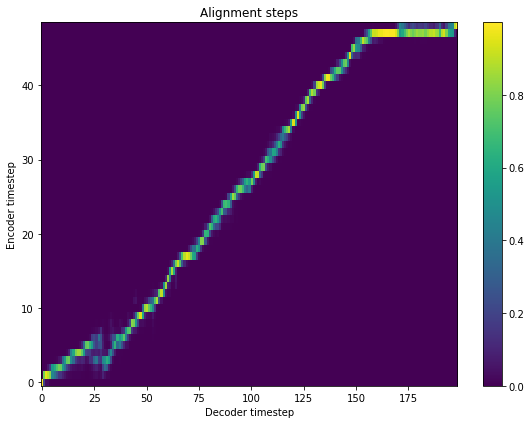

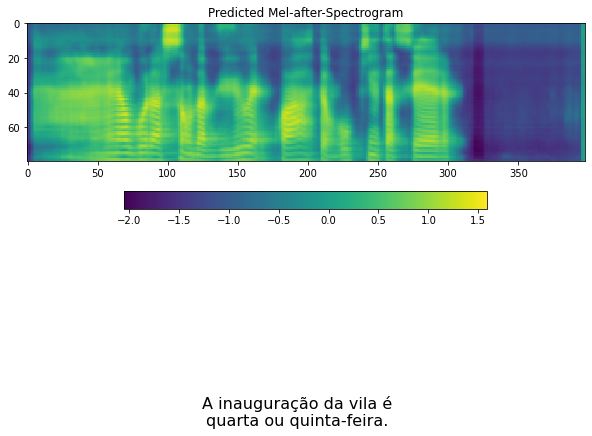

--------------------
--------------------
Vote se você tiver o título de eleitor.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


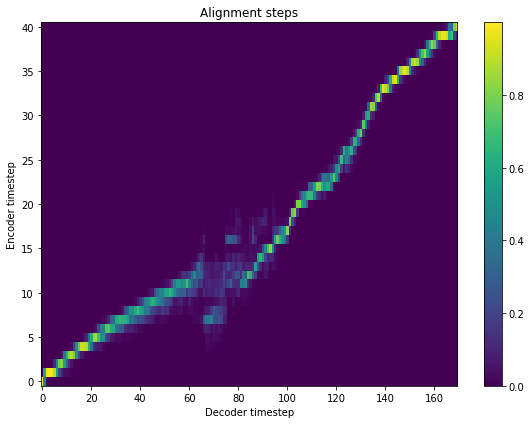

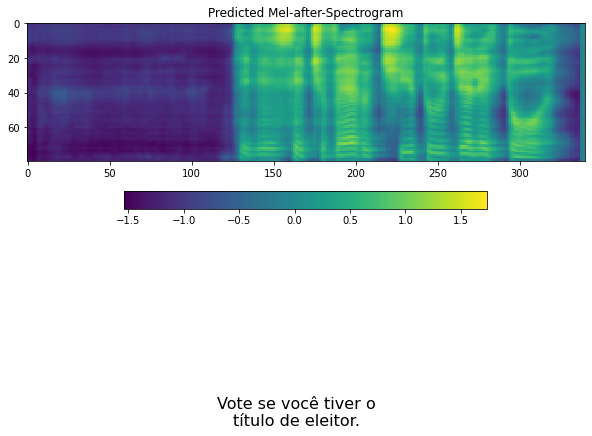

--------------------
--------------------
Hoje é fundamental encontrar a razão da existência humana.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


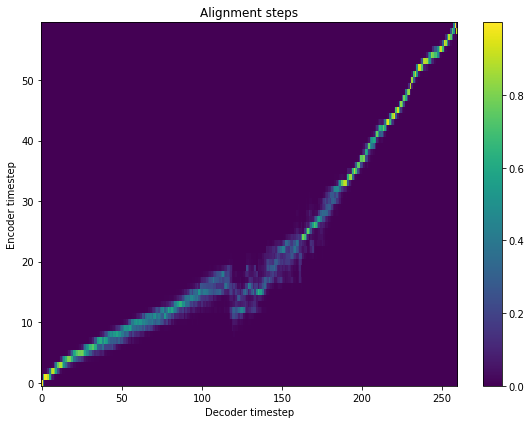

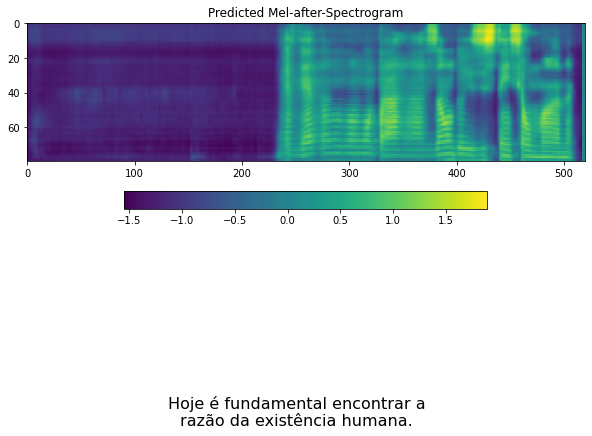

--------------------
--------------------
A temperatura é mais amena à noite.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


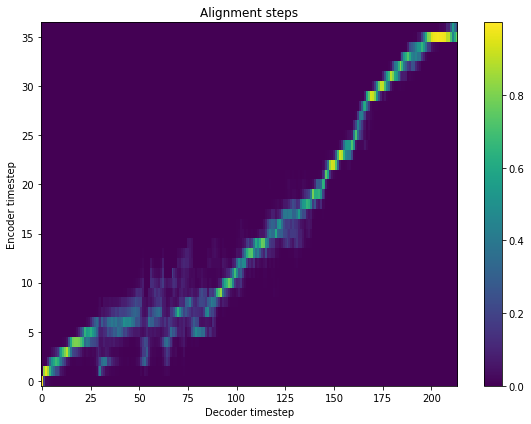

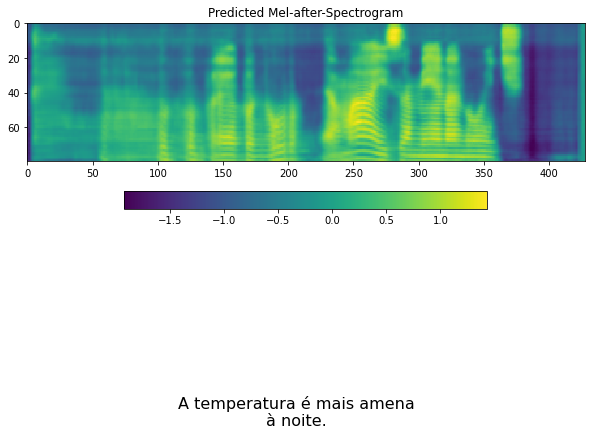

--------------------
--------------------
Em muitas cidades a população está diminuindo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


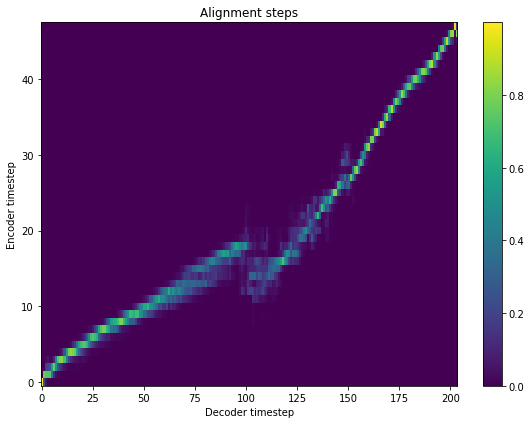

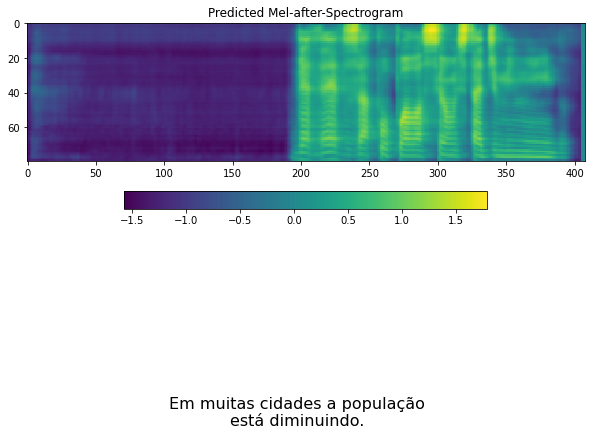

--------------------
--------------------
Nunca se deve ficar em cima do morro.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


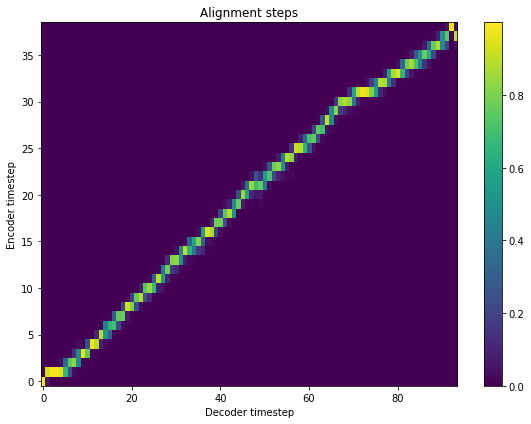

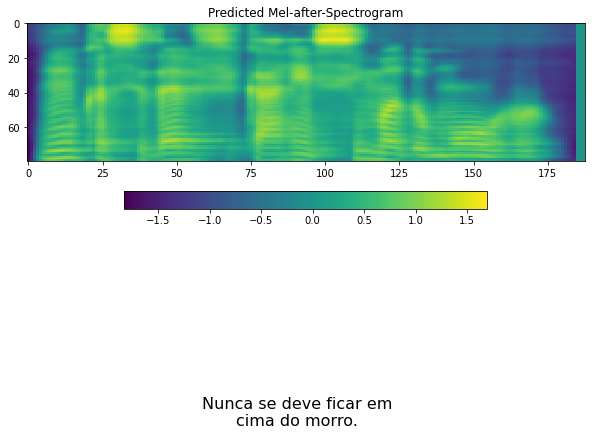

--------------------
--------------------
Para as pessoas estranhas o panorama é desolador.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


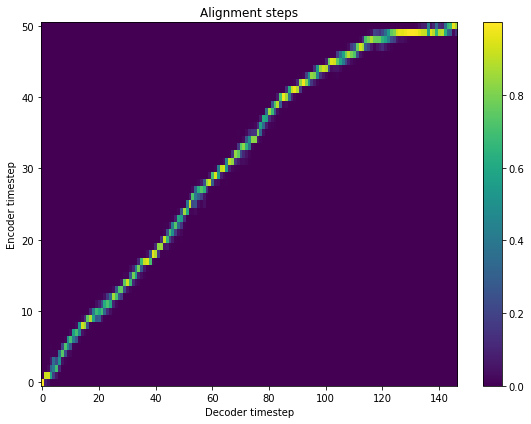

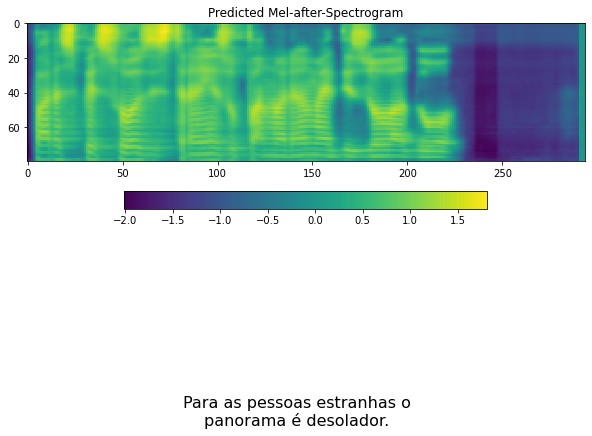

--------------------
--------------------
É bom te ver colhendo flores, menino!
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


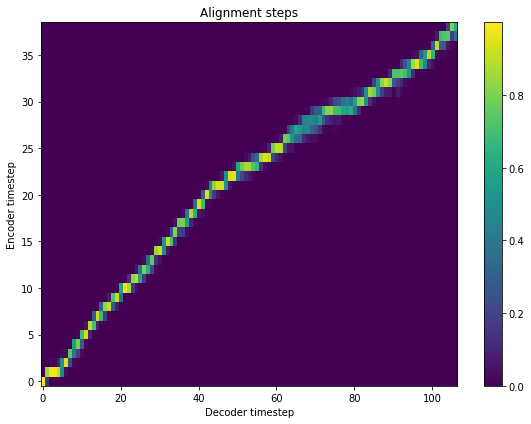

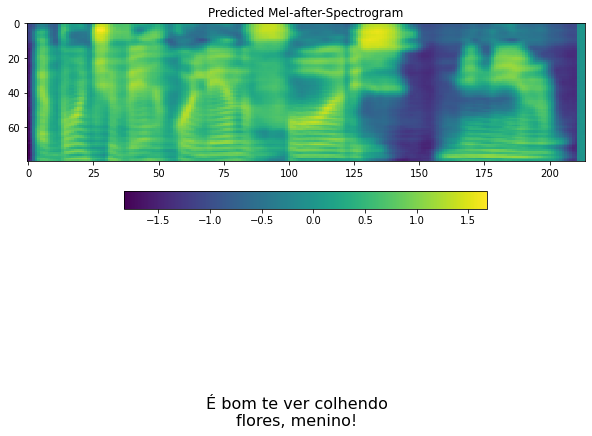

--------------------
--------------------
Eu finjo me banhar num lago ao amanhecer.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_09


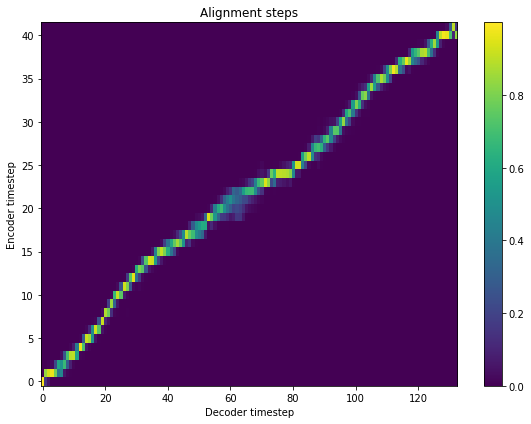

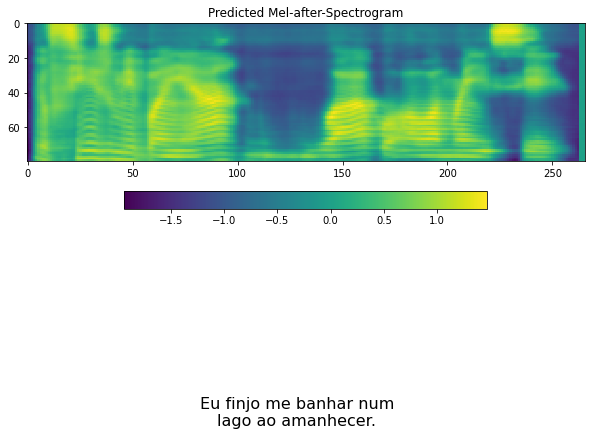

--------------------
--------------------
É de fundamental importância encontrar uma solução comum.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


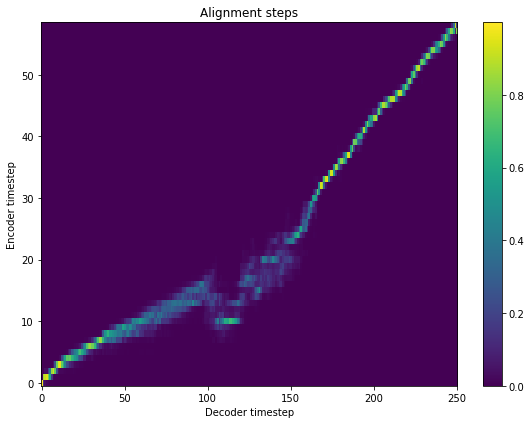

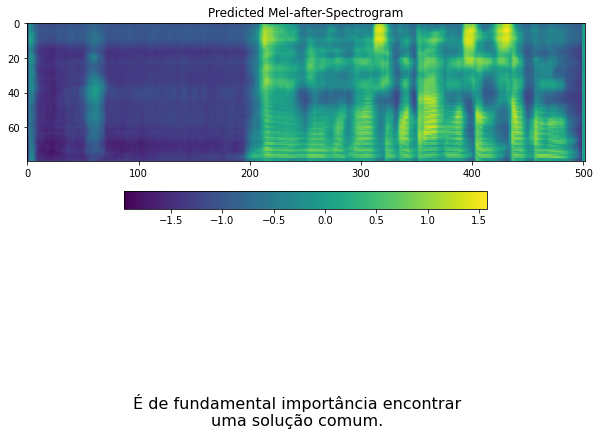

--------------------
--------------------
A previsão é de muito nevoeiro no Rio.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


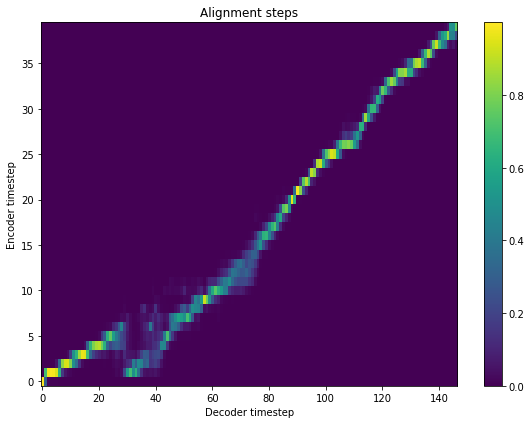

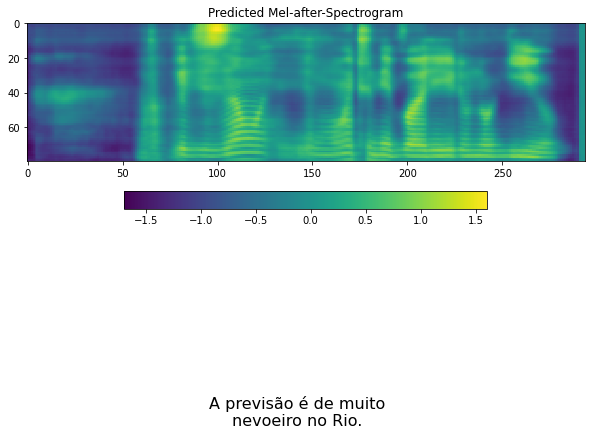

--------------------
--------------------
Os móveis virão as cinco da tarde.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


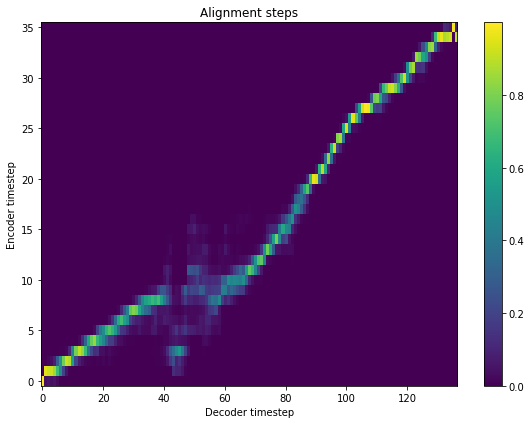

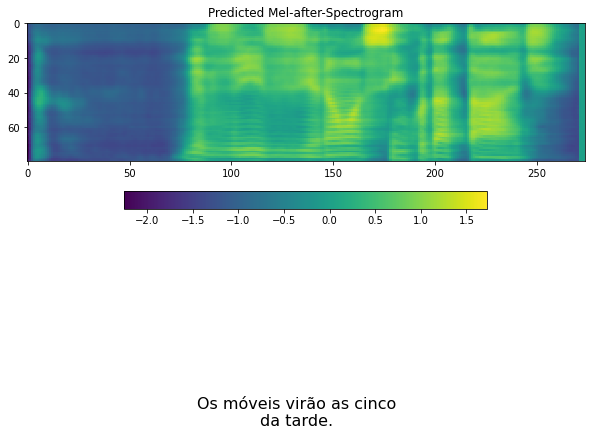

--------------------
--------------------
O barraco pode desabar em algumas horas.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


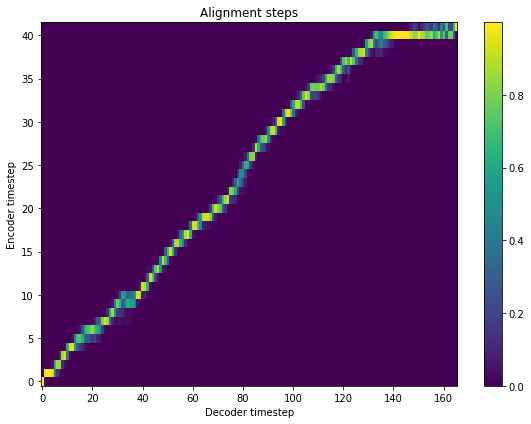

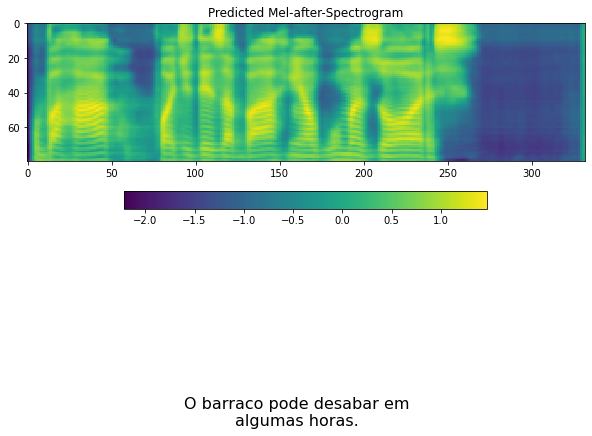

--------------------
--------------------
O candidato falou como se já estivesse eleito.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


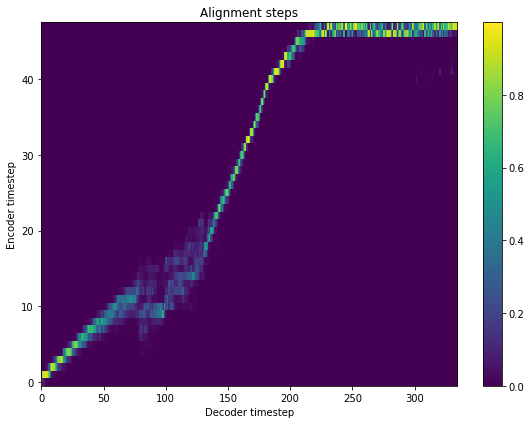

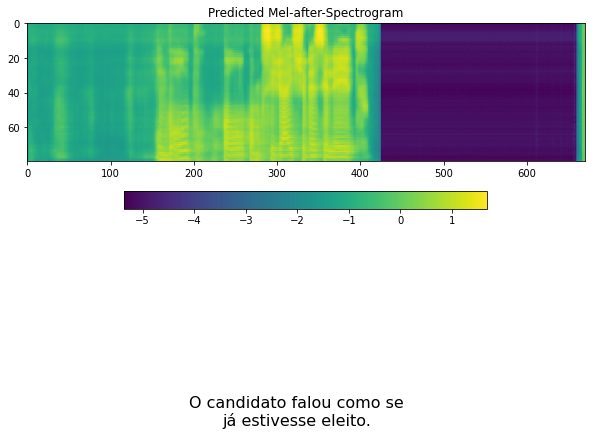

--------------------
--------------------
A ideia é falha, mas interessante.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


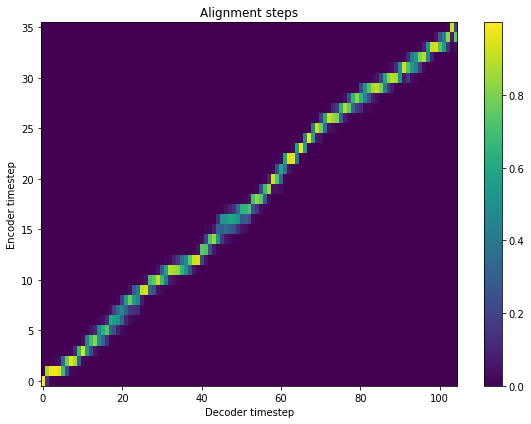

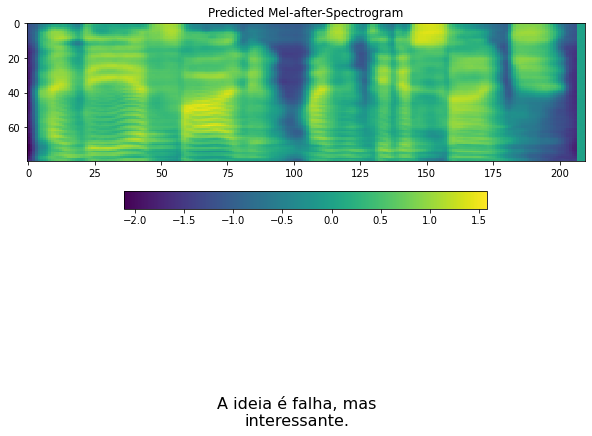

--------------------
--------------------
O dia está bom pra passear de navio.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


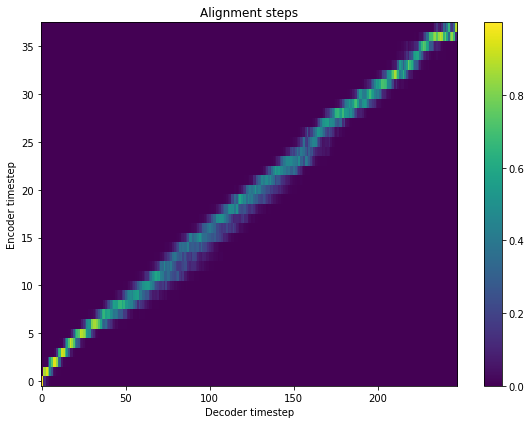

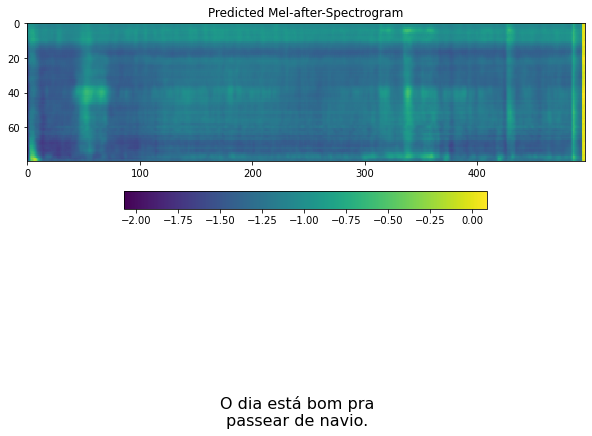

--------------------
--------------------
Minha correpondência me espera em casa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


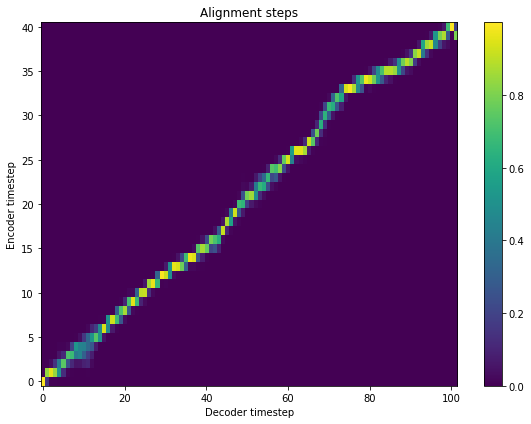

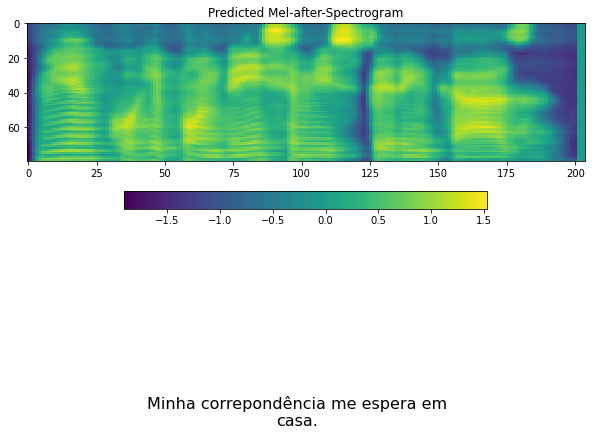

--------------------
--------------------
A saída pra crise dele é o diálogo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


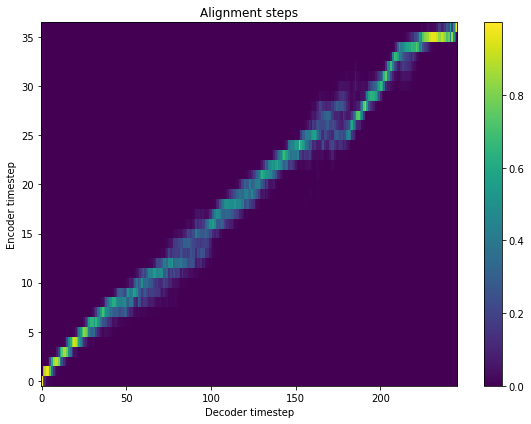

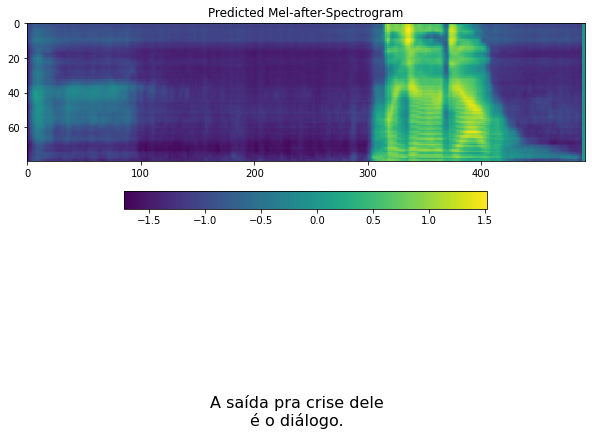

--------------------
--------------------
Finalmente São Pedro chamou o mau tempo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_10


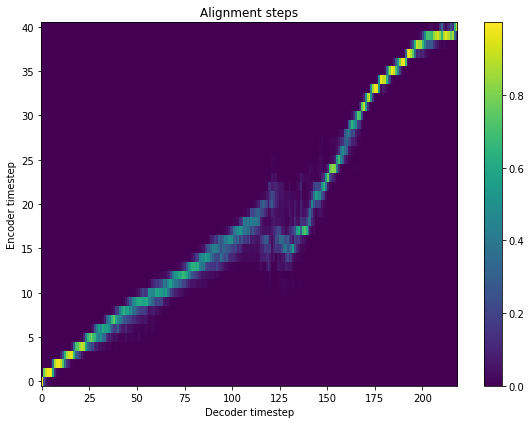

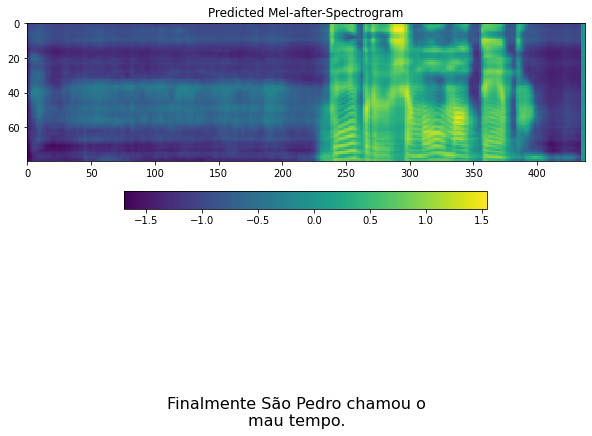

--------------------
--------------------
Um casal de gatos come no telhado.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


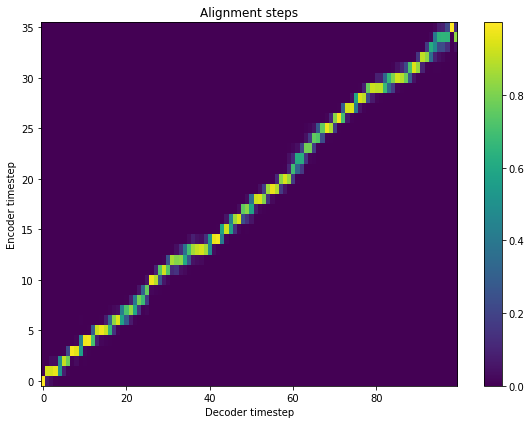

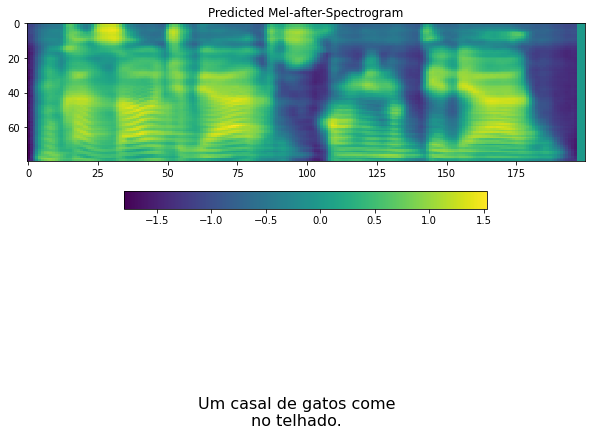

--------------------
--------------------
A cantora foi apresentar um grande sucesso.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


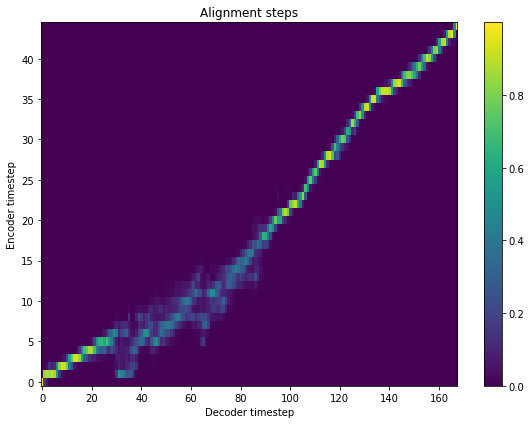

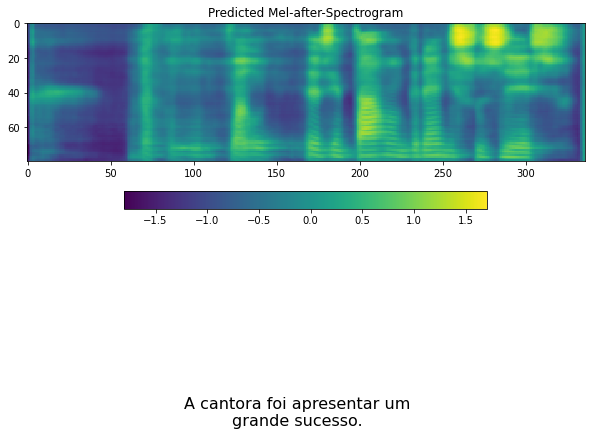

--------------------
--------------------
Lá é um lugar ótimo pra tomar uns chopinhos.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


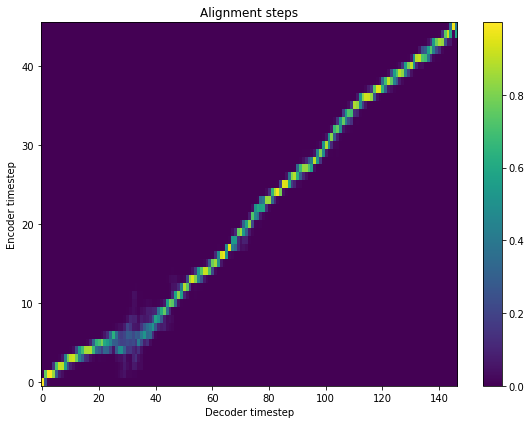

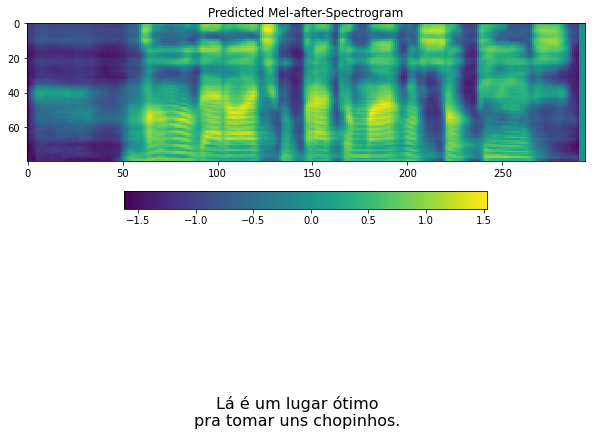

--------------------
--------------------
O musical consumiu quatro meses da vida da gente.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


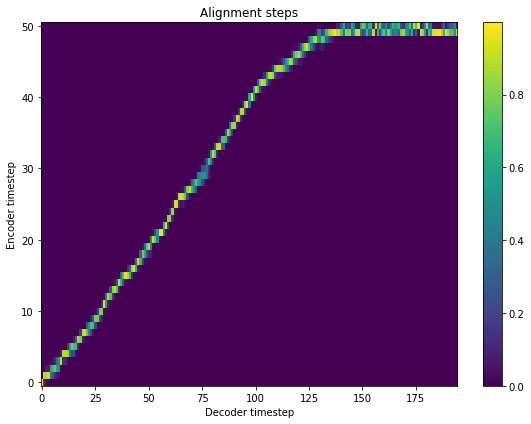

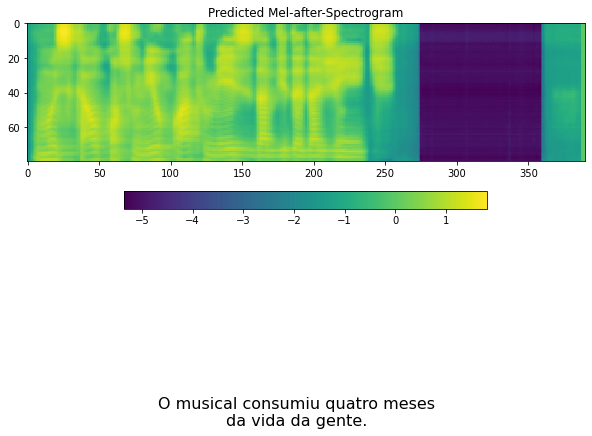

--------------------
--------------------
O baile começa após às nove horas.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


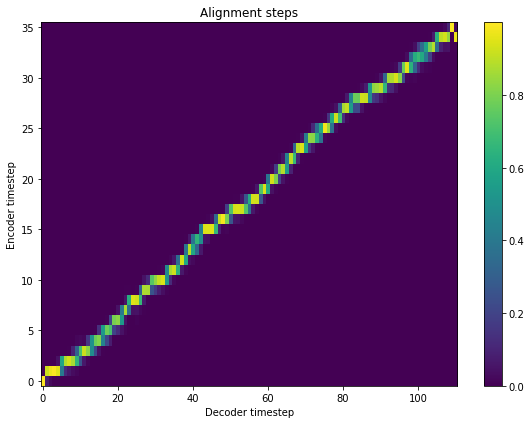

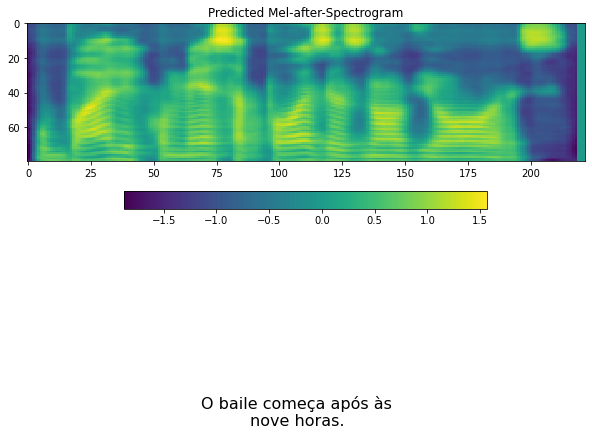

--------------------
--------------------
Apesar desse resultado tomarei uma decisão.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


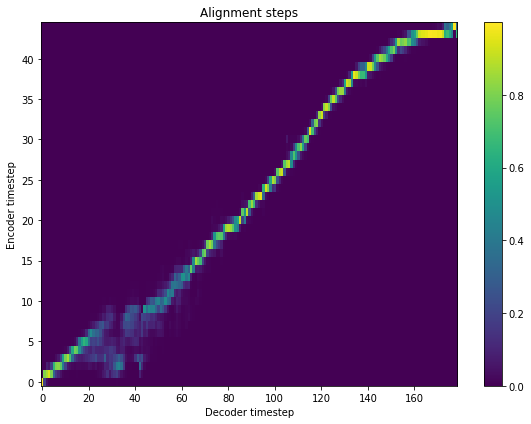

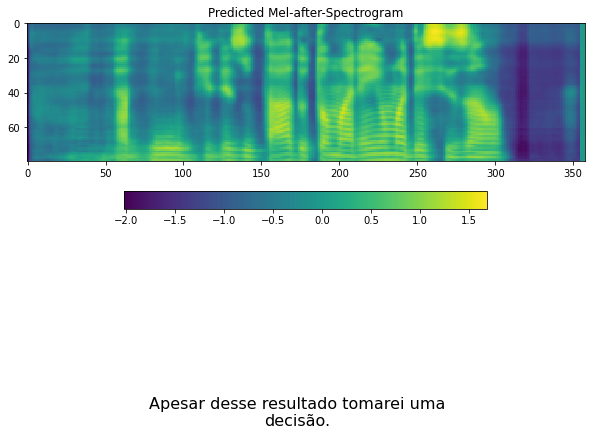

--------------------
--------------------
A verdade não poupa nem as celebridades.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


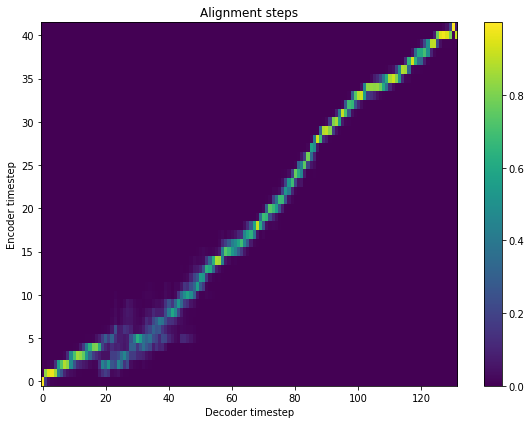

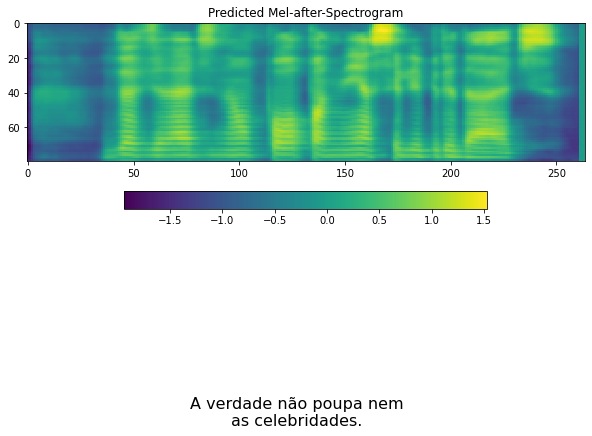

--------------------
--------------------
O frio deve diminuir ainda este ano.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


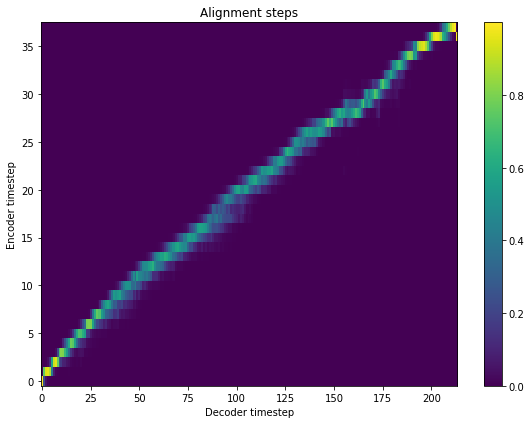

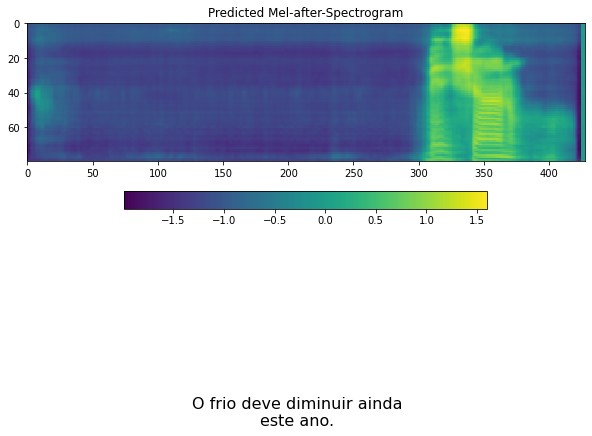

--------------------
--------------------
O vão da plataforma é estreito.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


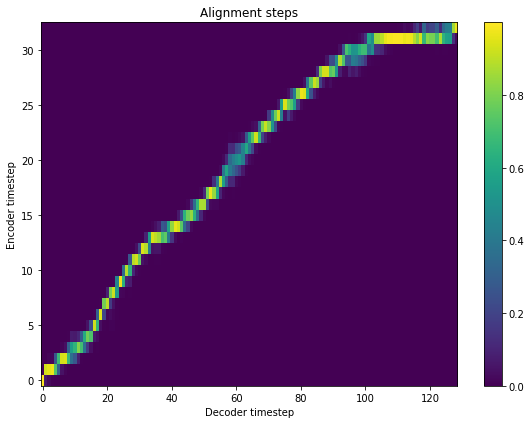

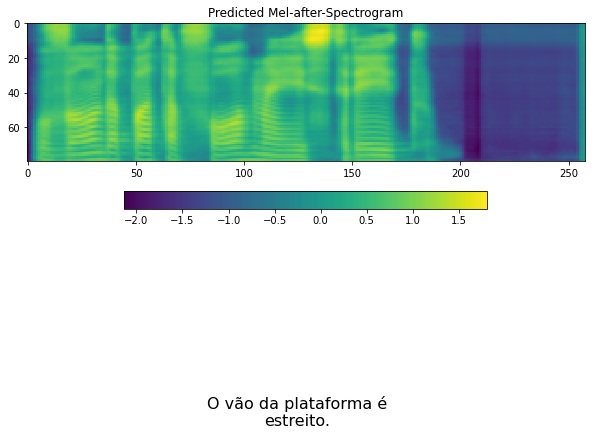

--------------------
--------------------
Infelizmente não fui a ginástica.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_11


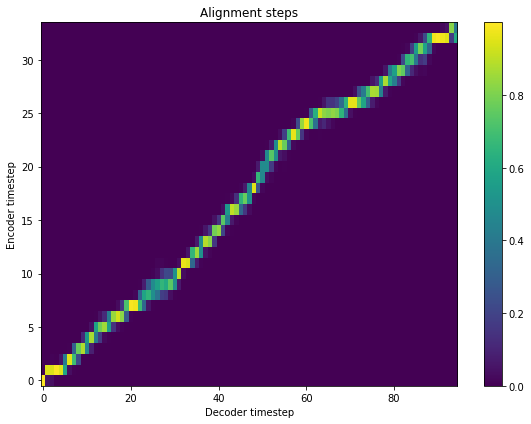

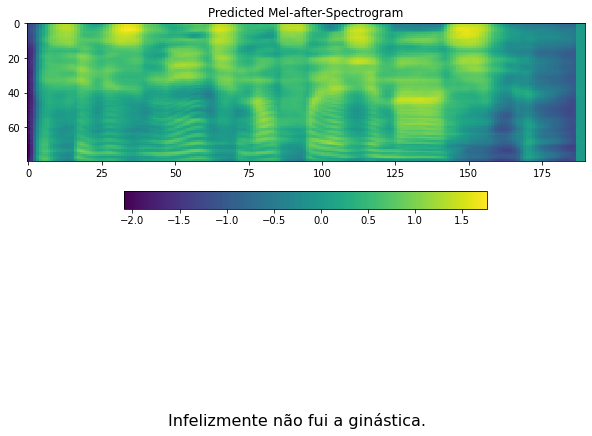

--------------------
--------------------
Os meninos prenderam um filhote de tigre.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


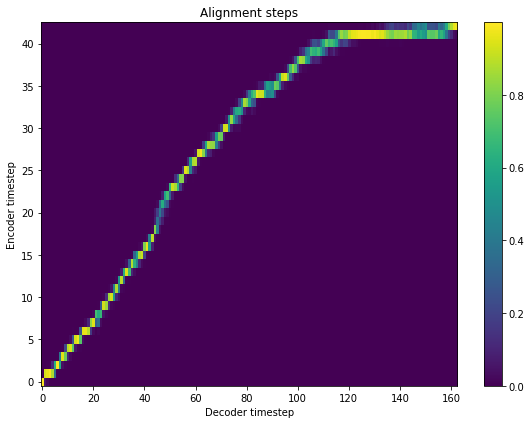

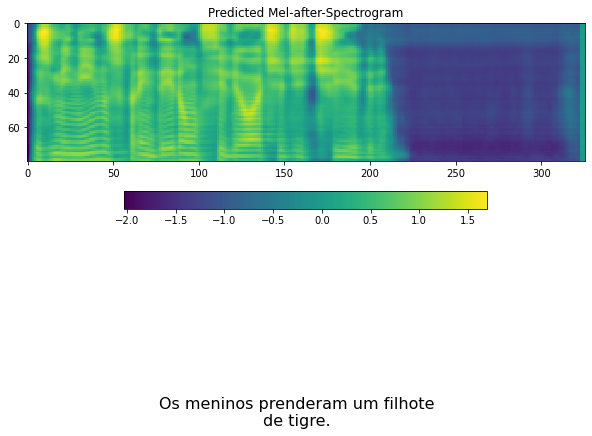

--------------------
--------------------
A bolsa de valores está em alta.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


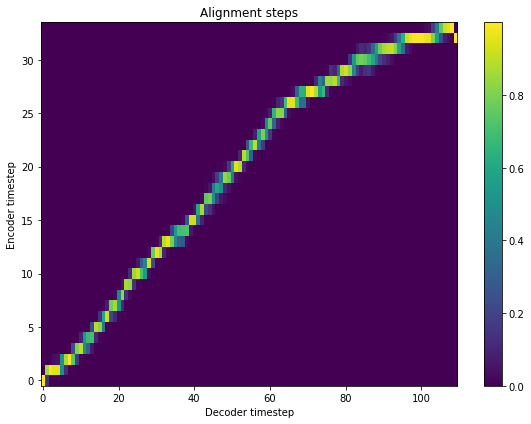

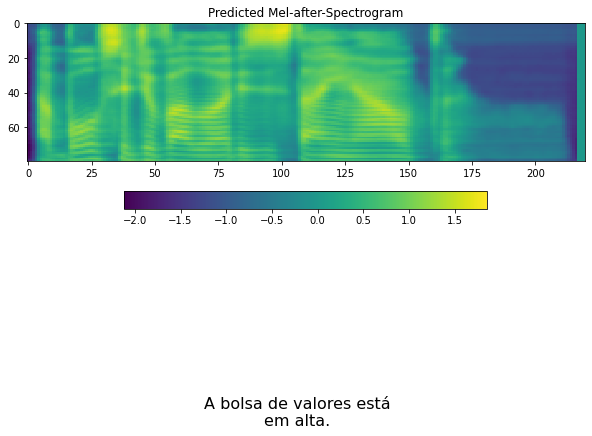

--------------------
--------------------
O congresso volta atrás em sua palavra.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


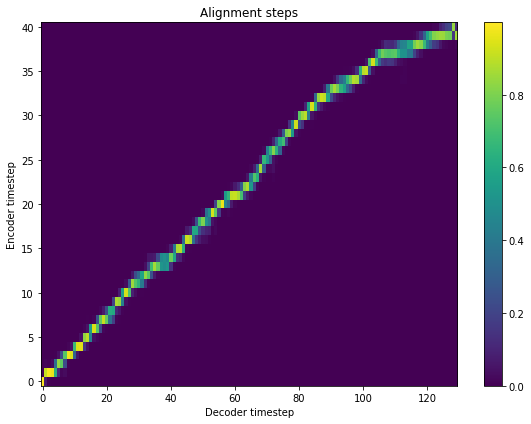

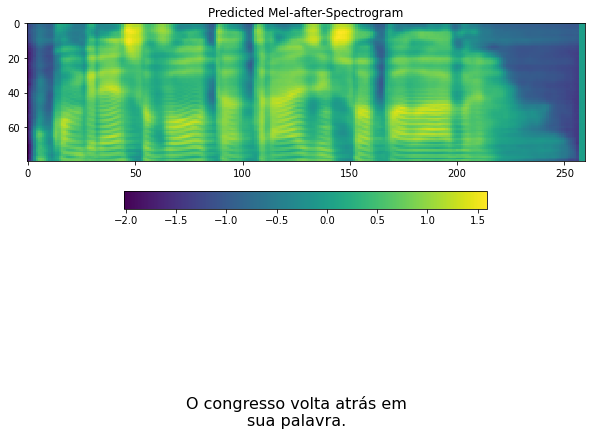

--------------------
--------------------
A médica receitou que eles mudassem de clima.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


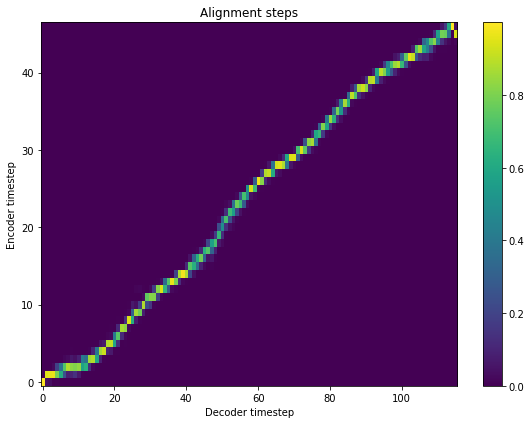

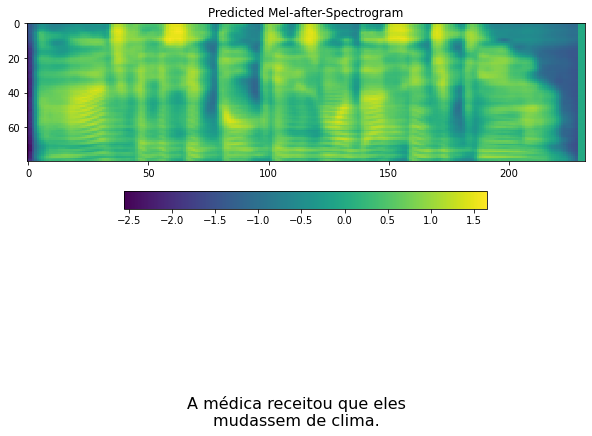

--------------------
--------------------
Não é permitido fumar no interior do ônibus.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


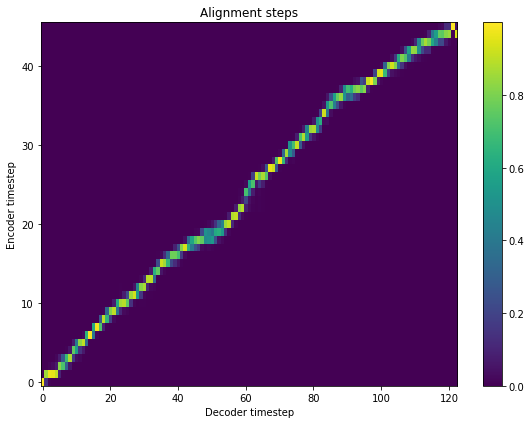

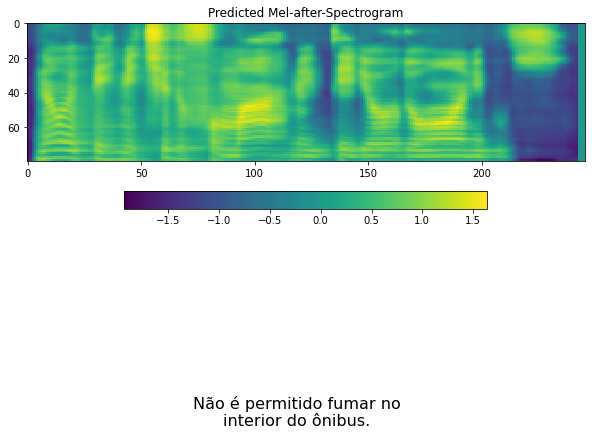

--------------------
--------------------
A garota foi presa naquela noite.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


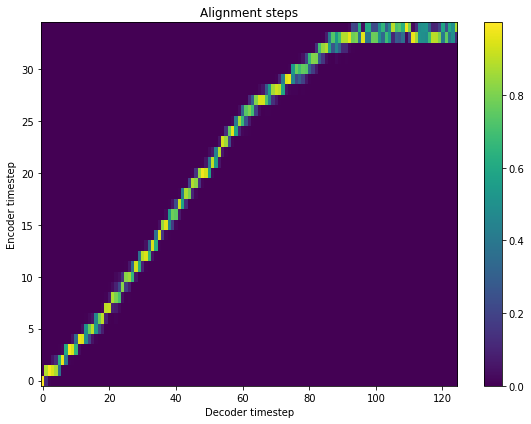

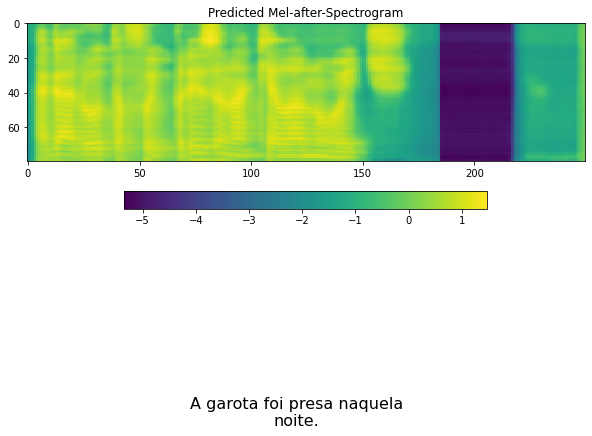

--------------------
--------------------
O prato do dia é couve no tempero.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


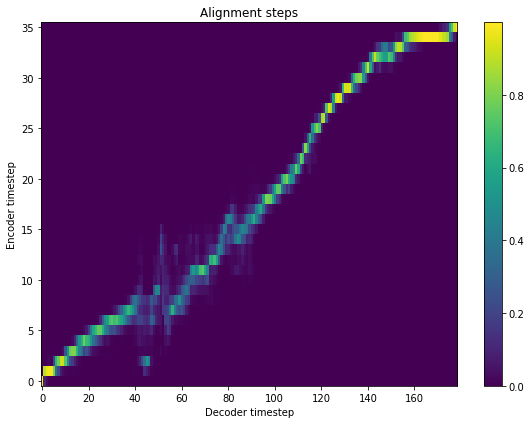

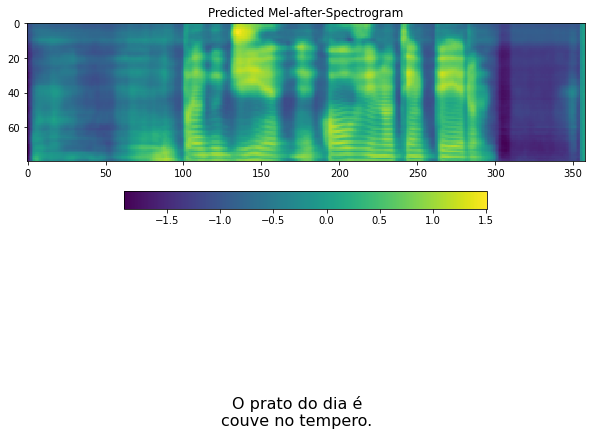

--------------------
--------------------
Eu viajarei a Belém amanhã.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


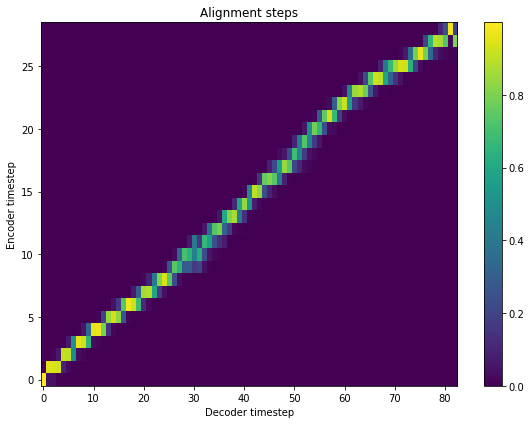

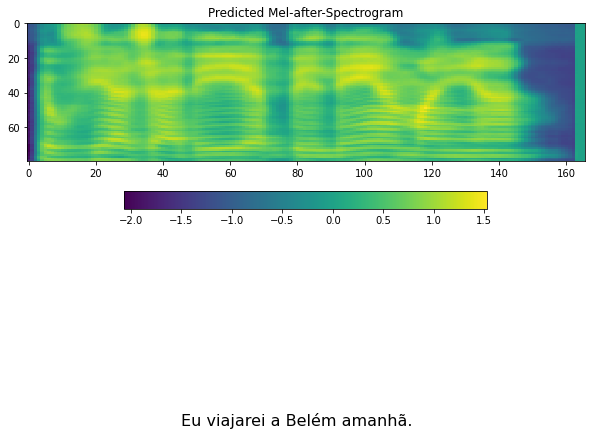

--------------------
--------------------
A balsa é o meio de transporte daqui.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


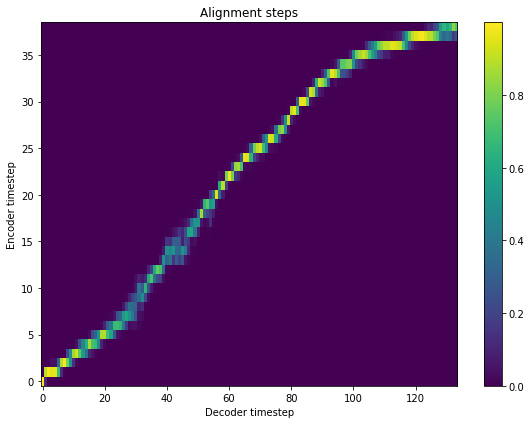

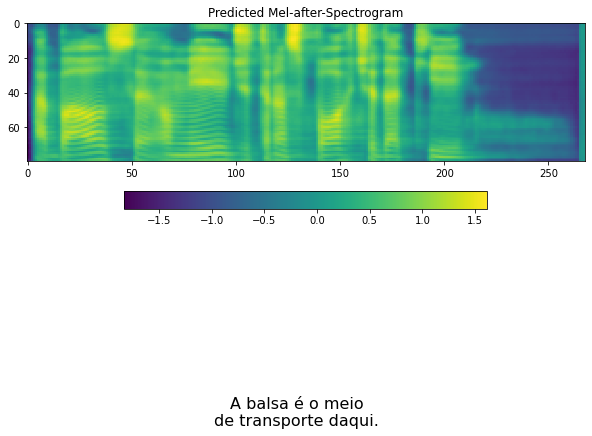

--------------------
--------------------
A apresentação foi cancelada por causa da chuva.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_12


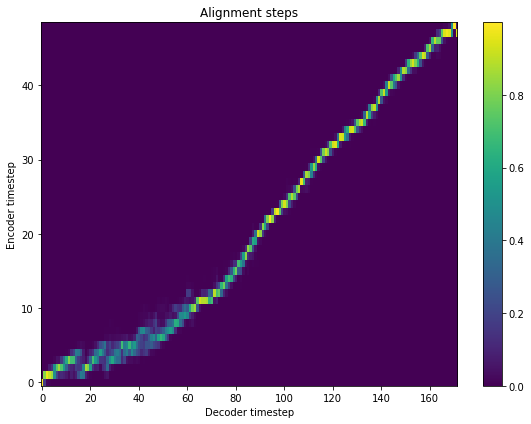

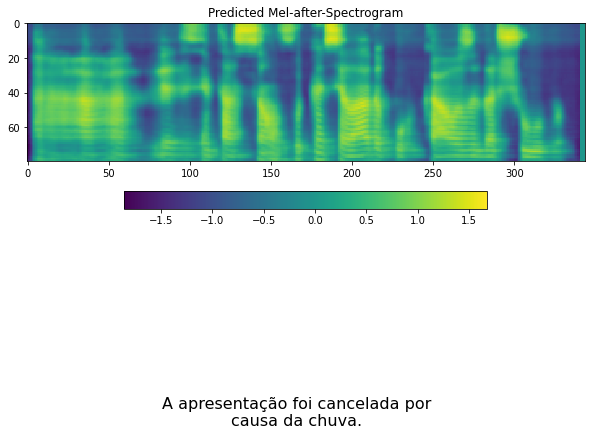

--------------------
--------------------
O grêmio ganhou uma quadra de esportes.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


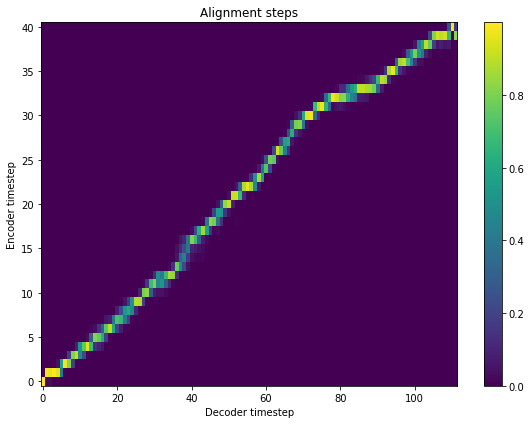

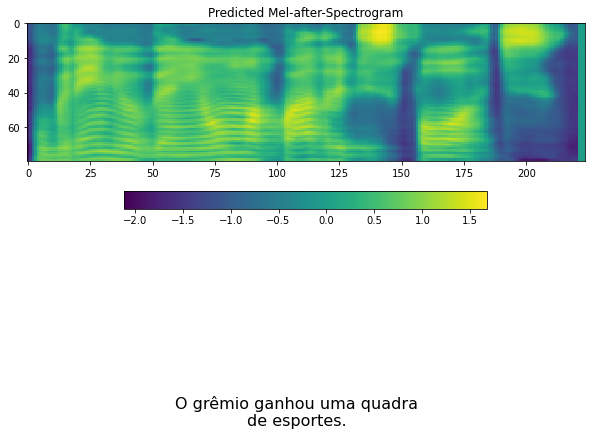

--------------------
--------------------
Hoje irei à vila sem meu filho.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


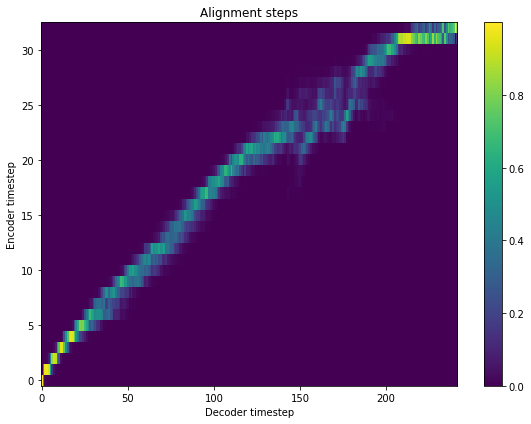

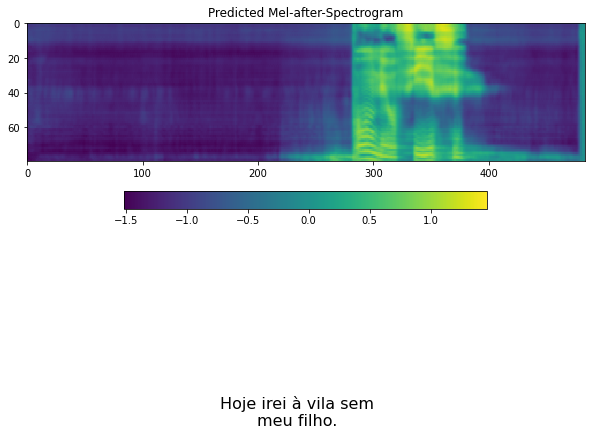

--------------------
--------------------
Essa chuva não ocorre mais todo ano.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


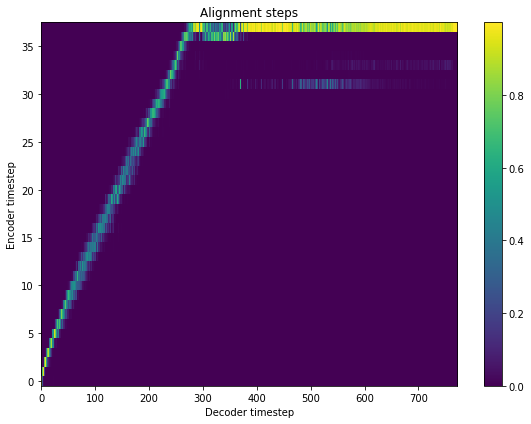

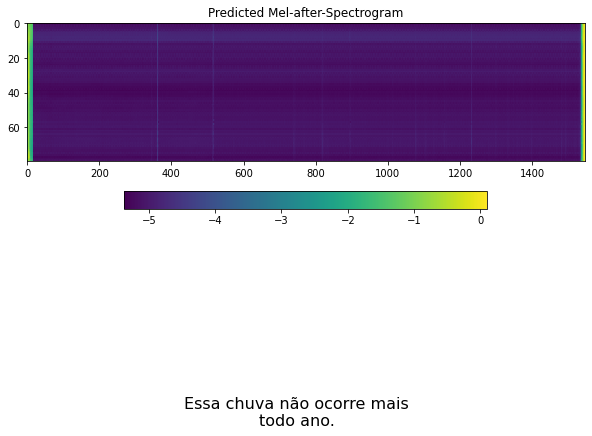

--------------------
--------------------
Será bom que ele estude o assunto.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


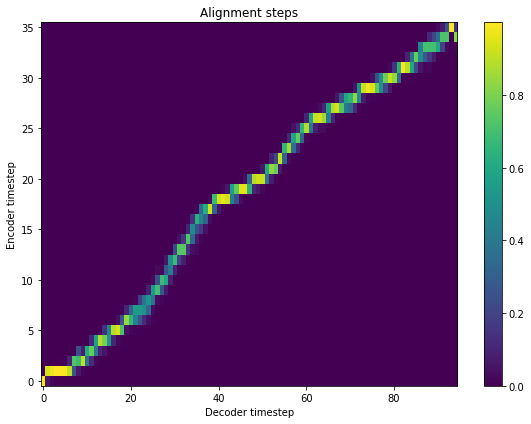

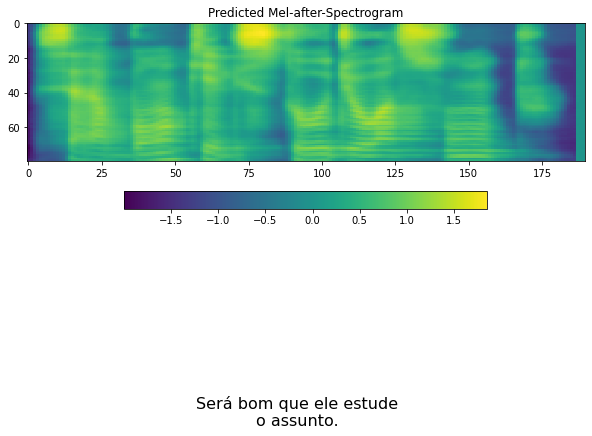

--------------------
--------------------
O menu inclui um prato muito saboroso.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


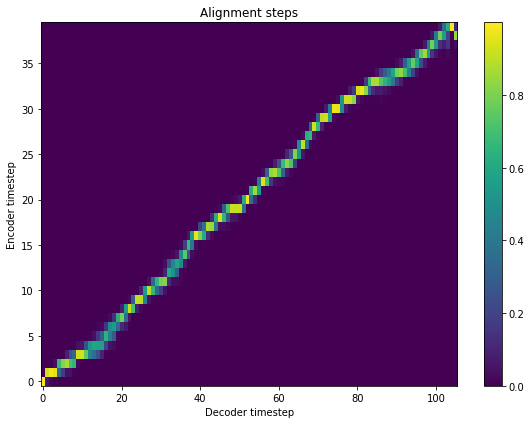

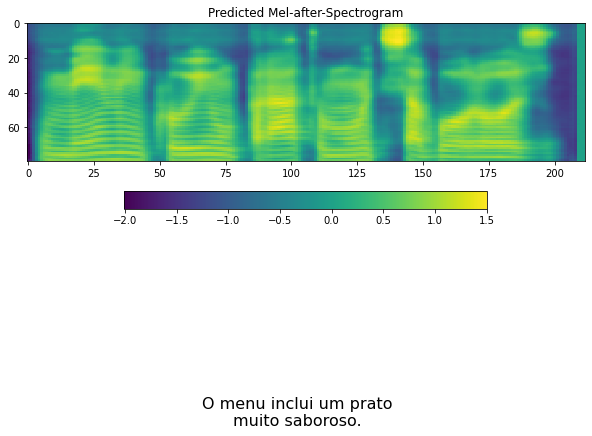

--------------------
--------------------
Podia dizer as horas por gentileza?
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


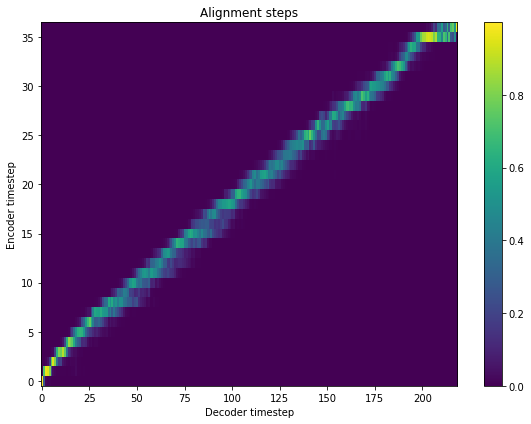

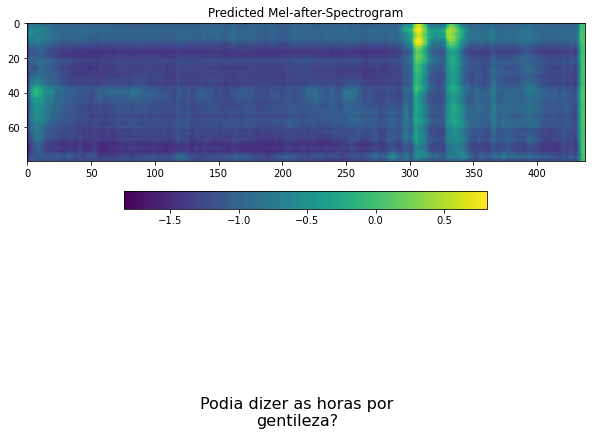

--------------------
--------------------
A casa é enfeitada com rosas.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


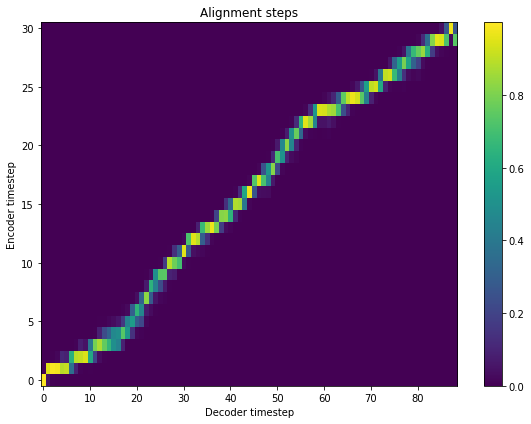

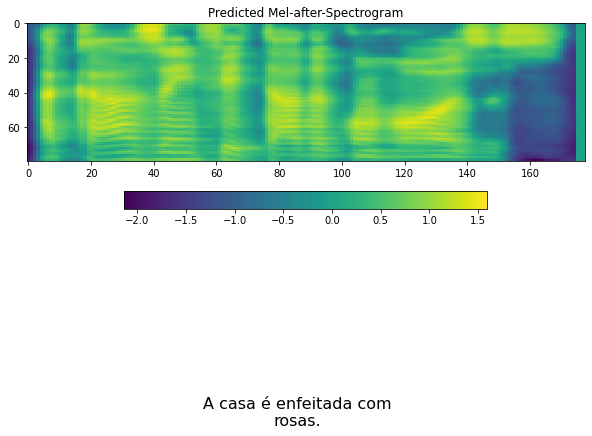

--------------------
--------------------
A Terra é farta mas não infinita.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


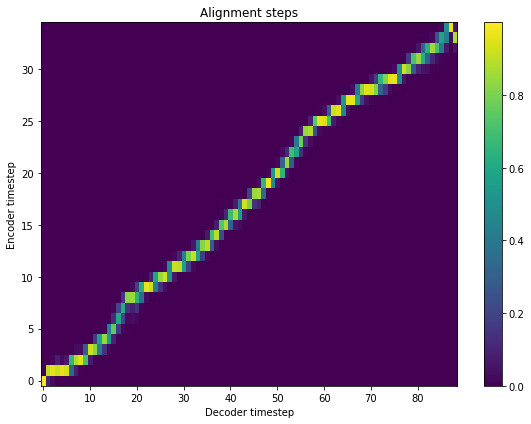

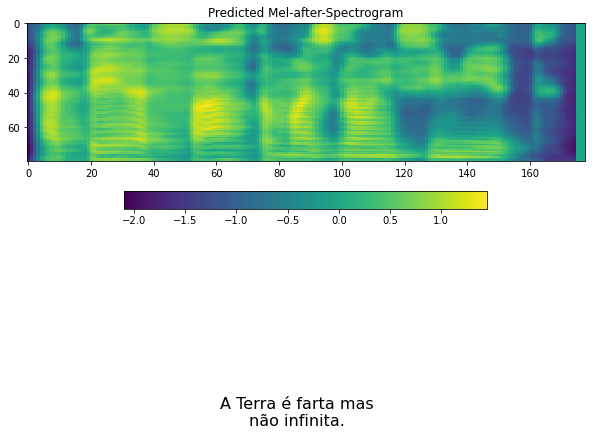

--------------------
--------------------
O sinal emitido é captado pelos receptores.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


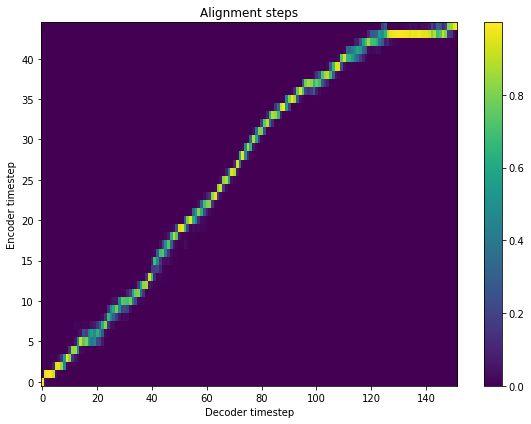

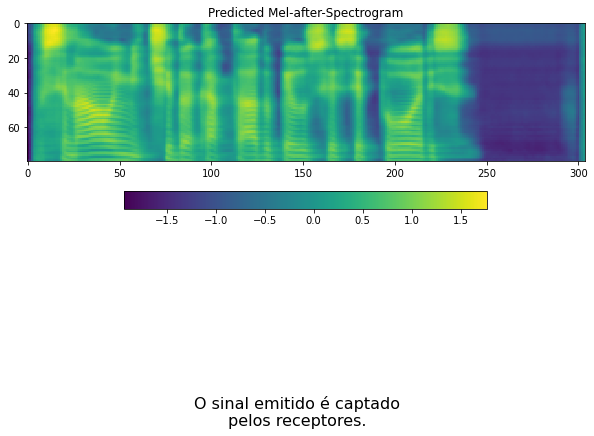

--------------------
--------------------
A mensalidade aumentou mais que a inflação.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_13


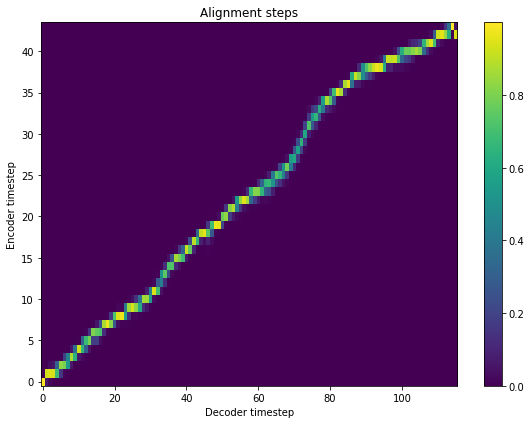

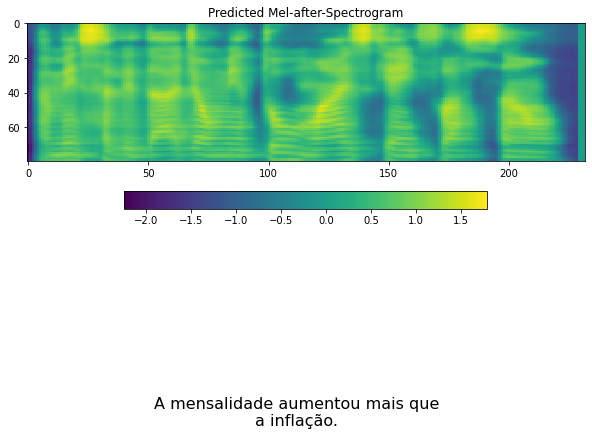

--------------------
--------------------
O tele-jornal começa às dez da noite.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


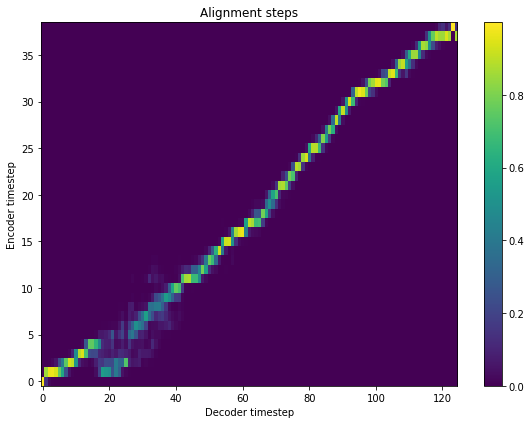

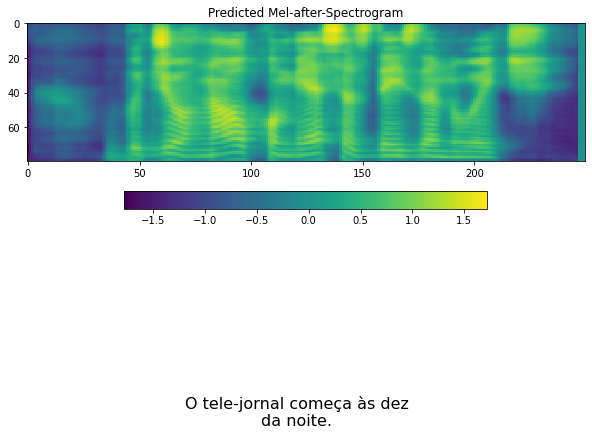

--------------------
--------------------
A cabine do telefone fica na próxima rua.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


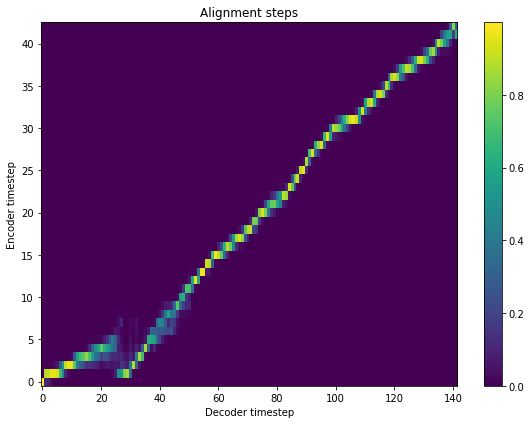

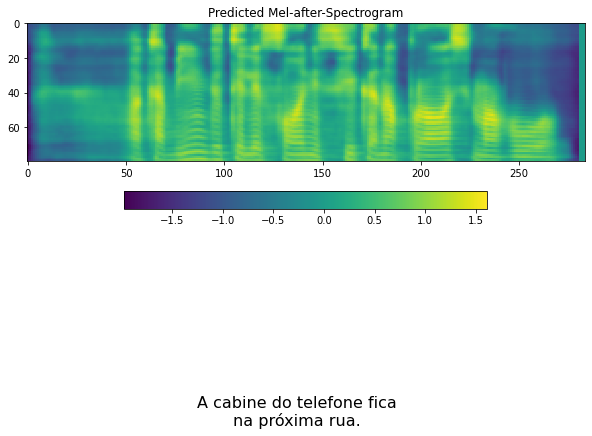

--------------------
--------------------
Defender a ecologia é manter a vida.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


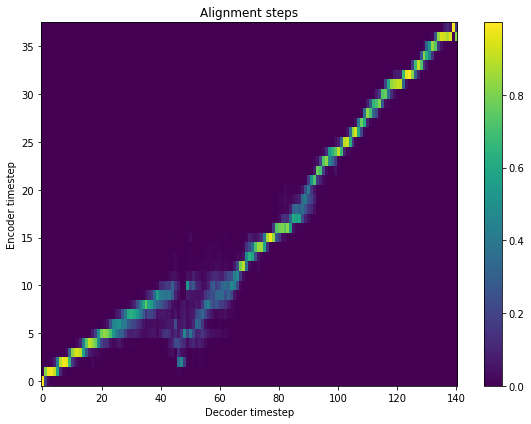

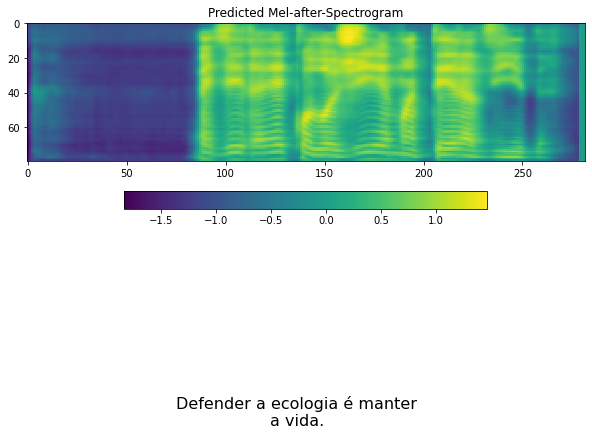

--------------------
--------------------
Nesse verão o calor é insuportável.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


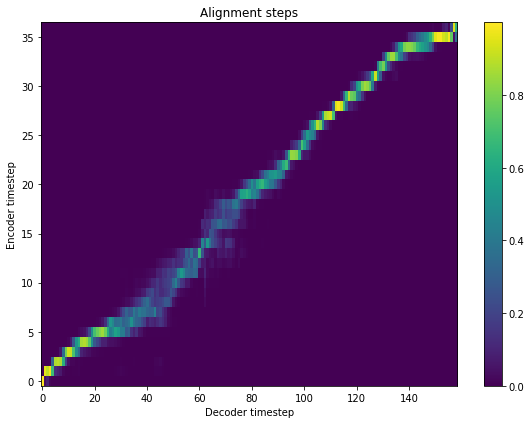

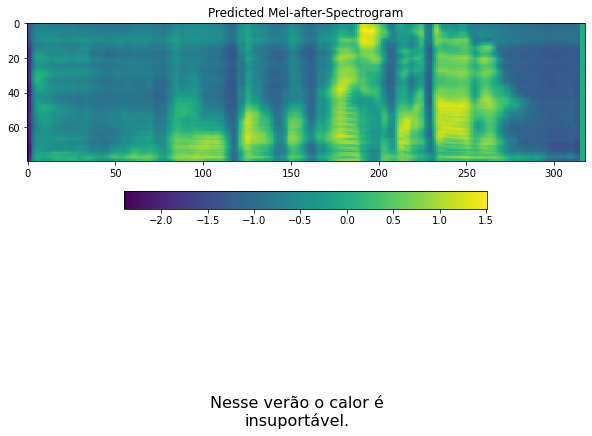

--------------------
--------------------
O jardim exige muito trabalho.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


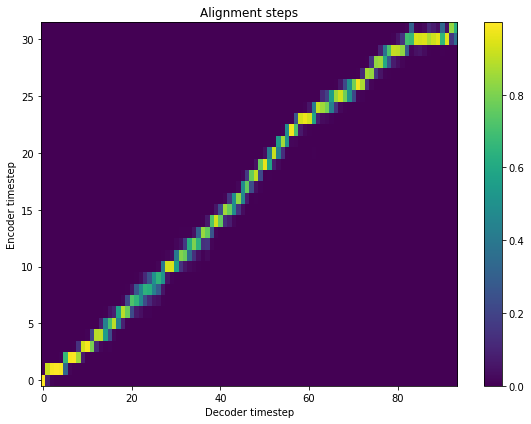

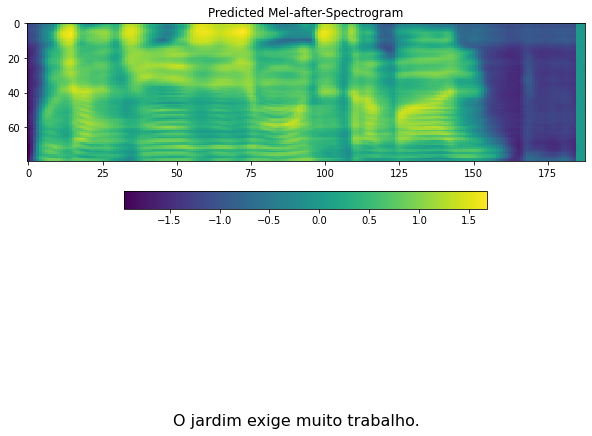

--------------------
--------------------
O pão que eu comprei era ótimo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


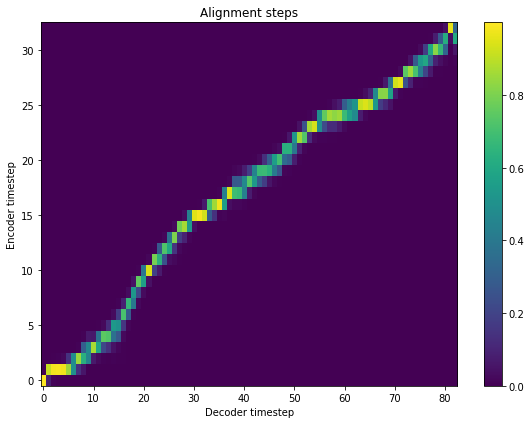

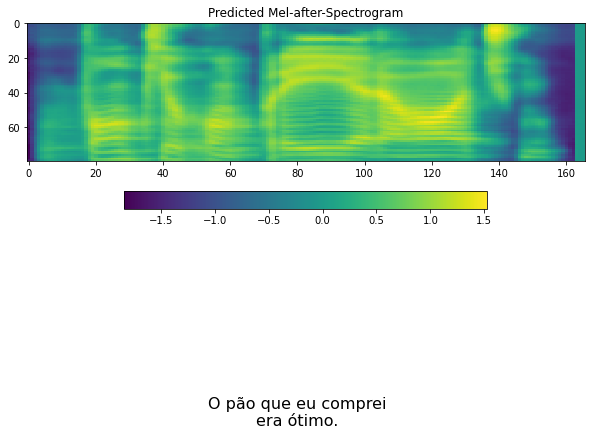

--------------------
--------------------
Meu pai se entenderá com o padre chato amanhã.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


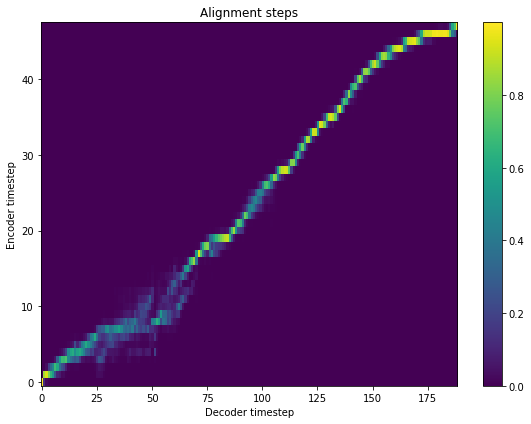

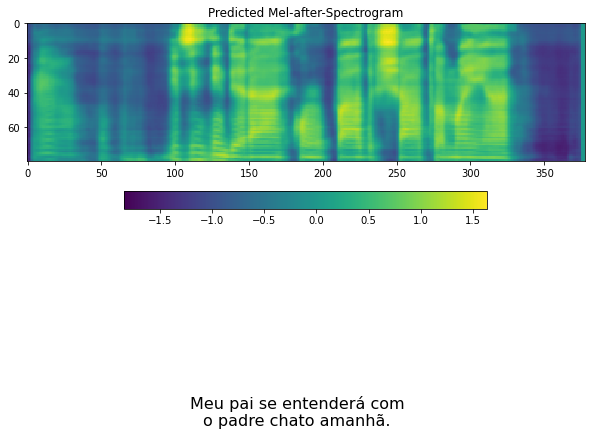

--------------------
--------------------
Durante o dia apague a luz.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


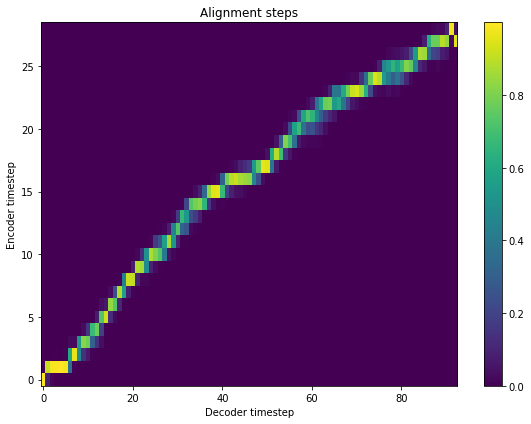

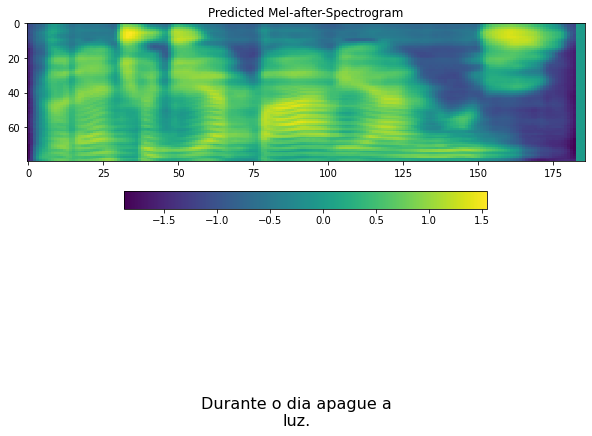

--------------------
--------------------
A sociedade uruguaia tem que se mobilizar.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


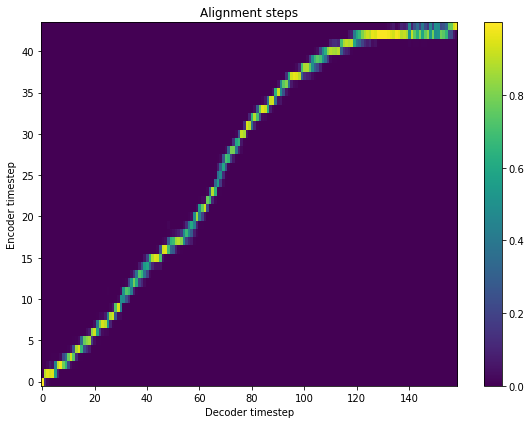

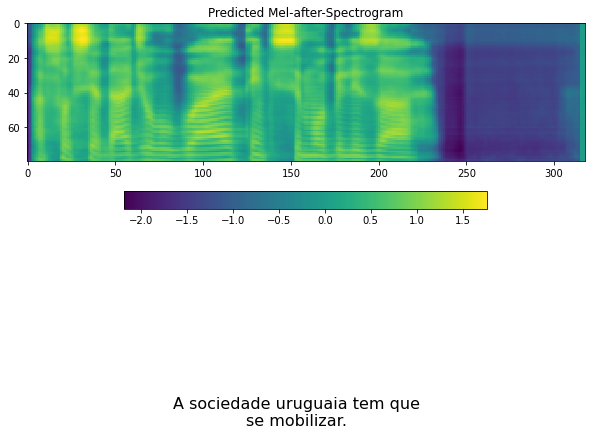

--------------------
--------------------
Nossas atitudes são calmas.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_14


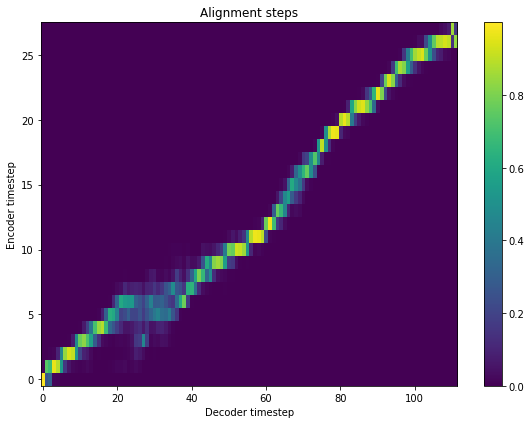

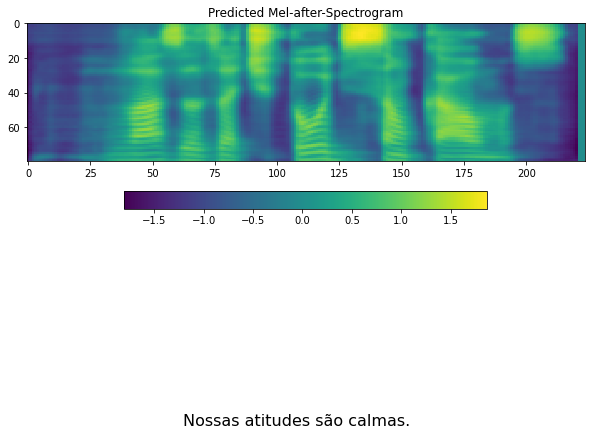

--------------------
--------------------
Dezenas de cabos eleitorais buscavam apoio.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


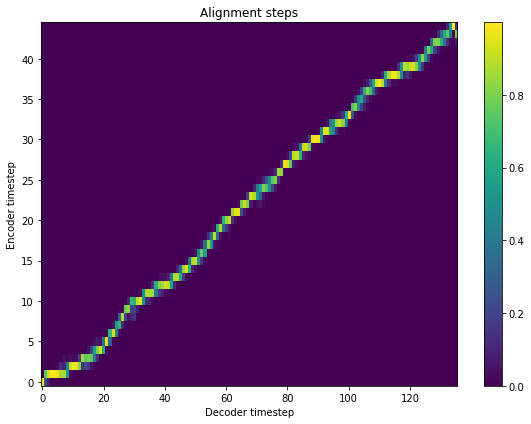

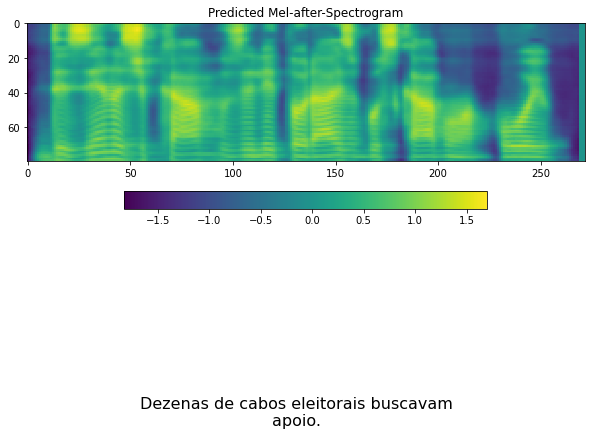

--------------------
--------------------
Nunca uma vitória foi paga com tanto suor.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


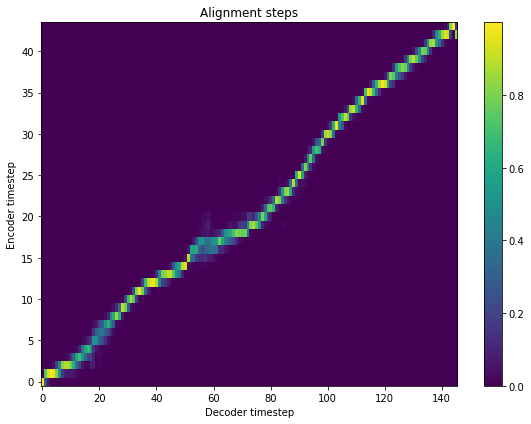

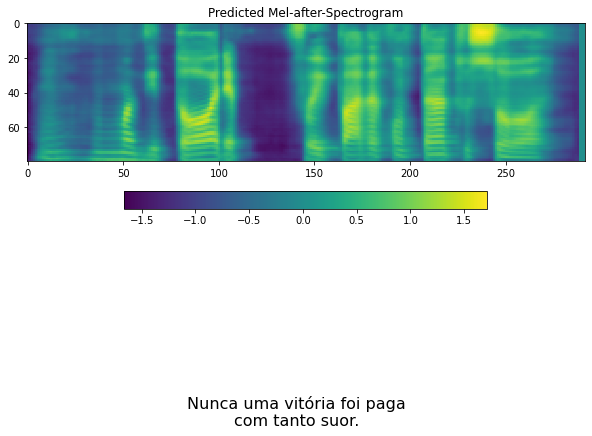

--------------------
--------------------
Nosso filho ama os animais.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


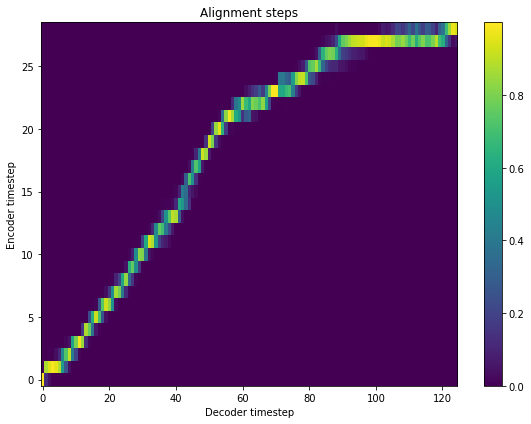

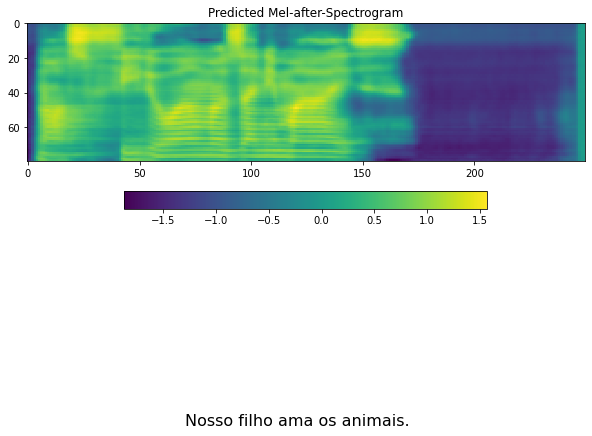

--------------------
--------------------
Esse peixe é mais letal que algumas cobras.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


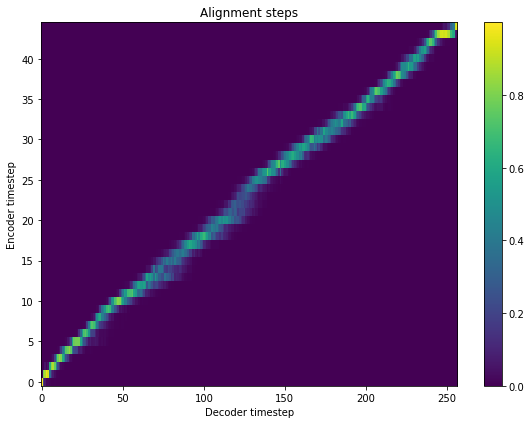

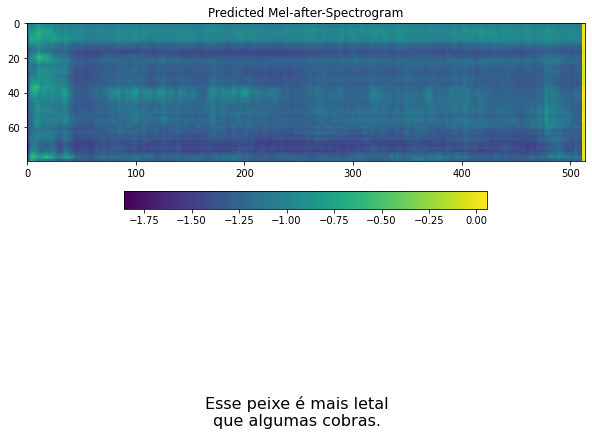

--------------------
--------------------
O time continua lutando pelo sucesso.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


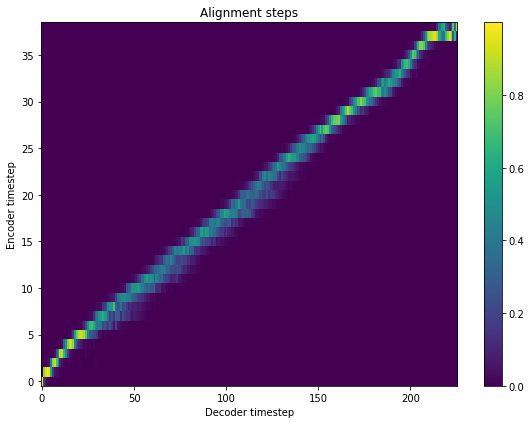

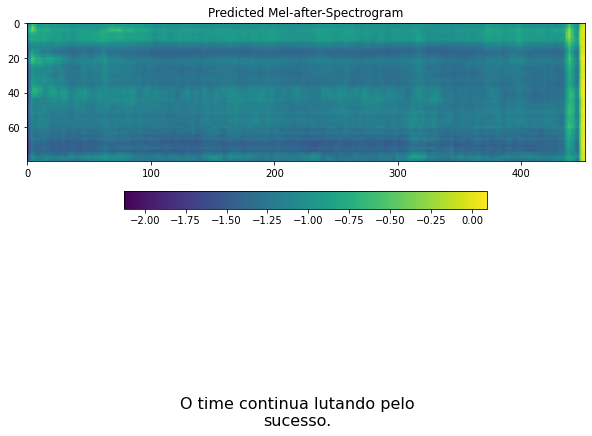

--------------------
--------------------
Essa medida foi devidamente alterada.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


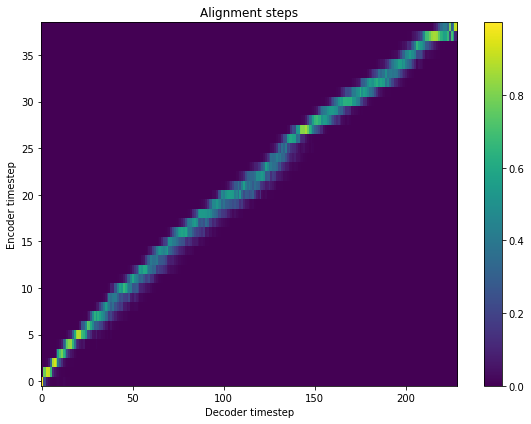

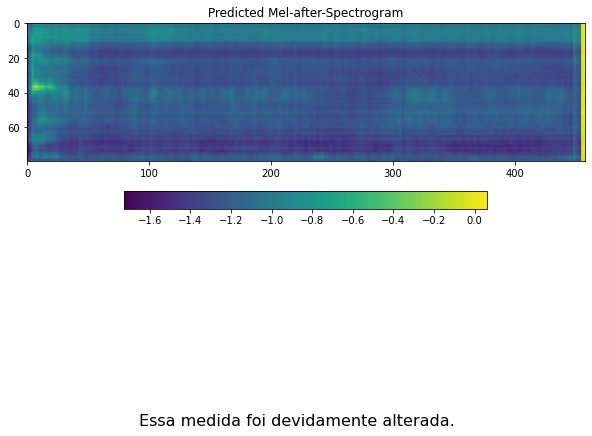

--------------------
--------------------
O estilete é uma arma perigosa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


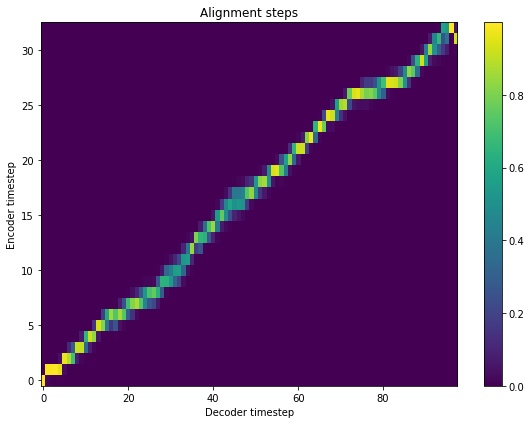

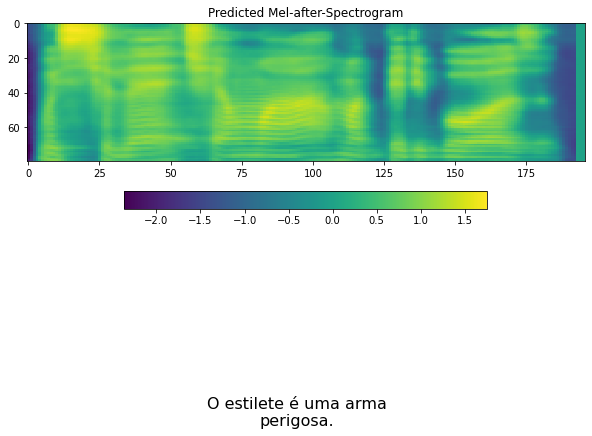

--------------------
--------------------
Me aguarde, quinta-feira eu venho jantar em casa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


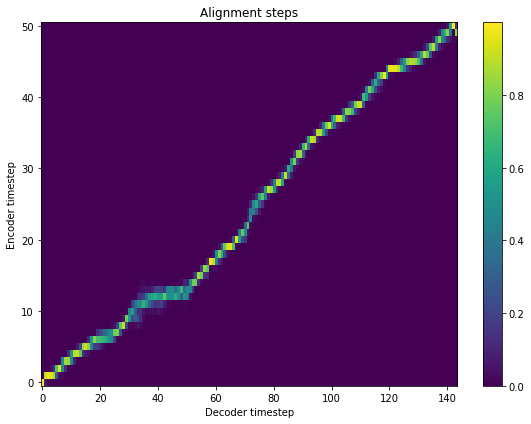

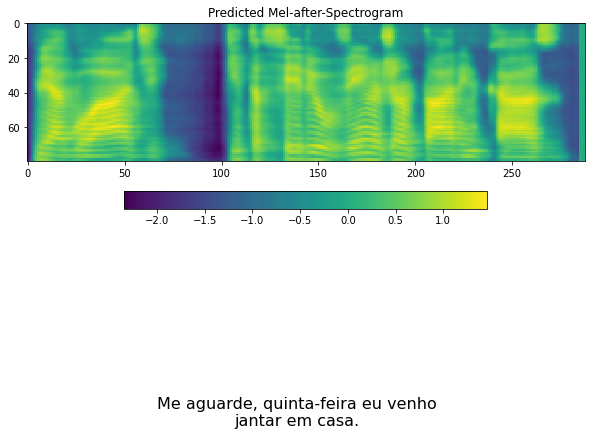

--------------------
--------------------
A mudança é lenta porém duradoura.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


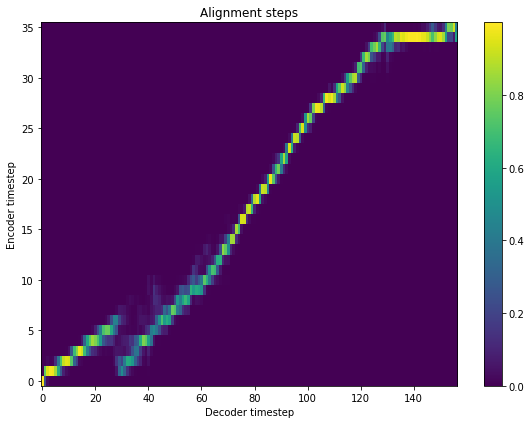

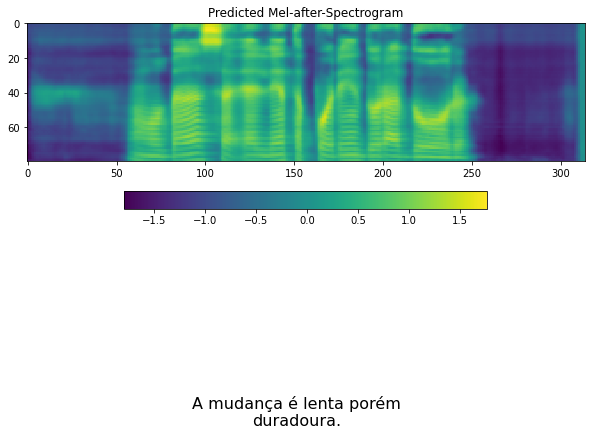

--------------------
--------------------
O clima não é mais seco no interior.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_15


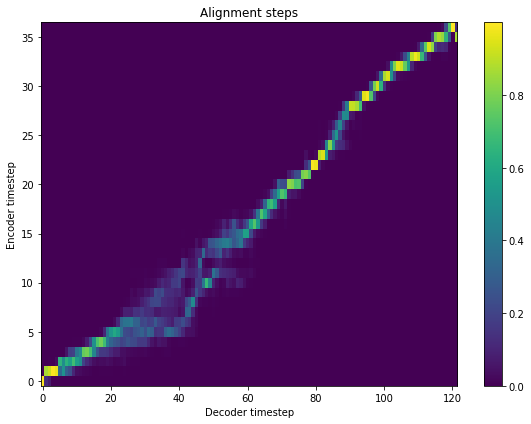

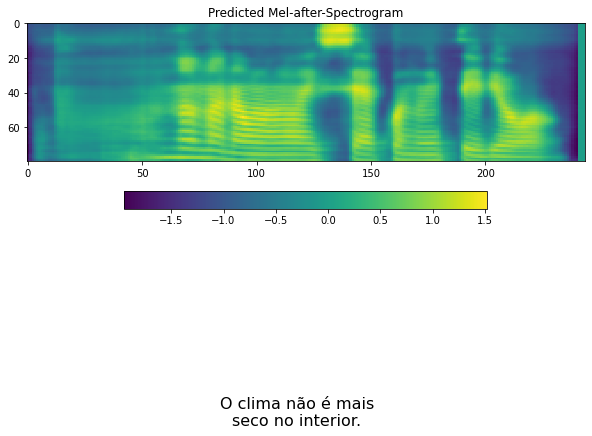

--------------------
--------------------
Sua sensibilidade mostrará o caminho.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


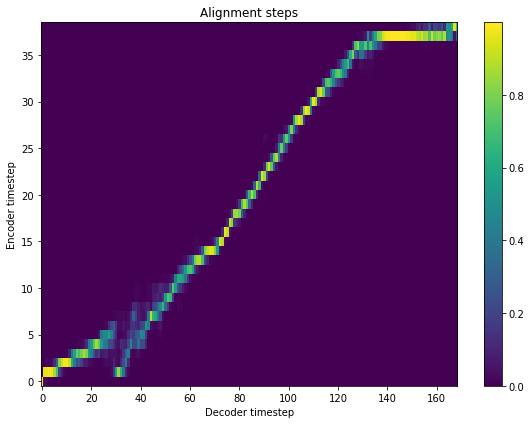

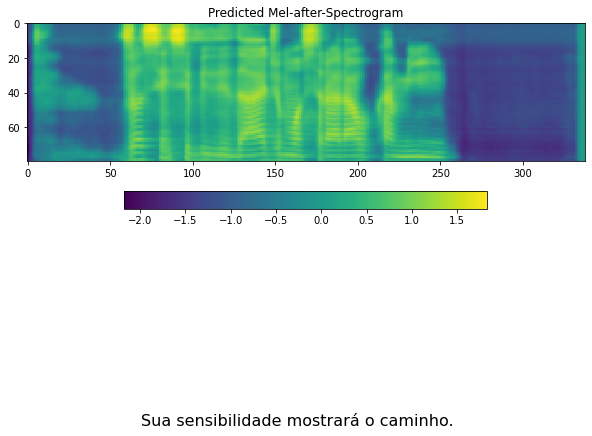

--------------------
--------------------
A Amazônia é a reserva ecológica do globo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


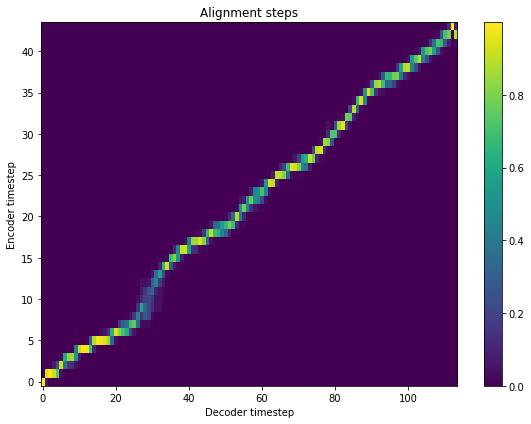

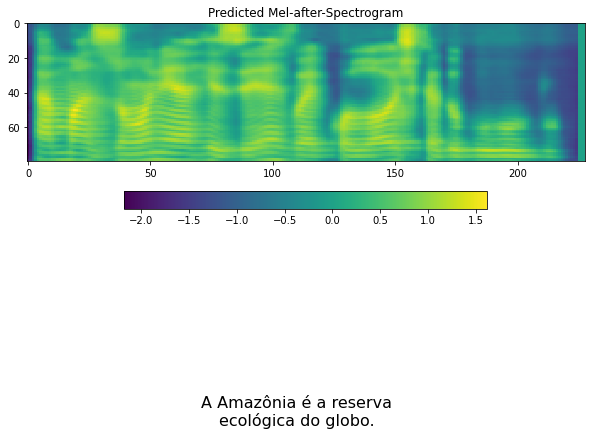

--------------------
--------------------
O ministério mudou demais com a eleição.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


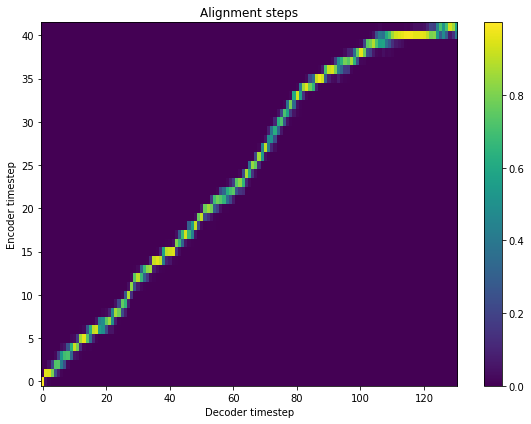

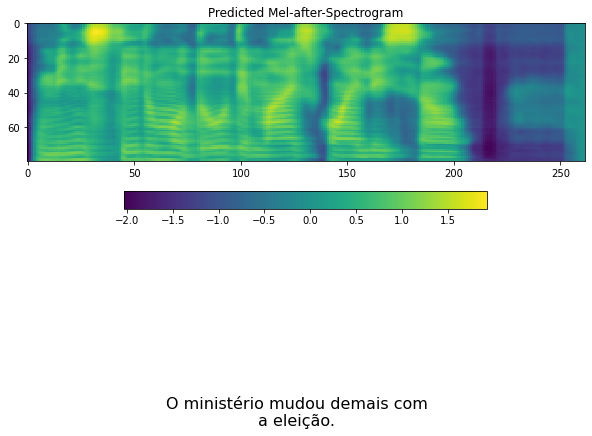

--------------------
--------------------
Novas metas surgem na informática.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


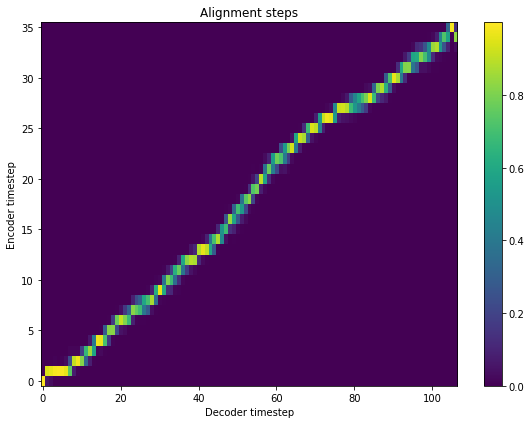

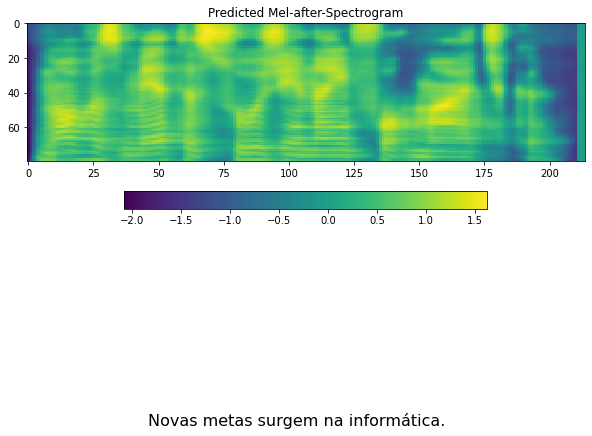

--------------------
--------------------
O capital de uma empresa depende de produção.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


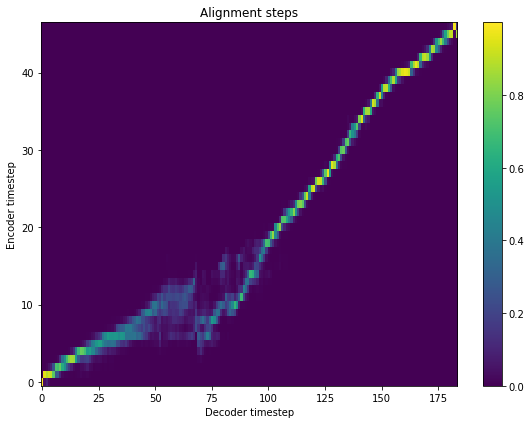

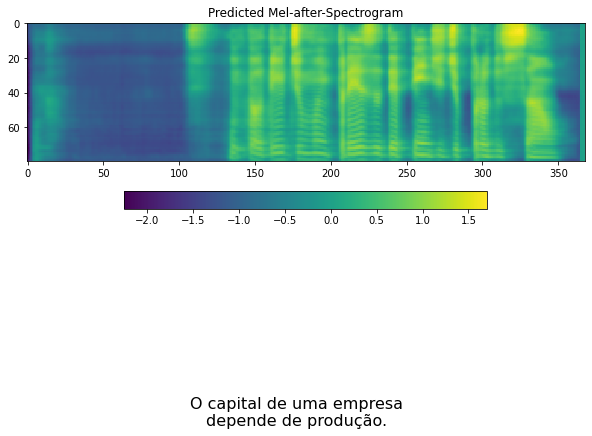

--------------------
--------------------
Se não fosse ela, tudo teria sido melhor.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


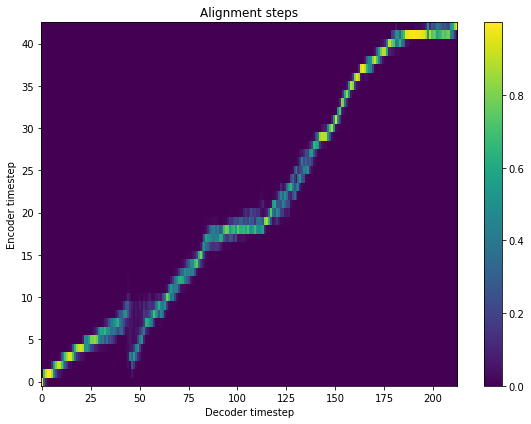

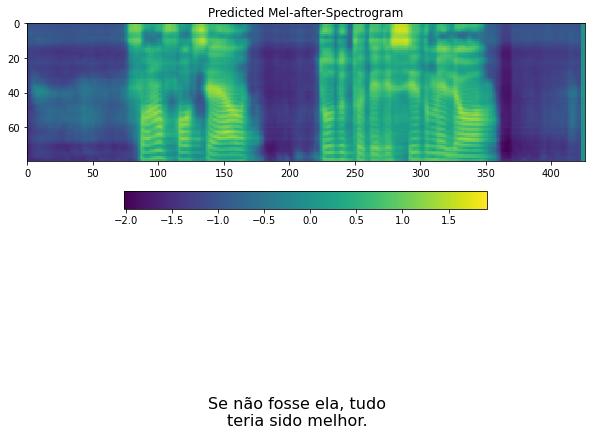

--------------------
--------------------
A principal personagem no filme é uma gueixa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


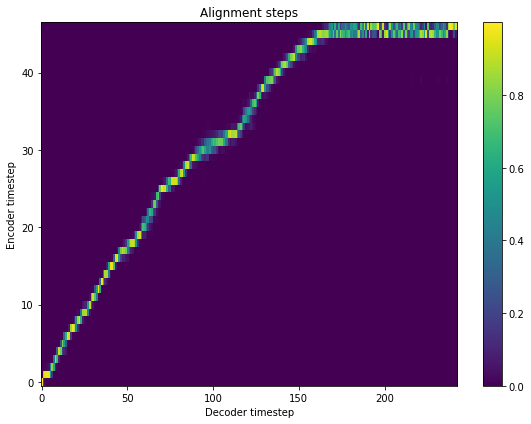

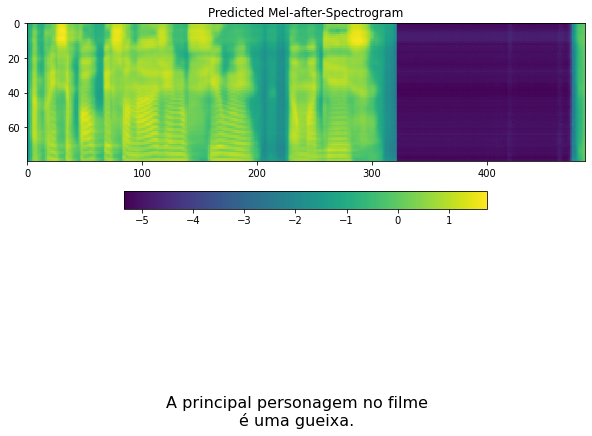

--------------------
--------------------
Espere seu amigo em casa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


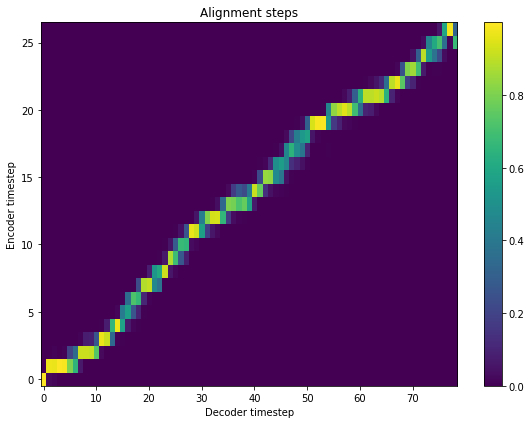

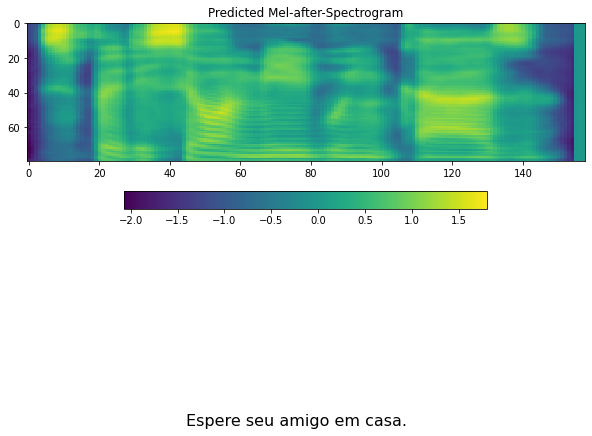

--------------------
--------------------
A juventude tinha que revolucionar a escola.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


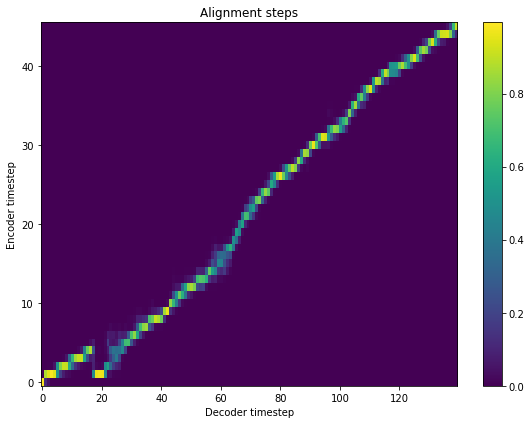

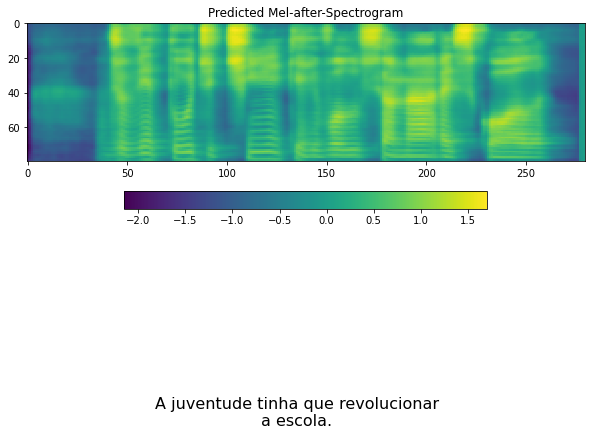

--------------------
--------------------
A cantora terá quatro meses pra ensaiar seu canto.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_16


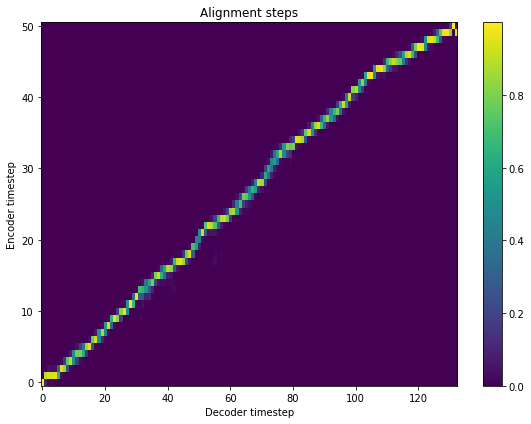

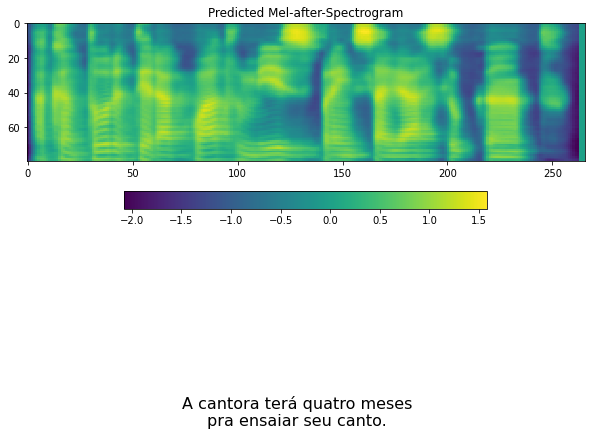

--------------------
--------------------
Prazer em conhecê-los.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


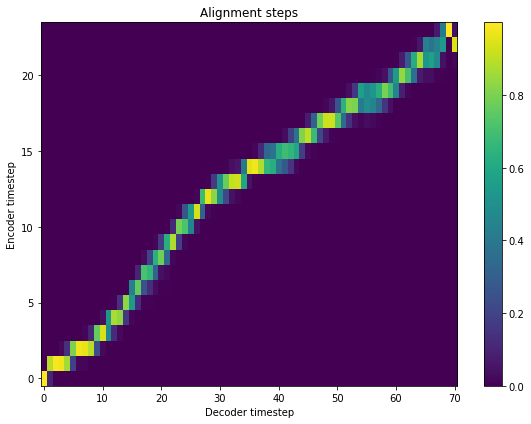

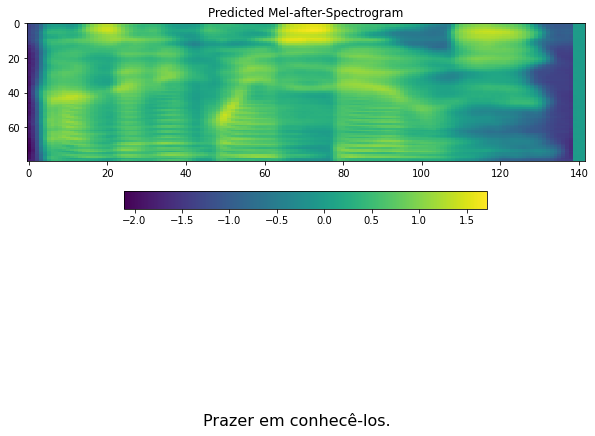

--------------------
--------------------
Elas traziam o equipamento.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


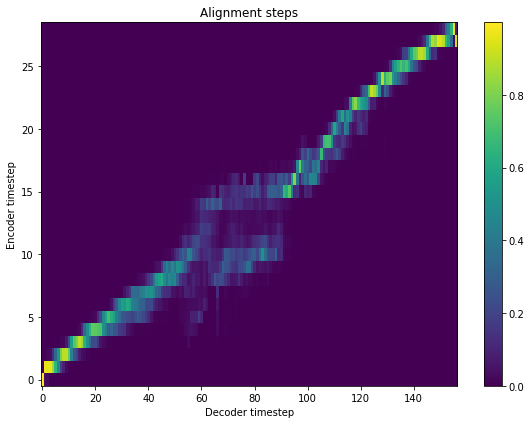

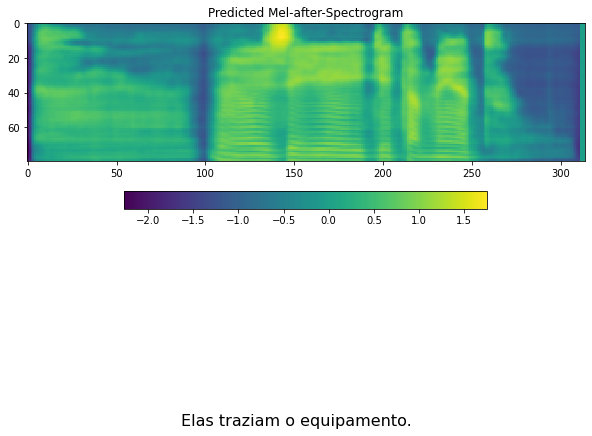

--------------------
--------------------
O sol ilumina o planeta.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


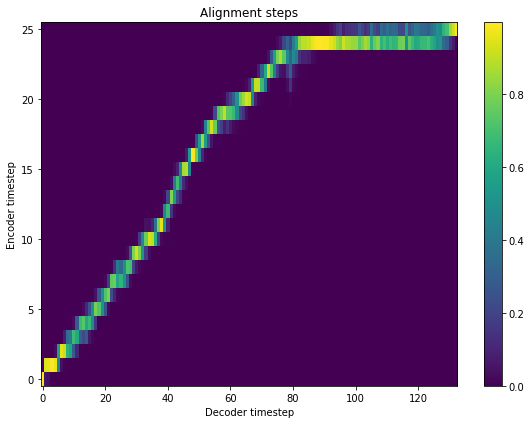

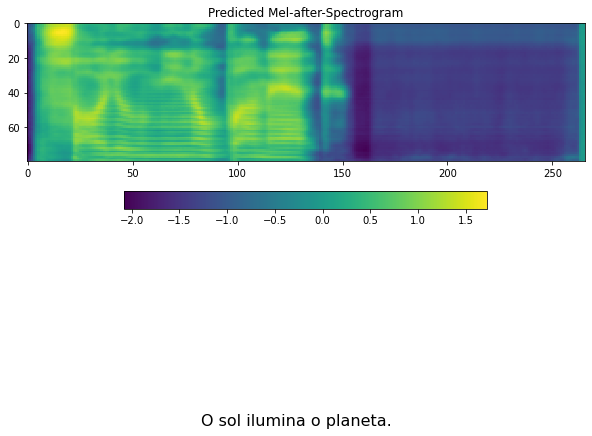

--------------------
--------------------
A correção do exame foi coerente.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


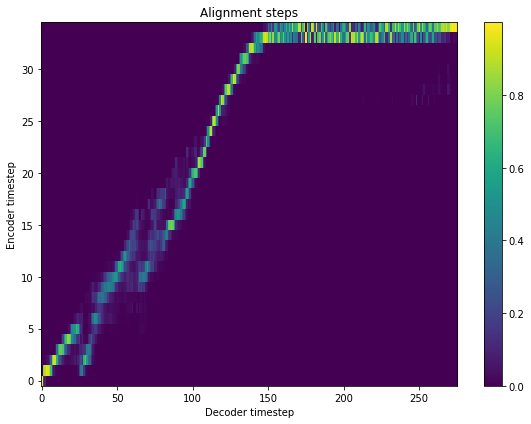

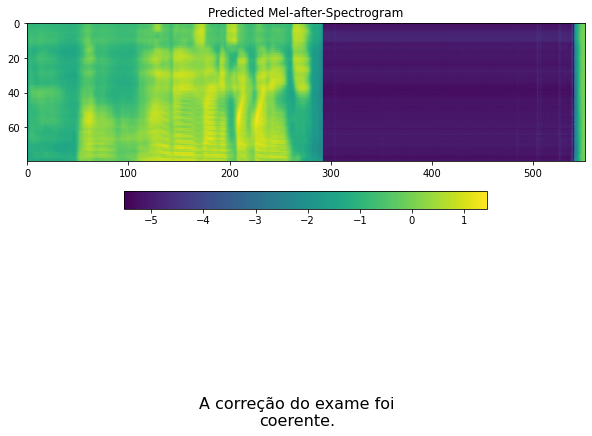

--------------------
--------------------
O vidro é antigo mas o armário, não.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


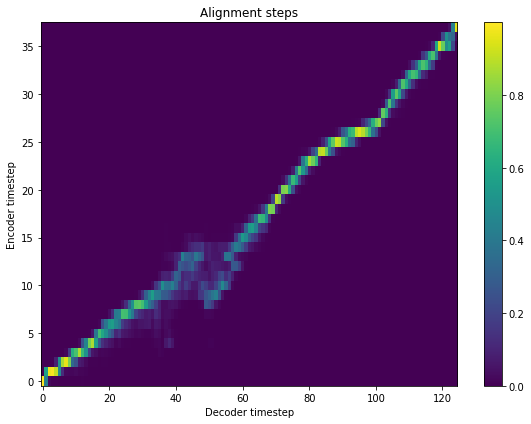

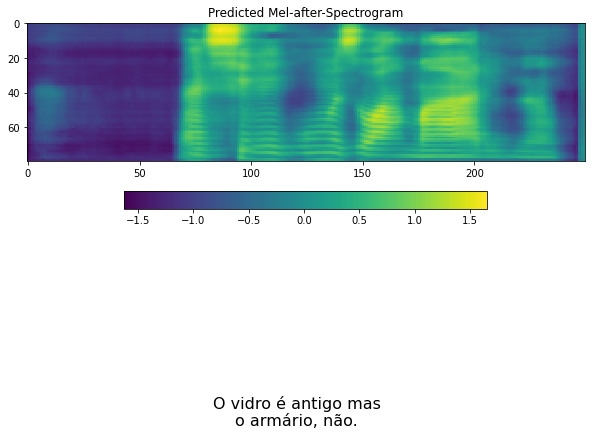

--------------------
--------------------
O natal deve ser um dia alegre.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


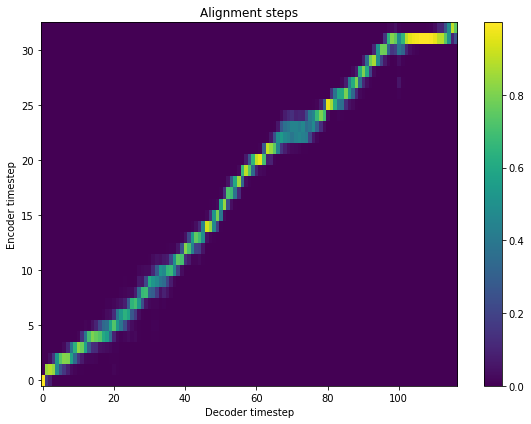

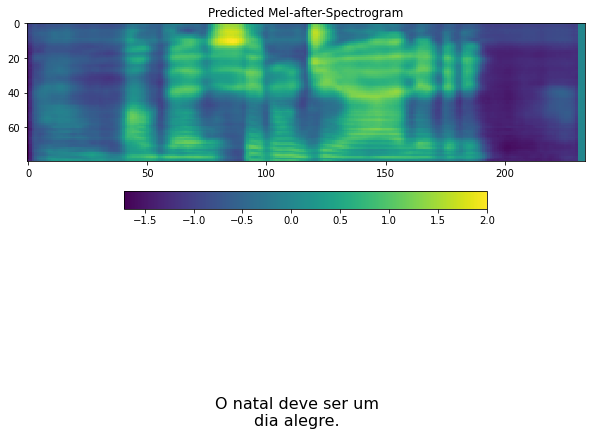

--------------------
--------------------
Trabalhei mais do que podia.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


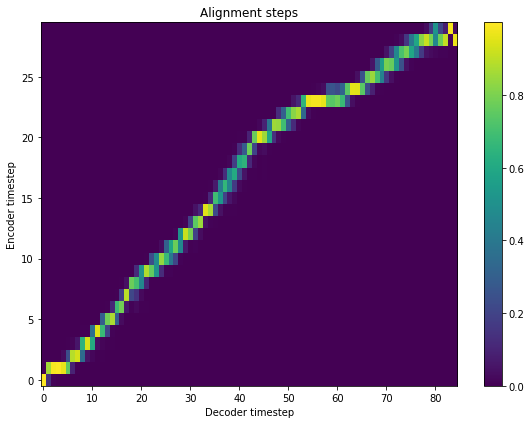

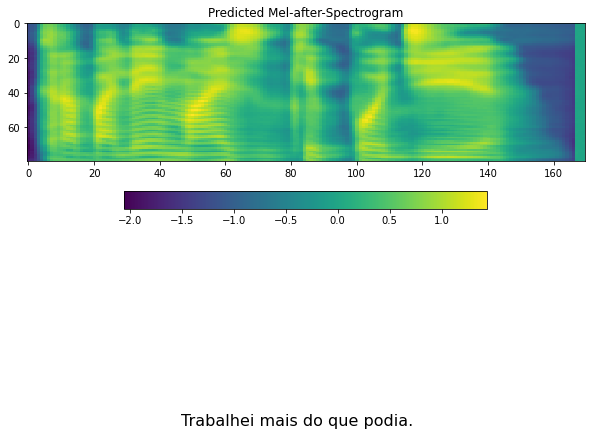

--------------------
--------------------
Hoje eu acordei calmo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


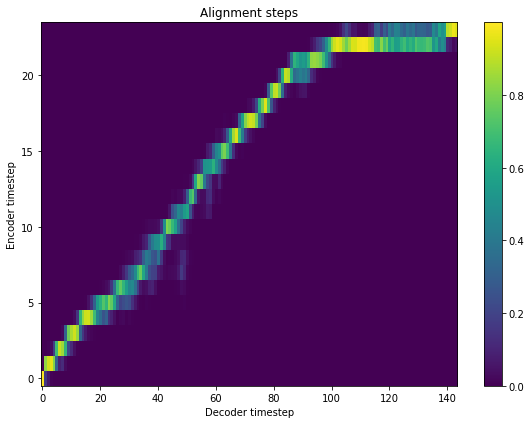

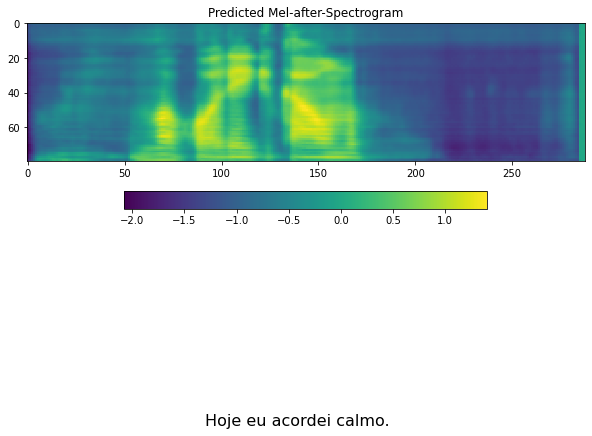

--------------------
--------------------
Esse canal parece bastante chato.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


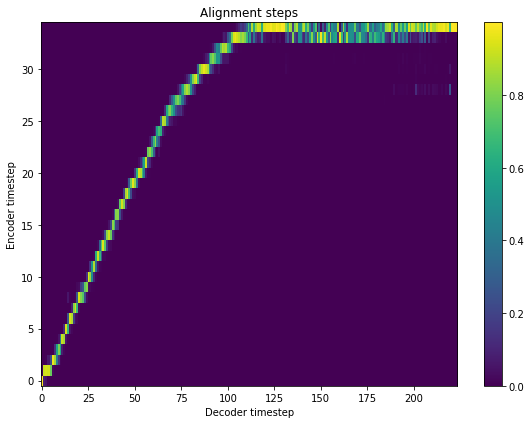

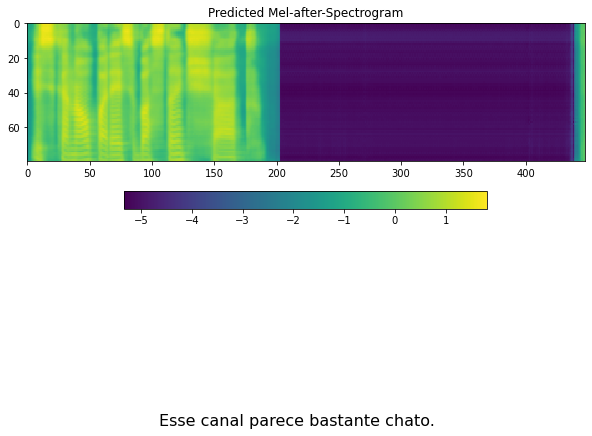

--------------------
--------------------
Nem parece que nós nascemos aqui. 
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_17


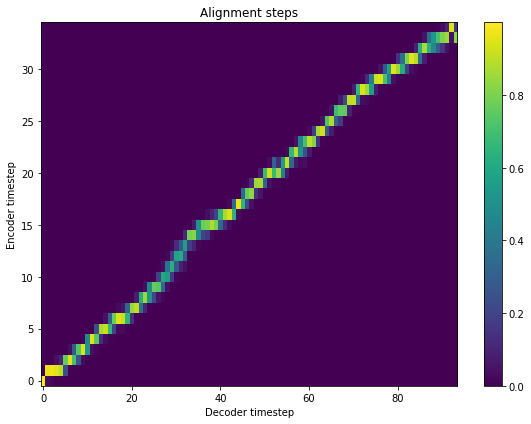

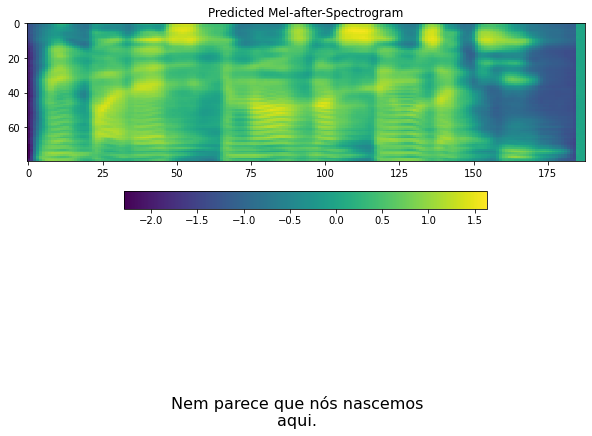

--------------------
--------------------
Receba minha prima na festa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


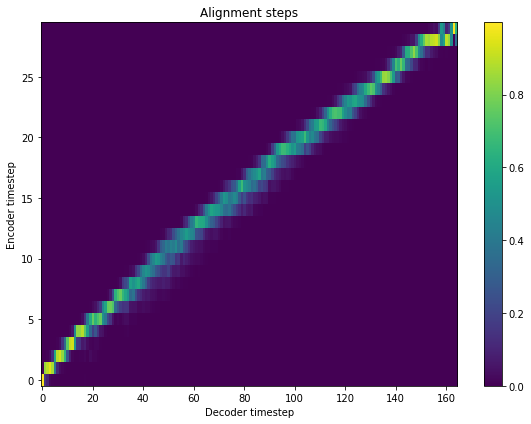

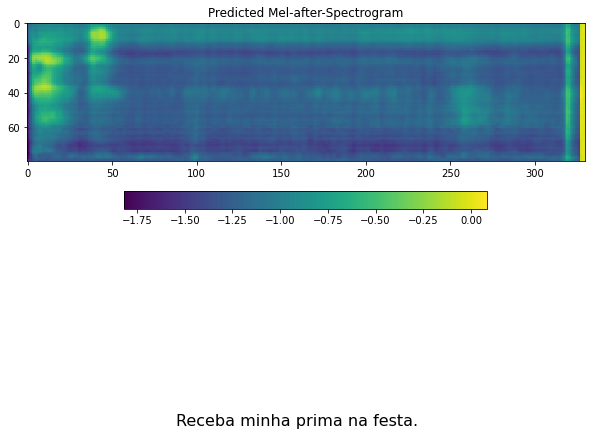

--------------------
--------------------
Ela planejou um grande banquete cheio de gente.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


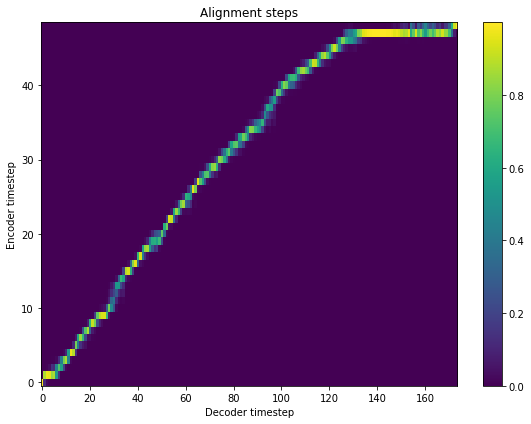

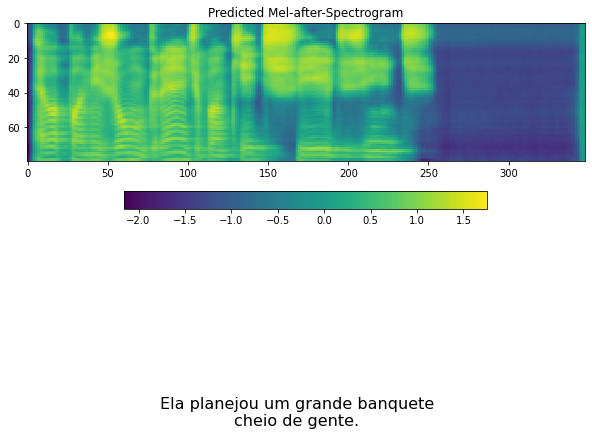

--------------------
--------------------
No lado de cá do rio há uma boa sombra.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


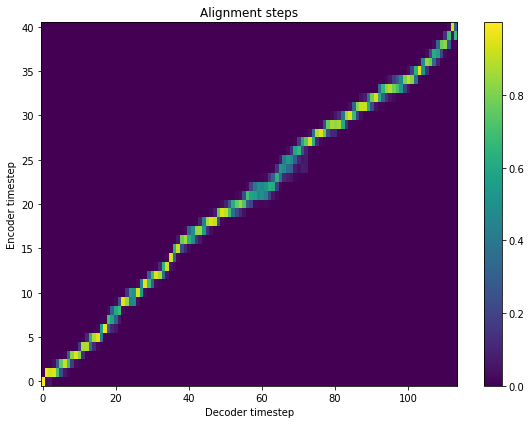

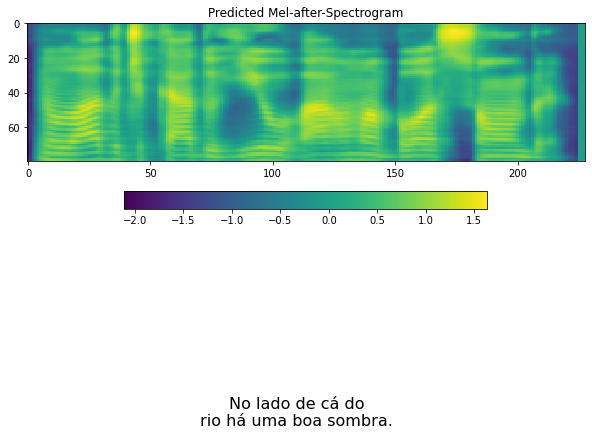

--------------------
--------------------
A maioria dos visitantes gosta deste momento.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


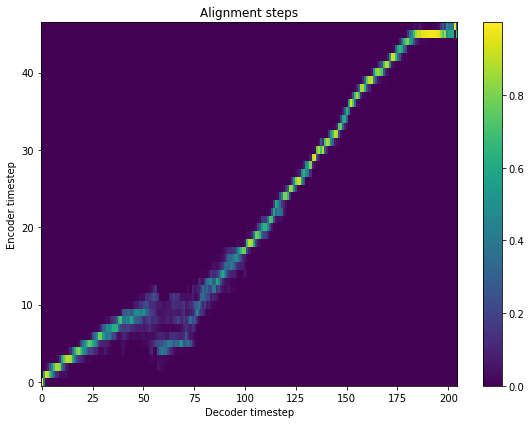

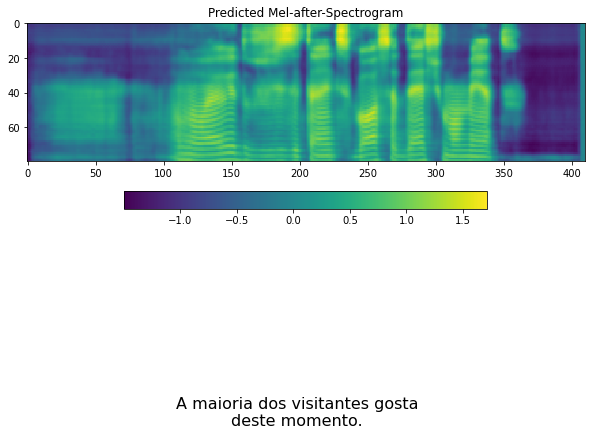

--------------------
--------------------
Minha filha é especialista em música sacra.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


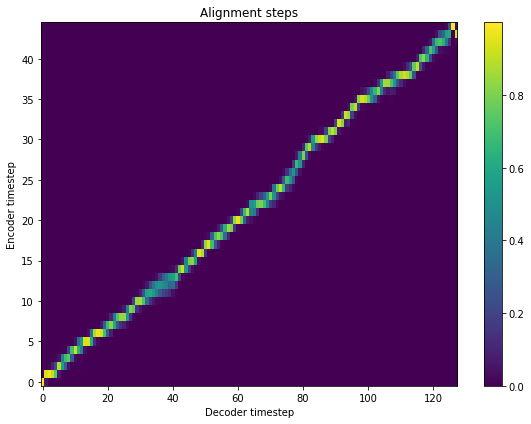

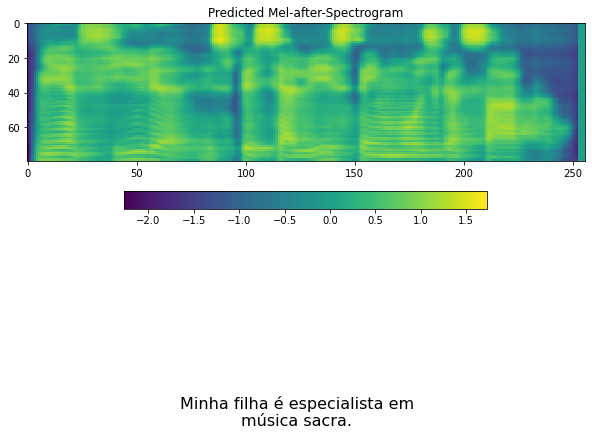

--------------------
--------------------
A casa só tem um quarto.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


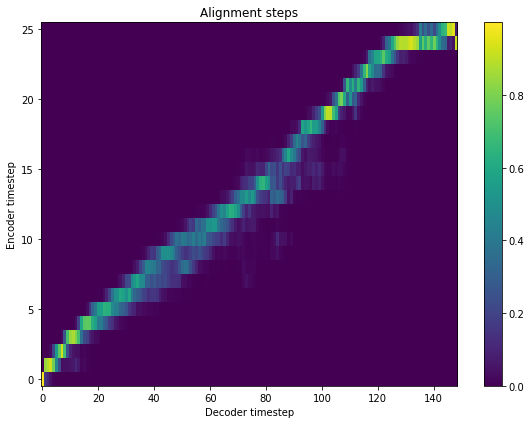

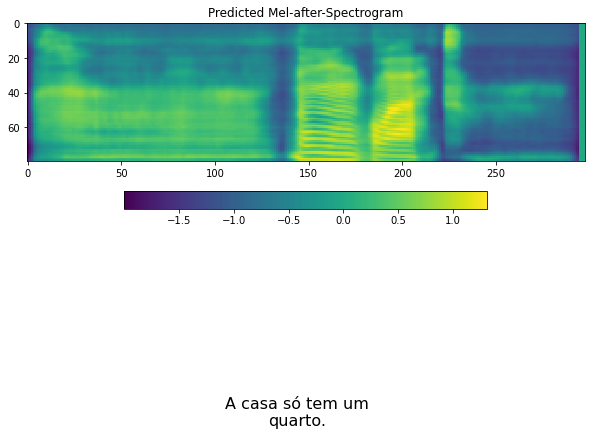

--------------------
--------------------
A duração do simpósio é de cinco dias.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


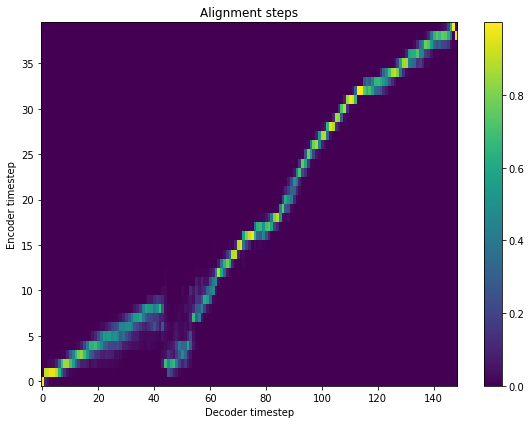

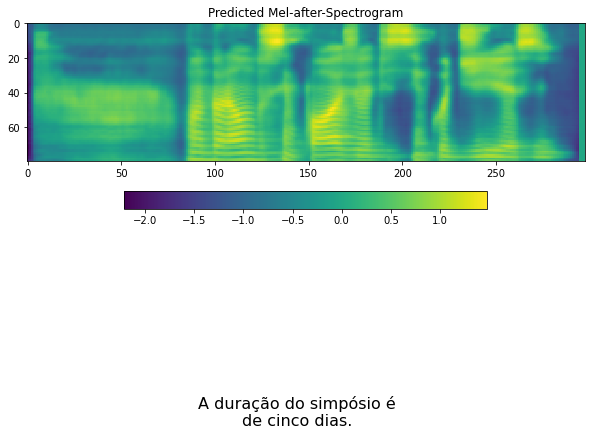

--------------------
--------------------
Ao contrário de nossa expectativa, tudo foi tranquilo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


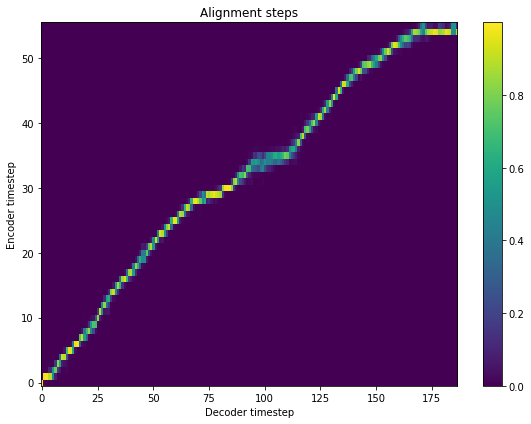

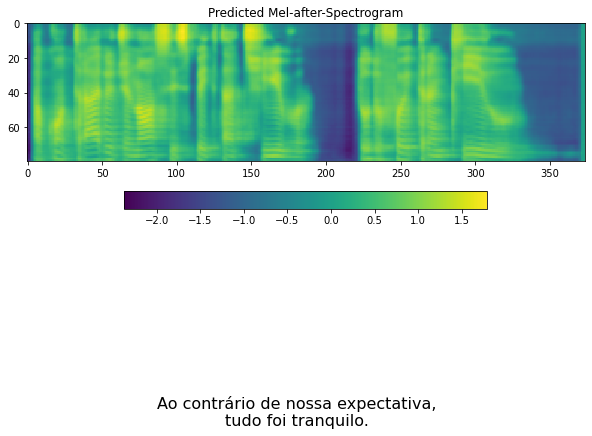

--------------------
--------------------
A intenção é ter o apoio do governante.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


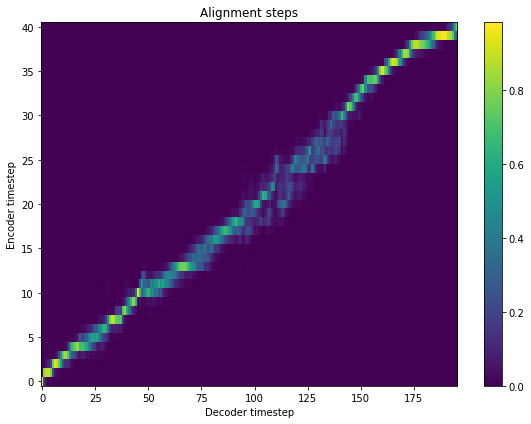

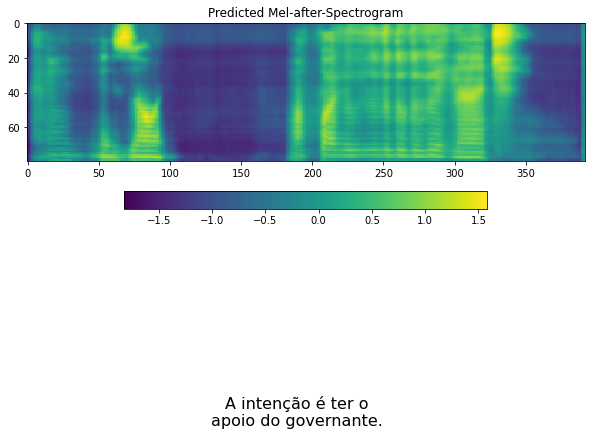

--------------------
--------------------
A fila aumentou ao longo do dia.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_18


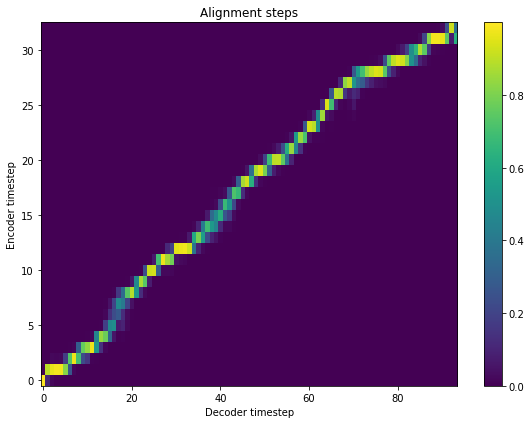

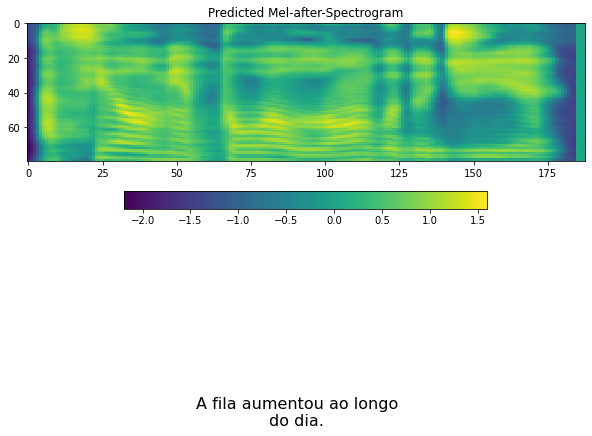

--------------------
--------------------
À noite, a temperatura deve ir a zero.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


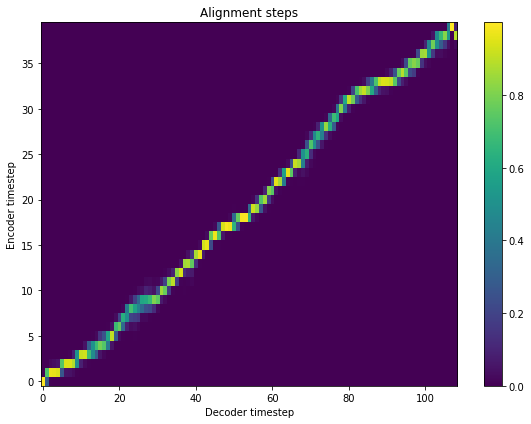

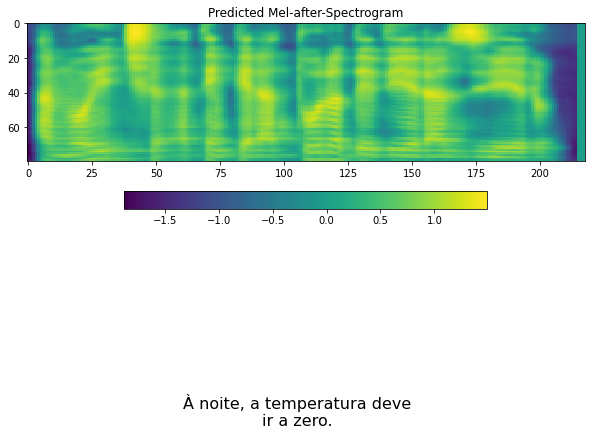

--------------------
--------------------
A proposta foi inspecionada pela gerência.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


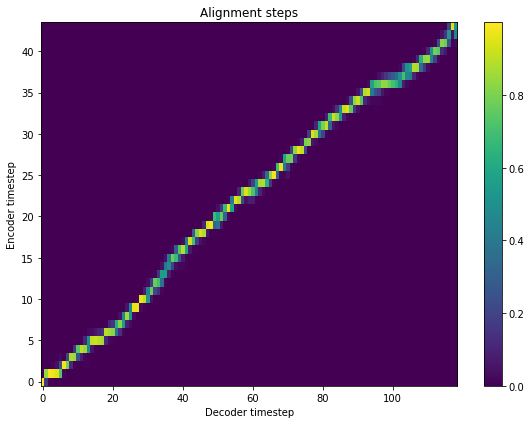

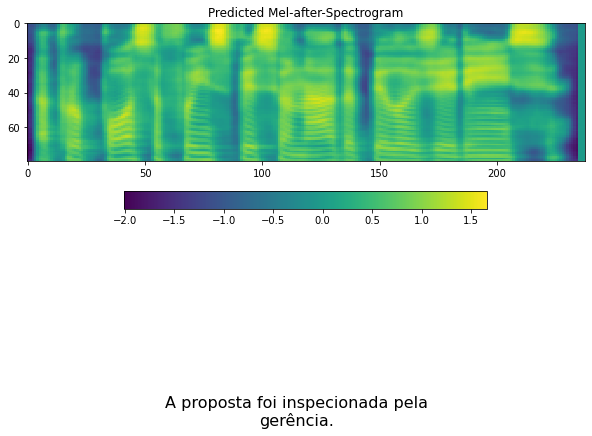

--------------------
--------------------
Os quadros azuis mostram o codidiano.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


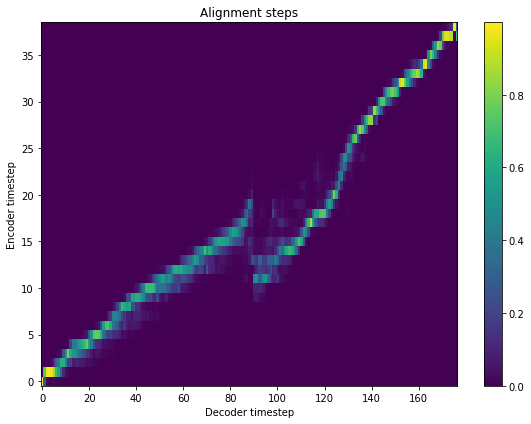

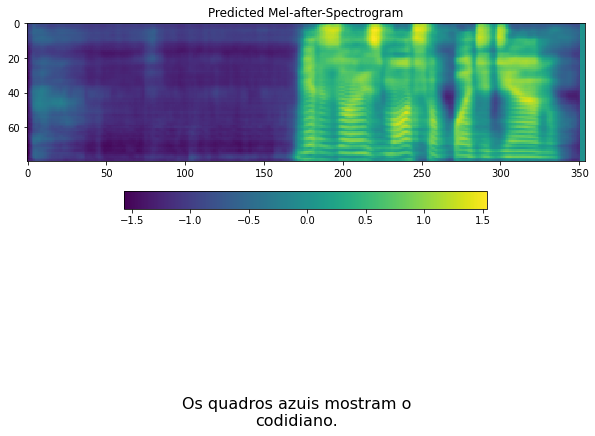

--------------------
--------------------
Já era tarde, quando ele me abordou.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


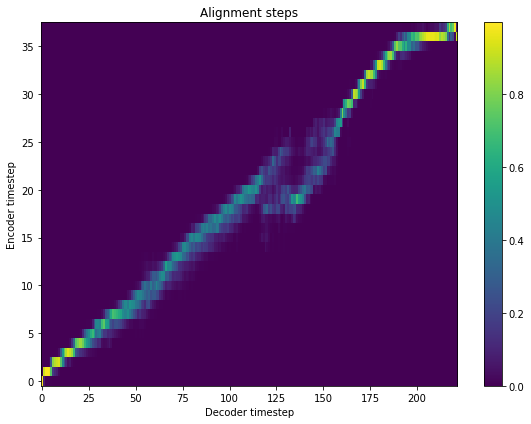

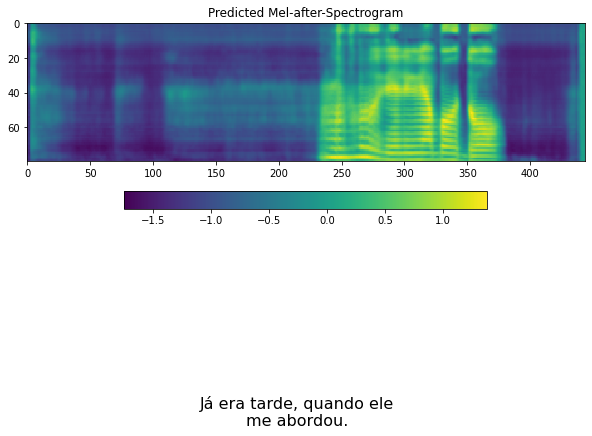

--------------------
--------------------
O canário canta ao amanhecer.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


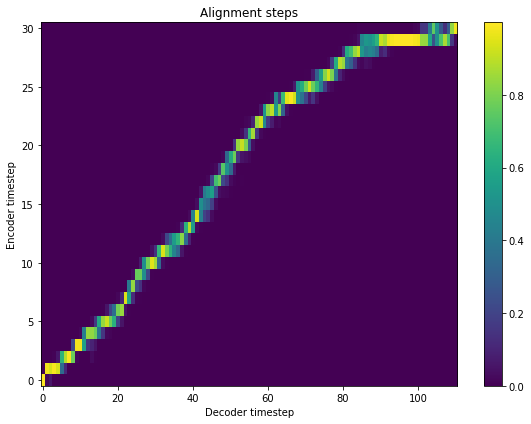

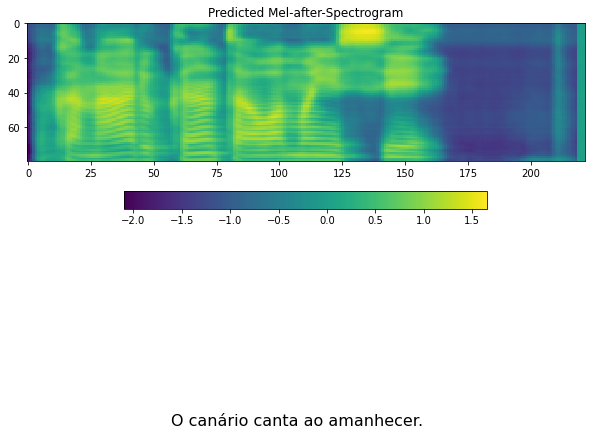

--------------------
--------------------
A lojinha não fica na esquina.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


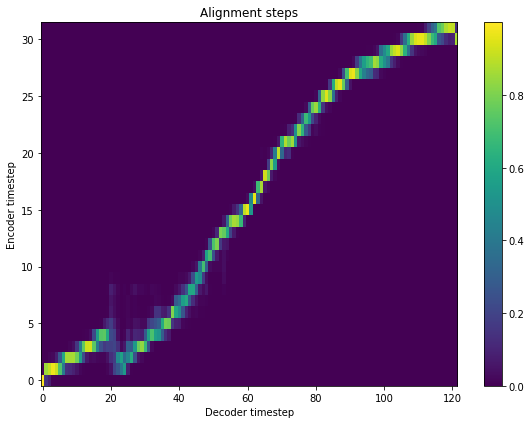

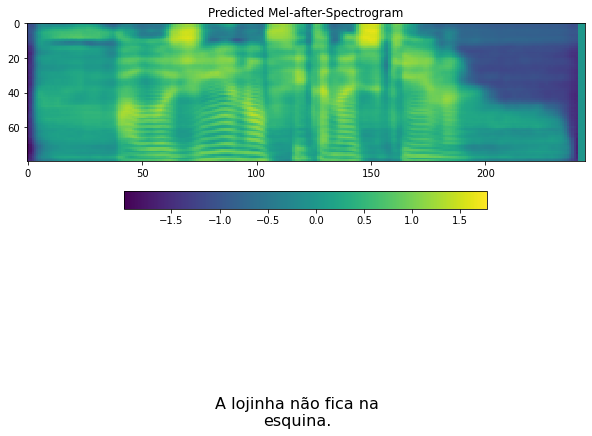

--------------------
--------------------
Meu bom time se consagrou como o melhor.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


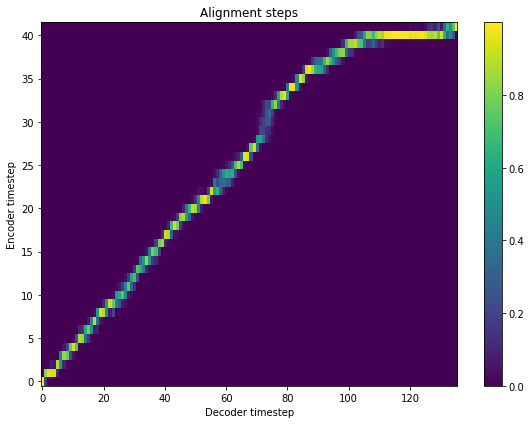

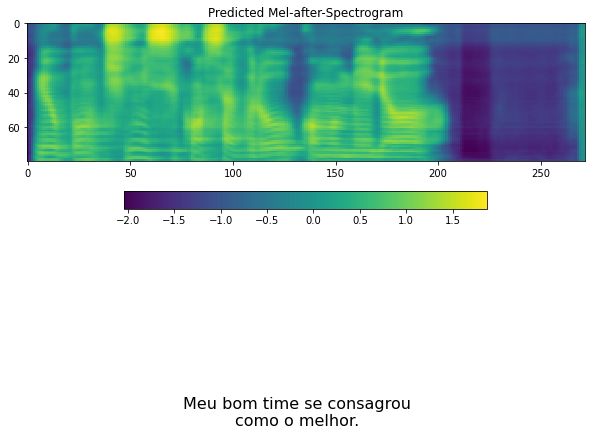

--------------------
--------------------
O instituto deve servir a sua meta.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


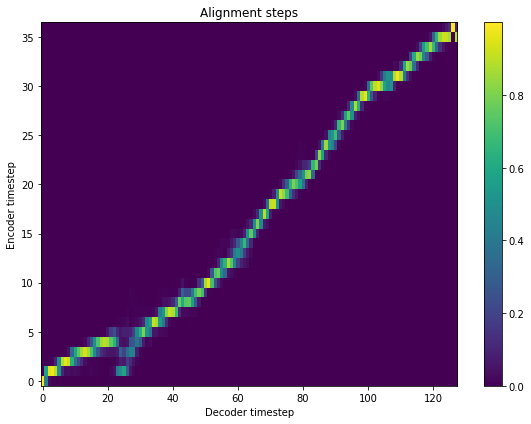

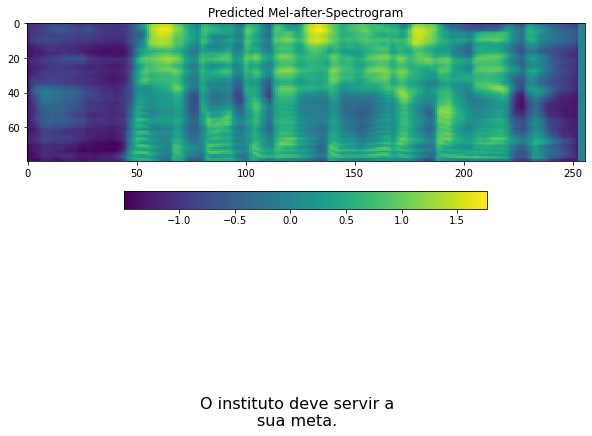

--------------------
--------------------
Ele não entende, nem quando se fala pausadamente.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


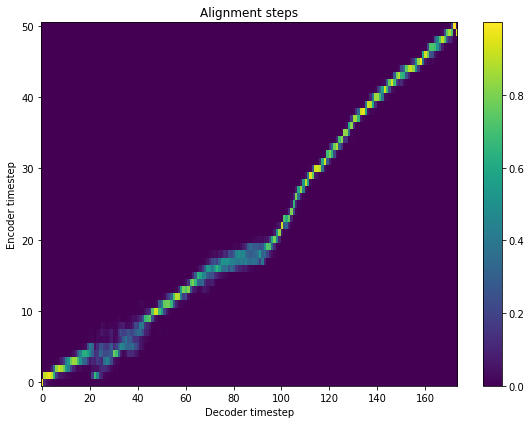

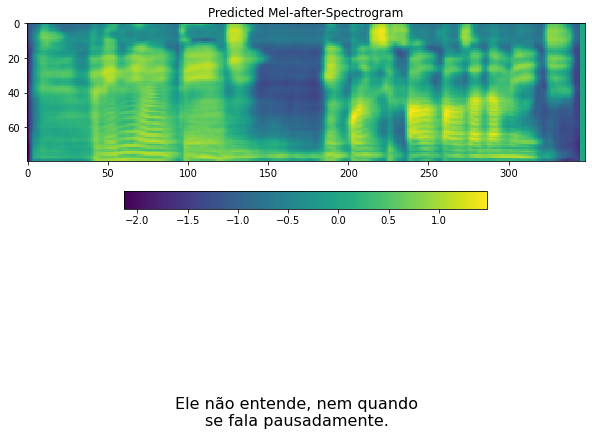

--------------------
--------------------
Seu limite do cheque azul foi aumentado.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_19


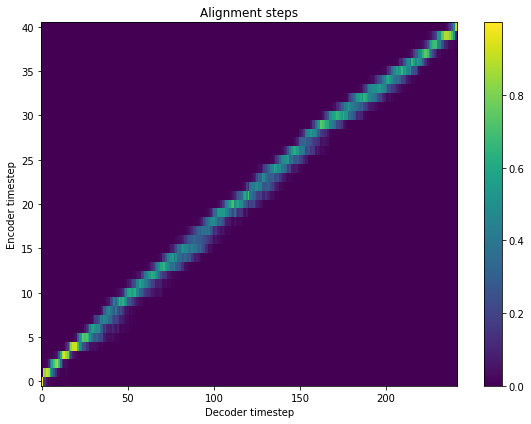

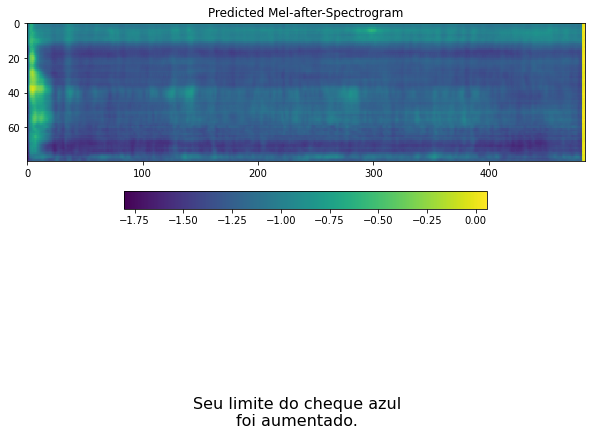

--------------------
--------------------
O termômetro indicava o calor.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


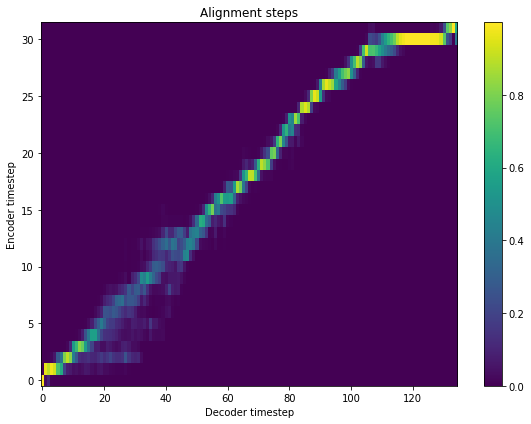

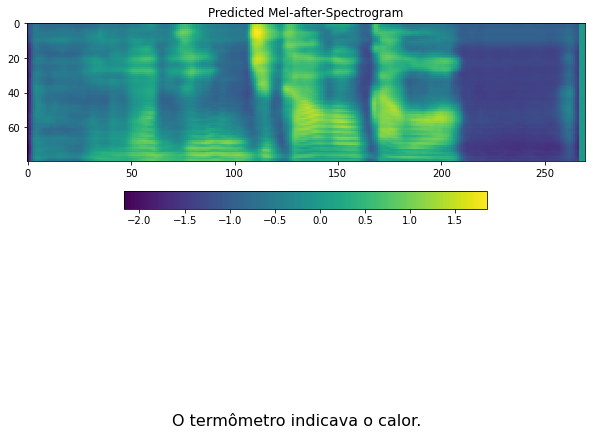

--------------------
--------------------
O discurso de abertura tem que ser longo.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


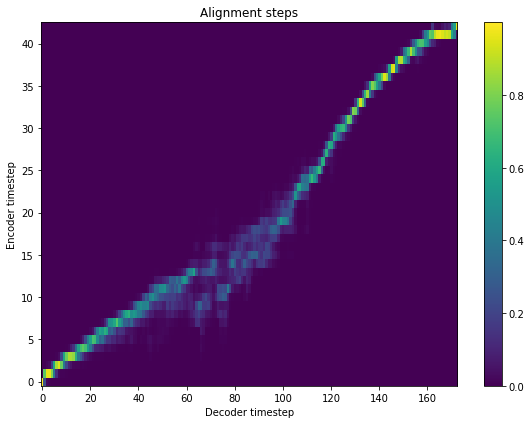

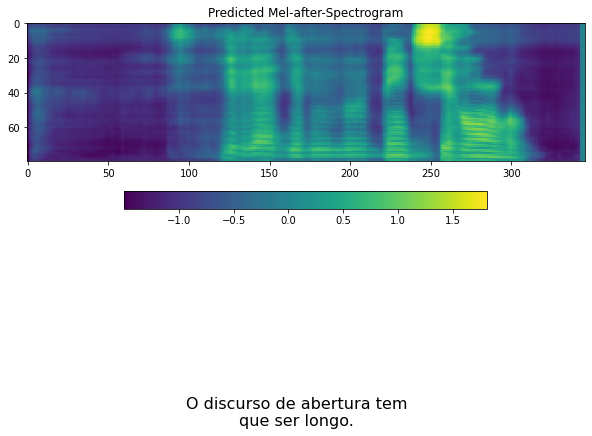

--------------------
--------------------
Eu precisei de tempo na conferência.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


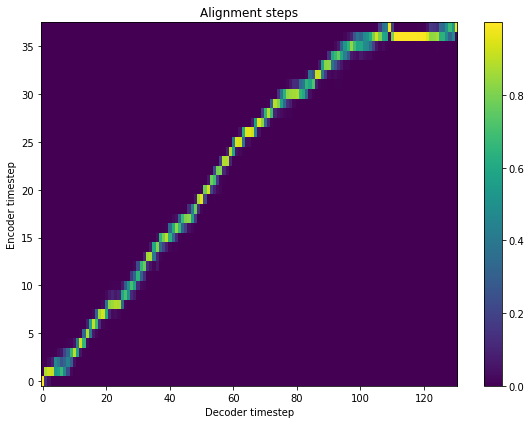

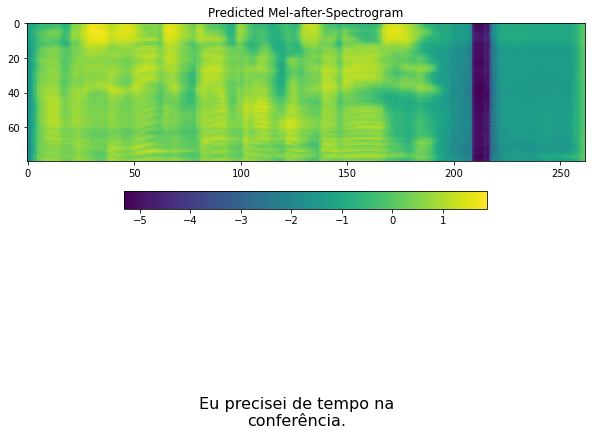

--------------------
--------------------
Zeca marcou a temporada de jogos.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


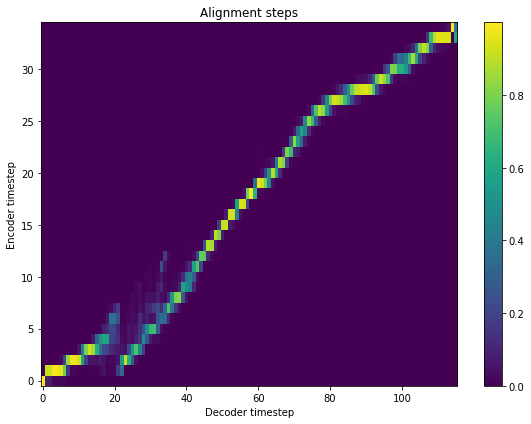

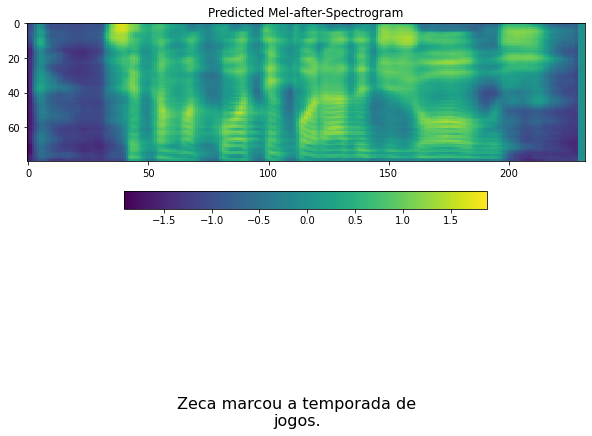

--------------------
--------------------
Nada como um almoço ao ar livre.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


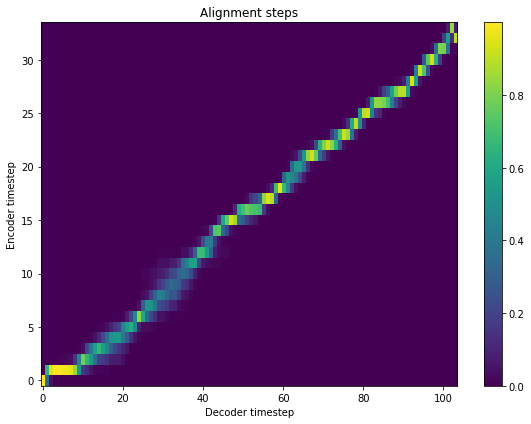

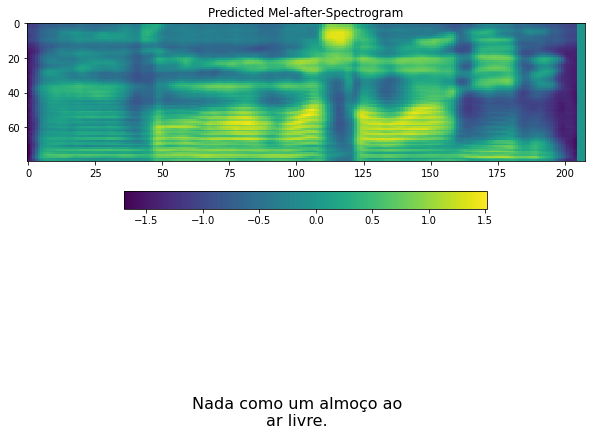

--------------------
--------------------
Nossa filha é a primeira da classe.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


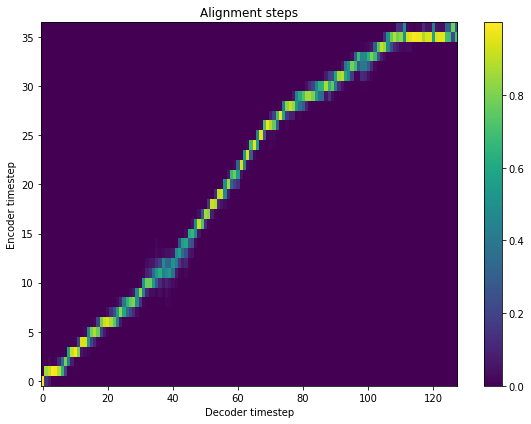

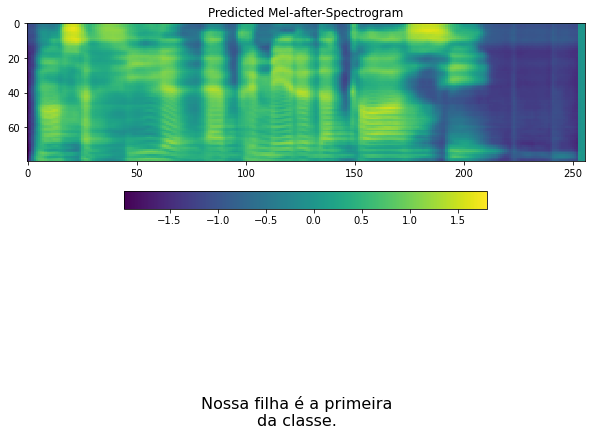

--------------------
--------------------
Gostaria de chamar meu pai.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


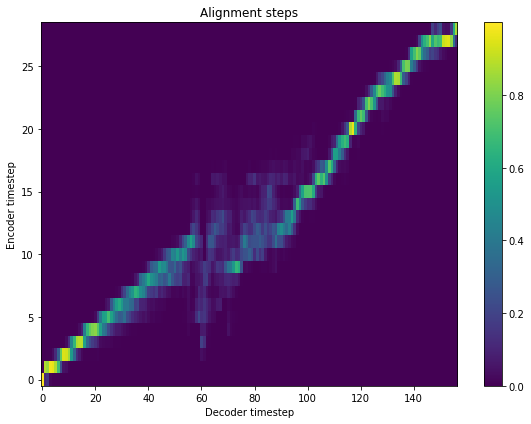

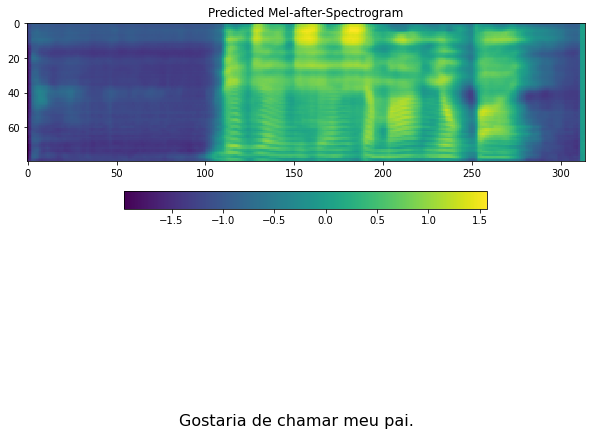

--------------------
--------------------
Não tive uma prova cansativa.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


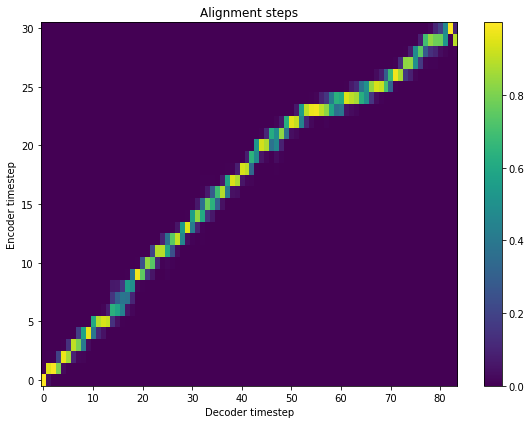

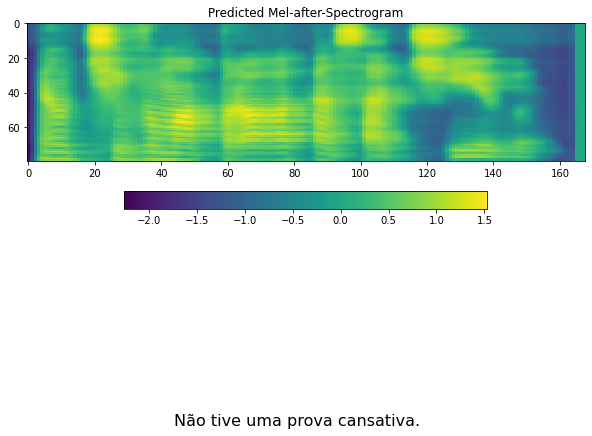

--------------------
--------------------
Ainda tenho cinco telefonemas pra dar.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


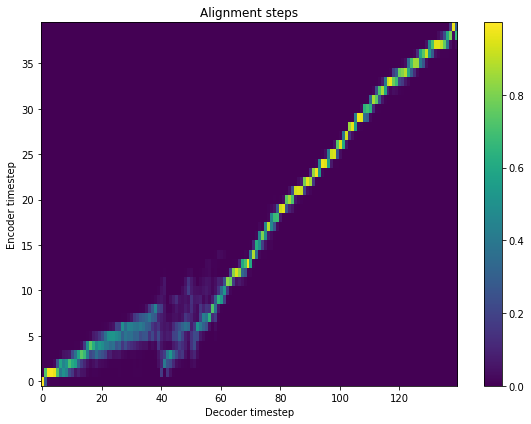

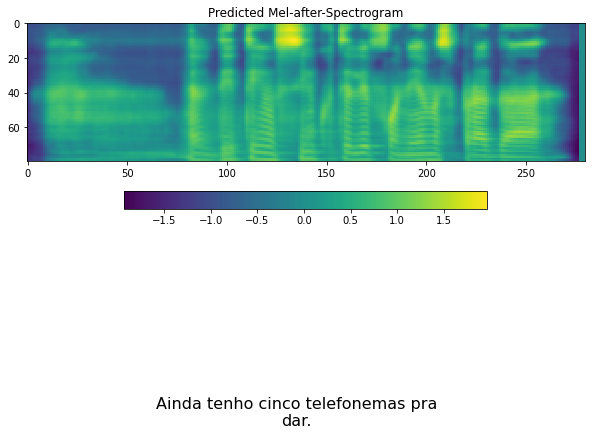

--------------------
--------------------
Os hotéis do sudoeste são fantásticos.
/home/rodrigo-kobashikawa/TensorFlowTTS/notebooks/tacotron_output/output_20


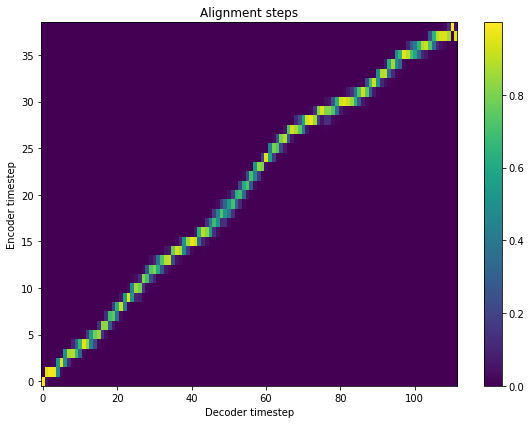

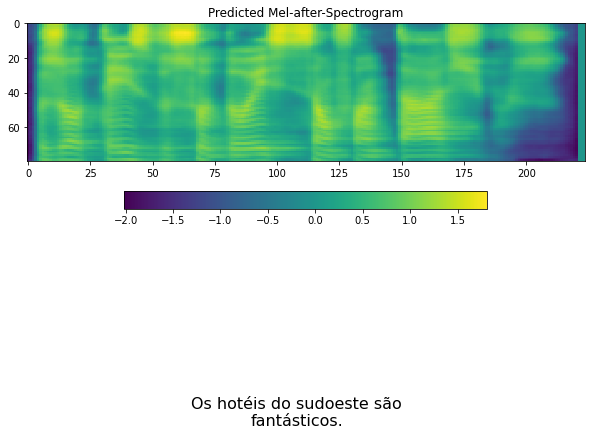

--------------------


In [11]:
for i in range(1,21,1):
    output_path = os.path.join(os.getcwd(),'tacotron_output',f'output_{i:02d}')
    os.makedirs(output_path, exist_ok=True)
    sentences_path = os.path.join(os.getcwd(),'tacotron_output','sentences', f'frases_{i:02d}.txt')

    with open(sentences_path, 'rb') as f:
        sentences = list(map(lambda l: l.decode("utf-8")[:-1], f.readlines()))

    j=0
    for sentence in sentences:
        print('-'*20)
        print(sentence)
        print(output_path)
        input_ids = processor.text_to_sequence(sentence)
        decoder_output, mel_outputs, stop_token_prediction, alignment_history = inference(input_ids)
        plot_alignment(alignment_history, output_path, j)
        mel_outputs = plot_spectrogram(mel_outputs, output_path, j, sentence)
        gl_lb = generate_wav(mel_outputs, output_path, j)
        j+=1
        print('-'*20)

---

In [18]:
# "Este é meu trabalho de conclusão do curso."
# "Bem vindos a apresentação do meu trabalho de conclusão do curso"
# "Meu nome é rodrigo"
# "Muito obrigado e até mais"


input_text = "Minha correspondência me espera em casa."
input_ids = processor.text_to_sequence(input_text)

In [19]:
decoder_output, mel_outputs, stop_token_prediction, alignment_history = inference(input_ids)

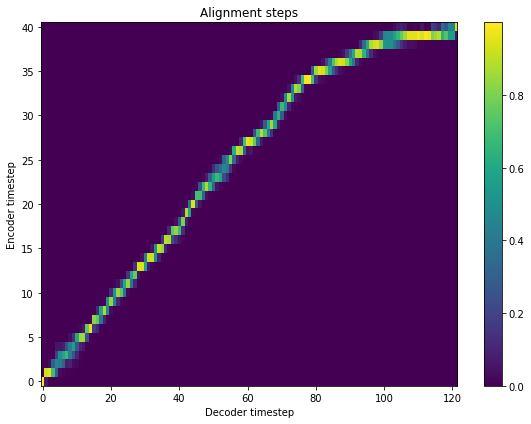

In [20]:
plot_alignment(alignment_history, './', 0)

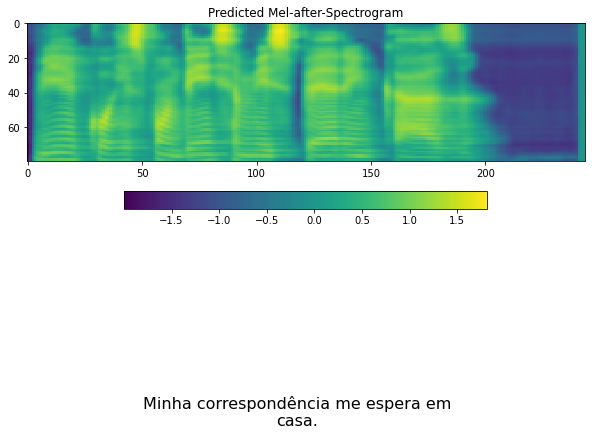

In [21]:
mel_outputs = plot_spectrogram(mel_outputs, './', 0, input_text)

In [22]:
gl_lb = generate_wav(mel_outputs, './',0)

In [23]:
sr=22050
ipd.Audio(gl_lb, rate=sr)

In [ ]:
        input_ids = processor.text_to_sequence(sentence)
        decoder_output, mel_outputs, stop_token_prediction, alignment_history = inference(input_ids)
        plot_alignment(alignment_history, output_path, j)
        mel_outputs = plot_spectrogram(mel_outputs, output_path, j, sentence)
        gl_lb = generate_wav(mel_outputs, output_path, j)